# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

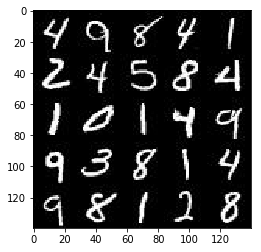

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

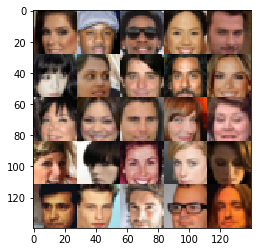

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        lrelu1 = tf.maximum(alpha * bn1, bn1)
        # 4x4x512 now
        
        upsample2 = tf.image.resize_nearest_neighbor(lrelu1, (7,7))
        conv2 = tf.layers.conv2d(upsample2, 256, 5, padding='same', activation=None)
        # x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(conv2, training=is_train)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x256 now
        
        upsample3 = tf.image.resize_nearest_neighbor(lrelu2, (14,14))
        conv3 = tf.layers.conv2d(upsample3, 128, 5, padding='same', activation=None)
        bn3 = tf.layers.batch_normalization(conv3, training=is_train)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        # 16x16x128 now
        
        # Output layer
        upsample3 = tf.image.resize_nearest_neighbor(lrelu3, (28,28))
        logits = tf.layers.conv2d(upsample3, out_channel_dim, 5, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    gen_model = generator(input_z,out_channel_dim,is_train=True)
    d_model_real,d_logits_real =discriminator(input_real,reuse=False)
    d_model_fake,d_logits_fake =discriminator(gen_model,reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels = tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels = tf.zeros_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels = tf.ones_like(d_model_fake)))

    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
   
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_opt_train = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt_train = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
        return d_opt_train, g_opt_train


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [24]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    losses = []
    steps = 0
    
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z , learning_rate_pl = model_inputs(image_width,image_height,image_channels,z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss,learning_rate_pl, beta1)
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count): 
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images * 2.0
                
                _ = sess.run(d_opt, feed_dict={input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                # sess.run(g_opt, feed_dict={input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                
                if steps % 10 == 0 :
                    train_loss_d = d_loss.eval({input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                    train_loss_g = g_loss.eval({input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))
                
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % 100 == 0:
                    show_generator_output(sess,n_images,input_z,image_channels,data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/25... Discriminator Loss: 0.4619... Generator Loss: 2.6462
Epoch 1/25... Discriminator Loss: 0.3906... Generator Loss: 3.9583
Epoch 1/25... Discriminator Loss: 0.3677... Generator Loss: 3.8449
Epoch 1/25... Discriminator Loss: 0.7656... Generator Loss: 3.0281
Epoch 1/25... Discriminator Loss: 1.0453... Generator Loss: 4.5764
Epoch 1/25... Discriminator Loss: 0.6831... Generator Loss: 2.8820
Epoch 1/25... Discriminator Loss: 0.5185... Generator Loss: 3.2898
Epoch 1/25... Discriminator Loss: 0.4767... Generator Loss: 3.0170
Epoch 1/25... Discriminator Loss: 0.5933... Generator Loss: 2.5292
Epoch 1/25... Discriminator Loss: 0.6219... Generator Loss: 2.2008


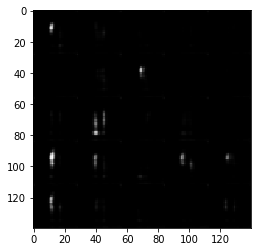

Epoch 1/25... Discriminator Loss: 1.1004... Generator Loss: 1.1556
Epoch 1/25... Discriminator Loss: 0.6982... Generator Loss: 1.9497
Epoch 1/25... Discriminator Loss: 0.8090... Generator Loss: 1.5425
Epoch 1/25... Discriminator Loss: 1.2682... Generator Loss: 0.6667
Epoch 1/25... Discriminator Loss: 0.9897... Generator Loss: 1.4328
Epoch 1/25... Discriminator Loss: 2.1235... Generator Loss: 3.2972
Epoch 1/25... Discriminator Loss: 1.2764... Generator Loss: 1.3099
Epoch 1/25... Discriminator Loss: 1.0558... Generator Loss: 1.0448
Epoch 1/25... Discriminator Loss: 1.1302... Generator Loss: 1.0799
Epoch 1/25... Discriminator Loss: 1.0854... Generator Loss: 1.0294


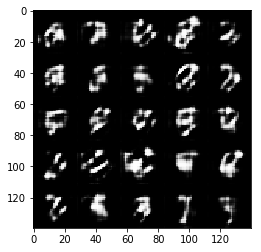

Epoch 1/25... Discriminator Loss: 1.1058... Generator Loss: 1.0616
Epoch 1/25... Discriminator Loss: 1.1063... Generator Loss: 1.0626
Epoch 1/25... Discriminator Loss: 1.0034... Generator Loss: 1.2190
Epoch 1/25... Discriminator Loss: 1.0519... Generator Loss: 1.1118
Epoch 1/25... Discriminator Loss: 1.2629... Generator Loss: 0.7075
Epoch 1/25... Discriminator Loss: 0.9590... Generator Loss: 1.7456
Epoch 1/25... Discriminator Loss: 1.1463... Generator Loss: 0.8991
Epoch 1/25... Discriminator Loss: 1.0308... Generator Loss: 1.3357
Epoch 1/25... Discriminator Loss: 0.9856... Generator Loss: 1.1072
Epoch 1/25... Discriminator Loss: 1.0220... Generator Loss: 1.3656


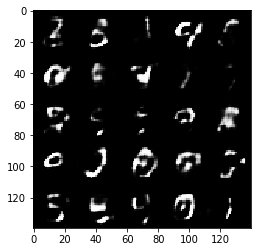

Epoch 1/25... Discriminator Loss: 1.3399... Generator Loss: 2.4100
Epoch 1/25... Discriminator Loss: 1.2802... Generator Loss: 0.6681
Epoch 1/25... Discriminator Loss: 1.0905... Generator Loss: 1.3547
Epoch 1/25... Discriminator Loss: 1.1189... Generator Loss: 0.8986
Epoch 1/25... Discriminator Loss: 0.9929... Generator Loss: 1.3809
Epoch 1/25... Discriminator Loss: 1.3192... Generator Loss: 0.6472
Epoch 1/25... Discriminator Loss: 1.0704... Generator Loss: 1.0200
Epoch 1/25... Discriminator Loss: 1.1015... Generator Loss: 0.8406
Epoch 1/25... Discriminator Loss: 1.2030... Generator Loss: 0.7086
Epoch 1/25... Discriminator Loss: 1.0944... Generator Loss: 0.9246


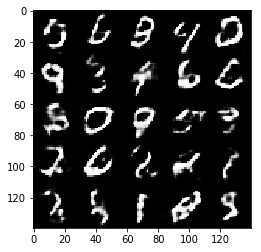

Epoch 1/25... Discriminator Loss: 1.2395... Generator Loss: 1.4584
Epoch 1/25... Discriminator Loss: 1.1169... Generator Loss: 1.1963
Epoch 1/25... Discriminator Loss: 1.3102... Generator Loss: 0.6116
Epoch 1/25... Discriminator Loss: 1.1928... Generator Loss: 0.9928
Epoch 1/25... Discriminator Loss: 1.3388... Generator Loss: 0.5786
Epoch 1/25... Discriminator Loss: 1.3170... Generator Loss: 0.6986
Epoch 2/25... Discriminator Loss: 1.4323... Generator Loss: 0.5025
Epoch 2/25... Discriminator Loss: 1.1575... Generator Loss: 0.8527
Epoch 2/25... Discriminator Loss: 1.2025... Generator Loss: 0.7869
Epoch 2/25... Discriminator Loss: 1.0806... Generator Loss: 1.1057


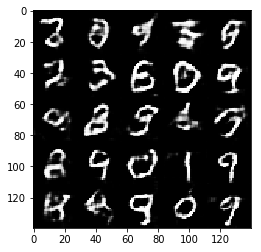

Epoch 2/25... Discriminator Loss: 1.1231... Generator Loss: 0.9940
Epoch 2/25... Discriminator Loss: 1.3860... Generator Loss: 0.5039
Epoch 2/25... Discriminator Loss: 1.3572... Generator Loss: 0.5608
Epoch 2/25... Discriminator Loss: 1.1305... Generator Loss: 1.6062
Epoch 2/25... Discriminator Loss: 1.1491... Generator Loss: 0.9504
Epoch 2/25... Discriminator Loss: 1.3015... Generator Loss: 0.6015
Epoch 2/25... Discriminator Loss: 1.1096... Generator Loss: 1.6594
Epoch 2/25... Discriminator Loss: 1.2712... Generator Loss: 0.6233
Epoch 2/25... Discriminator Loss: 1.1372... Generator Loss: 1.1727
Epoch 2/25... Discriminator Loss: 1.1219... Generator Loss: 0.8192


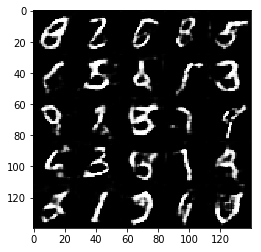

Epoch 2/25... Discriminator Loss: 1.1778... Generator Loss: 0.7424
Epoch 2/25... Discriminator Loss: 1.2164... Generator Loss: 0.6980
Epoch 2/25... Discriminator Loss: 1.2170... Generator Loss: 0.7748
Epoch 2/25... Discriminator Loss: 1.4209... Generator Loss: 0.5858
Epoch 2/25... Discriminator Loss: 1.4282... Generator Loss: 0.5061
Epoch 2/25... Discriminator Loss: 1.2264... Generator Loss: 0.7017
Epoch 2/25... Discriminator Loss: 1.4024... Generator Loss: 0.5252
Epoch 2/25... Discriminator Loss: 1.0833... Generator Loss: 1.0484
Epoch 2/25... Discriminator Loss: 1.2167... Generator Loss: 0.7331
Epoch 2/25... Discriminator Loss: 1.2127... Generator Loss: 1.2746


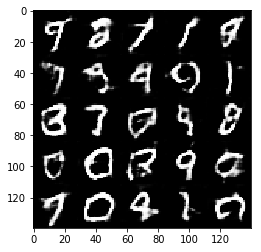

Epoch 2/25... Discriminator Loss: 1.1035... Generator Loss: 1.5120
Epoch 2/25... Discriminator Loss: 1.0620... Generator Loss: 0.9914
Epoch 2/25... Discriminator Loss: 1.2190... Generator Loss: 0.6940
Epoch 2/25... Discriminator Loss: 1.1297... Generator Loss: 1.3663
Epoch 2/25... Discriminator Loss: 1.2099... Generator Loss: 0.7329
Epoch 2/25... Discriminator Loss: 1.1160... Generator Loss: 1.4883
Epoch 2/25... Discriminator Loss: 1.3591... Generator Loss: 0.5661
Epoch 2/25... Discriminator Loss: 1.1181... Generator Loss: 1.2509
Epoch 2/25... Discriminator Loss: 1.0251... Generator Loss: 1.6326
Epoch 2/25... Discriminator Loss: 1.3711... Generator Loss: 0.5300


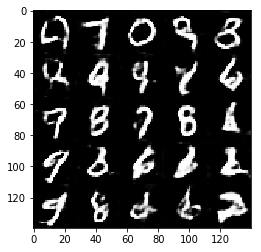

Epoch 2/25... Discriminator Loss: 1.1385... Generator Loss: 0.8581
Epoch 2/25... Discriminator Loss: 1.4365... Generator Loss: 0.4897
Epoch 2/25... Discriminator Loss: 1.2031... Generator Loss: 0.6752
Epoch 2/25... Discriminator Loss: 1.1732... Generator Loss: 1.9586
Epoch 2/25... Discriminator Loss: 1.1528... Generator Loss: 0.9160
Epoch 2/25... Discriminator Loss: 0.9412... Generator Loss: 1.4390
Epoch 2/25... Discriminator Loss: 1.0093... Generator Loss: 1.3092
Epoch 2/25... Discriminator Loss: 0.9700... Generator Loss: 1.0940
Epoch 2/25... Discriminator Loss: 1.0714... Generator Loss: 1.7814
Epoch 2/25... Discriminator Loss: 1.0992... Generator Loss: 1.0184


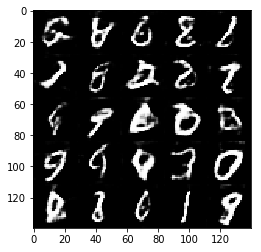

Epoch 2/25... Discriminator Loss: 1.0075... Generator Loss: 1.0427
Epoch 2/25... Discriminator Loss: 1.0285... Generator Loss: 0.9092
Epoch 2/25... Discriminator Loss: 0.9919... Generator Loss: 1.0703
Epoch 3/25... Discriminator Loss: 1.3380... Generator Loss: 0.5717
Epoch 3/25... Discriminator Loss: 0.8621... Generator Loss: 1.2369
Epoch 3/25... Discriminator Loss: 3.8989... Generator Loss: 0.0716
Epoch 3/25... Discriminator Loss: 1.0945... Generator Loss: 0.9573
Epoch 3/25... Discriminator Loss: 0.9904... Generator Loss: 1.1427
Epoch 3/25... Discriminator Loss: 1.0965... Generator Loss: 0.8691
Epoch 3/25... Discriminator Loss: 1.1366... Generator Loss: 0.8186


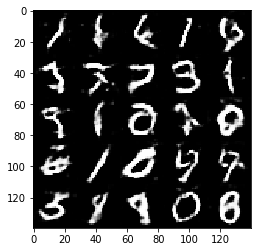

Epoch 3/25... Discriminator Loss: 1.0557... Generator Loss: 1.1363
Epoch 3/25... Discriminator Loss: 2.0018... Generator Loss: 0.2717
Epoch 3/25... Discriminator Loss: 0.9898... Generator Loss: 0.9981
Epoch 3/25... Discriminator Loss: 0.9673... Generator Loss: 0.9836
Epoch 3/25... Discriminator Loss: 1.1395... Generator Loss: 0.7534
Epoch 3/25... Discriminator Loss: 1.0717... Generator Loss: 1.1870
Epoch 3/25... Discriminator Loss: 0.8823... Generator Loss: 1.6668
Epoch 3/25... Discriminator Loss: 1.0886... Generator Loss: 0.8690
Epoch 3/25... Discriminator Loss: 0.9817... Generator Loss: 1.0770
Epoch 3/25... Discriminator Loss: 0.9614... Generator Loss: 1.0498


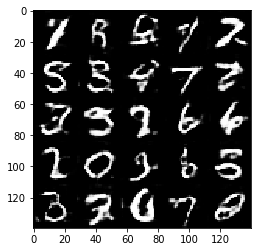

Epoch 3/25... Discriminator Loss: 0.9960... Generator Loss: 0.8939
Epoch 3/25... Discriminator Loss: 1.0135... Generator Loss: 0.8570
Epoch 3/25... Discriminator Loss: 1.7525... Generator Loss: 3.0368
Epoch 3/25... Discriminator Loss: 1.0134... Generator Loss: 0.9559
Epoch 3/25... Discriminator Loss: 0.9757... Generator Loss: 0.9401
Epoch 3/25... Discriminator Loss: 1.3039... Generator Loss: 0.6056
Epoch 3/25... Discriminator Loss: 1.0271... Generator Loss: 0.9051
Epoch 3/25... Discriminator Loss: 0.9335... Generator Loss: 1.1475
Epoch 3/25... Discriminator Loss: 4.1384... Generator Loss: 4.4435
Epoch 3/25... Discriminator Loss: 1.0837... Generator Loss: 1.4140


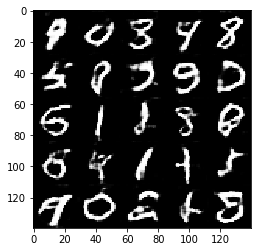

Epoch 3/25... Discriminator Loss: 1.0167... Generator Loss: 1.2682
Epoch 3/25... Discriminator Loss: 1.0197... Generator Loss: 0.8657
Epoch 3/25... Discriminator Loss: 1.1812... Generator Loss: 0.6930
Epoch 3/25... Discriminator Loss: 1.1707... Generator Loss: 0.6724
Epoch 3/25... Discriminator Loss: 1.0754... Generator Loss: 0.8229
Epoch 3/25... Discriminator Loss: 1.3687... Generator Loss: 0.5503
Epoch 3/25... Discriminator Loss: 0.9537... Generator Loss: 1.1101
Epoch 3/25... Discriminator Loss: 0.9610... Generator Loss: 0.9705
Epoch 3/25... Discriminator Loss: 0.8571... Generator Loss: 1.6206
Epoch 3/25... Discriminator Loss: 0.9170... Generator Loss: 1.1192


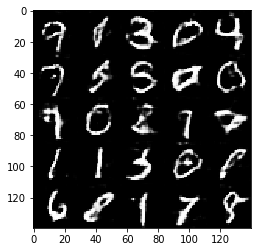

Epoch 3/25... Discriminator Loss: 0.9362... Generator Loss: 1.1819
Epoch 3/25... Discriminator Loss: 1.8345... Generator Loss: 0.3350
Epoch 3/25... Discriminator Loss: 1.0266... Generator Loss: 1.3619
Epoch 3/25... Discriminator Loss: 1.0252... Generator Loss: 1.1284
Epoch 3/25... Discriminator Loss: 0.8763... Generator Loss: 1.0900
Epoch 3/25... Discriminator Loss: 0.7777... Generator Loss: 1.2575
Epoch 3/25... Discriminator Loss: 0.8568... Generator Loss: 1.2799
Epoch 3/25... Discriminator Loss: 0.8877... Generator Loss: 1.0696
Epoch 3/25... Discriminator Loss: 1.0796... Generator Loss: 2.1215
Epoch 3/25... Discriminator Loss: 1.0005... Generator Loss: 1.1013


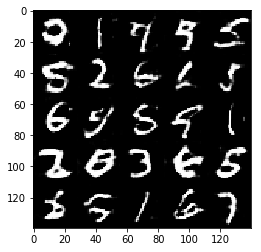

Epoch 4/25... Discriminator Loss: 0.8752... Generator Loss: 1.0901
Epoch 4/25... Discriminator Loss: 0.8661... Generator Loss: 1.1337
Epoch 4/25... Discriminator Loss: 0.8861... Generator Loss: 1.1215
Epoch 4/25... Discriminator Loss: 2.3556... Generator Loss: 3.7576
Epoch 4/25... Discriminator Loss: 0.8717... Generator Loss: 1.4712
Epoch 4/25... Discriminator Loss: 1.1394... Generator Loss: 0.7263
Epoch 4/25... Discriminator Loss: 0.9102... Generator Loss: 1.0416
Epoch 4/25... Discriminator Loss: 1.0450... Generator Loss: 0.8253
Epoch 4/25... Discriminator Loss: 0.8897... Generator Loss: 1.0957
Epoch 4/25... Discriminator Loss: 2.6814... Generator Loss: 0.1718


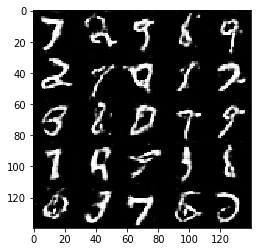

Epoch 4/25... Discriminator Loss: 1.1848... Generator Loss: 0.7857
Epoch 4/25... Discriminator Loss: 0.9453... Generator Loss: 1.0647
Epoch 4/25... Discriminator Loss: 0.7897... Generator Loss: 1.2773
Epoch 4/25... Discriminator Loss: 1.0368... Generator Loss: 0.8567
Epoch 4/25... Discriminator Loss: 1.0647... Generator Loss: 0.8396
Epoch 4/25... Discriminator Loss: 1.0033... Generator Loss: 1.2335
Epoch 4/25... Discriminator Loss: 1.0593... Generator Loss: 0.8119
Epoch 4/25... Discriminator Loss: 0.8833... Generator Loss: 1.3143
Epoch 4/25... Discriminator Loss: 0.8400... Generator Loss: 1.2048
Epoch 4/25... Discriminator Loss: 0.7694... Generator Loss: 1.3792


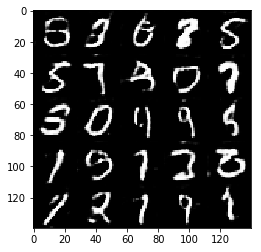

Epoch 4/25... Discriminator Loss: 0.7006... Generator Loss: 1.5627
Epoch 4/25... Discriminator Loss: 0.7618... Generator Loss: 1.3818
Epoch 4/25... Discriminator Loss: 1.3078... Generator Loss: 0.5712
Epoch 4/25... Discriminator Loss: 0.8835... Generator Loss: 1.2185
Epoch 4/25... Discriminator Loss: 0.8679... Generator Loss: 1.2581
Epoch 4/25... Discriminator Loss: 0.9467... Generator Loss: 0.9628
Epoch 4/25... Discriminator Loss: 1.0237... Generator Loss: 0.8758
Epoch 4/25... Discriminator Loss: 0.8575... Generator Loss: 1.0775
Epoch 4/25... Discriminator Loss: 1.0316... Generator Loss: 0.8194
Epoch 4/25... Discriminator Loss: 0.7931... Generator Loss: 1.1531


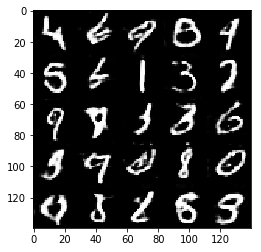

Epoch 4/25... Discriminator Loss: 0.8028... Generator Loss: 1.1816
Epoch 4/25... Discriminator Loss: 1.3409... Generator Loss: 2.9412
Epoch 4/25... Discriminator Loss: 0.9595... Generator Loss: 1.3008
Epoch 4/25... Discriminator Loss: 0.9351... Generator Loss: 1.2461
Epoch 4/25... Discriminator Loss: 0.9499... Generator Loss: 0.9450
Epoch 4/25... Discriminator Loss: 0.7181... Generator Loss: 1.6842
Epoch 4/25... Discriminator Loss: 0.6435... Generator Loss: 1.6811
Epoch 4/25... Discriminator Loss: 0.7560... Generator Loss: 1.3176
Epoch 4/25... Discriminator Loss: 1.5440... Generator Loss: 0.5241
Epoch 4/25... Discriminator Loss: 0.8617... Generator Loss: 1.1834


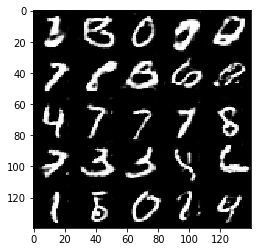

Epoch 4/25... Discriminator Loss: 0.7937... Generator Loss: 1.2403
Epoch 4/25... Discriminator Loss: 0.7351... Generator Loss: 1.2936
Epoch 4/25... Discriminator Loss: 1.6673... Generator Loss: 3.5415
Epoch 4/25... Discriminator Loss: 1.2066... Generator Loss: 0.7172
Epoch 4/25... Discriminator Loss: 0.8786... Generator Loss: 1.2555
Epoch 4/25... Discriminator Loss: 0.9522... Generator Loss: 2.0624
Epoch 4/25... Discriminator Loss: 1.0730... Generator Loss: 0.8188
Epoch 5/25... Discriminator Loss: 0.7844... Generator Loss: 1.4013
Epoch 5/25... Discriminator Loss: 0.7221... Generator Loss: 1.3435
Epoch 5/25... Discriminator Loss: 1.6957... Generator Loss: 3.2402


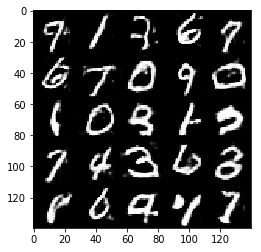

Epoch 5/25... Discriminator Loss: 1.1203... Generator Loss: 1.9358
Epoch 5/25... Discriminator Loss: 0.9287... Generator Loss: 1.3547
Epoch 5/25... Discriminator Loss: 1.0037... Generator Loss: 0.9339
Epoch 5/25... Discriminator Loss: 0.8665... Generator Loss: 1.3656
Epoch 5/25... Discriminator Loss: 0.8678... Generator Loss: 1.0466
Epoch 5/25... Discriminator Loss: 0.7125... Generator Loss: 1.4338
Epoch 5/25... Discriminator Loss: 1.0331... Generator Loss: 0.8094
Epoch 5/25... Discriminator Loss: 0.7780... Generator Loss: 1.2987
Epoch 5/25... Discriminator Loss: 0.9264... Generator Loss: 1.5216
Epoch 5/25... Discriminator Loss: 1.0046... Generator Loss: 0.9325


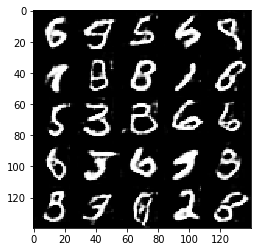

Epoch 5/25... Discriminator Loss: 0.9172... Generator Loss: 1.0224
Epoch 5/25... Discriminator Loss: 0.7443... Generator Loss: 1.2977
Epoch 5/25... Discriminator Loss: 0.6984... Generator Loss: 1.8132
Epoch 5/25... Discriminator Loss: 0.5758... Generator Loss: 1.7583
Epoch 5/25... Discriminator Loss: 1.0289... Generator Loss: 0.8145
Epoch 5/25... Discriminator Loss: 0.8539... Generator Loss: 1.1368
Epoch 5/25... Discriminator Loss: 0.7855... Generator Loss: 1.3266
Epoch 5/25... Discriminator Loss: 1.6524... Generator Loss: 3.2262
Epoch 5/25... Discriminator Loss: 0.8916... Generator Loss: 1.1095
Epoch 5/25... Discriminator Loss: 0.8920... Generator Loss: 1.2345


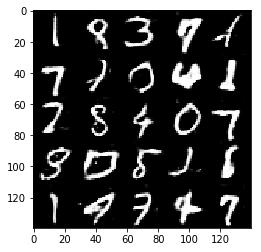

Epoch 5/25... Discriminator Loss: 0.7570... Generator Loss: 1.4305
Epoch 5/25... Discriminator Loss: 0.7757... Generator Loss: 1.2192
Epoch 5/25... Discriminator Loss: 0.8821... Generator Loss: 1.1311
Epoch 5/25... Discriminator Loss: 0.9447... Generator Loss: 1.0225
Epoch 5/25... Discriminator Loss: 0.7359... Generator Loss: 1.6909
Epoch 5/25... Discriminator Loss: 0.7277... Generator Loss: 1.4347
Epoch 5/25... Discriminator Loss: 0.8124... Generator Loss: 1.2323
Epoch 5/25... Discriminator Loss: 1.0821... Generator Loss: 0.7665
Epoch 5/25... Discriminator Loss: 1.0351... Generator Loss: 0.8216
Epoch 5/25... Discriminator Loss: 2.7715... Generator Loss: 0.1983


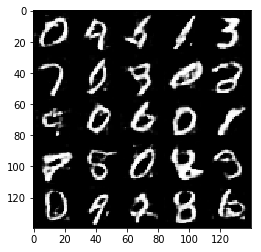

Epoch 5/25... Discriminator Loss: 1.0428... Generator Loss: 0.9201
Epoch 5/25... Discriminator Loss: 1.0278... Generator Loss: 0.8770
Epoch 5/25... Discriminator Loss: 0.8765... Generator Loss: 1.0183
Epoch 5/25... Discriminator Loss: 0.7170... Generator Loss: 1.5511
Epoch 5/25... Discriminator Loss: 0.6723... Generator Loss: 1.5886
Epoch 5/25... Discriminator Loss: 0.7752... Generator Loss: 1.3026
Epoch 5/25... Discriminator Loss: 0.9148... Generator Loss: 2.8401
Epoch 5/25... Discriminator Loss: 1.2106... Generator Loss: 0.7120
Epoch 5/25... Discriminator Loss: 0.8418... Generator Loss: 1.1613
Epoch 5/25... Discriminator Loss: 0.8992... Generator Loss: 1.0711


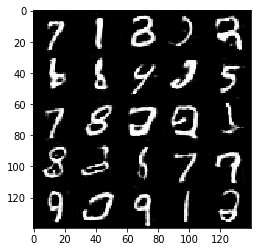

Epoch 5/25... Discriminator Loss: 1.0879... Generator Loss: 0.8306
Epoch 5/25... Discriminator Loss: 0.7029... Generator Loss: 1.4636
Epoch 5/25... Discriminator Loss: 0.5771... Generator Loss: 1.7788
Epoch 5/25... Discriminator Loss: 1.8785... Generator Loss: 0.3393
Epoch 6/25... Discriminator Loss: 0.8764... Generator Loss: 1.4244
Epoch 6/25... Discriminator Loss: 1.0519... Generator Loss: 0.8600
Epoch 6/25... Discriminator Loss: 0.7604... Generator Loss: 1.4927
Epoch 6/25... Discriminator Loss: 0.7540... Generator Loss: 1.3034
Epoch 6/25... Discriminator Loss: 0.6833... Generator Loss: 1.8000
Epoch 6/25... Discriminator Loss: 0.6782... Generator Loss: 1.5201


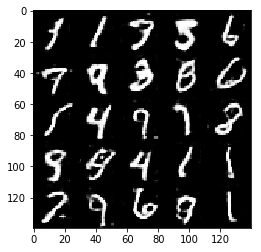

Epoch 6/25... Discriminator Loss: 0.6844... Generator Loss: 1.9024
Epoch 6/25... Discriminator Loss: 1.2150... Generator Loss: 0.6717
Epoch 6/25... Discriminator Loss: 1.0395... Generator Loss: 0.8912
Epoch 6/25... Discriminator Loss: 0.9581... Generator Loss: 0.9420
Epoch 6/25... Discriminator Loss: 0.9460... Generator Loss: 1.0546
Epoch 6/25... Discriminator Loss: 0.9506... Generator Loss: 0.9167
Epoch 6/25... Discriminator Loss: 0.9032... Generator Loss: 1.0120
Epoch 6/25... Discriminator Loss: 0.7316... Generator Loss: 1.4084
Epoch 6/25... Discriminator Loss: 0.7981... Generator Loss: 1.2880
Epoch 6/25... Discriminator Loss: 1.2151... Generator Loss: 0.6491


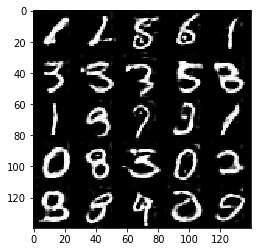

Epoch 6/25... Discriminator Loss: 1.1259... Generator Loss: 0.7630
Epoch 6/25... Discriminator Loss: 0.6857... Generator Loss: 1.5461
Epoch 6/25... Discriminator Loss: 0.6608... Generator Loss: 1.5602
Epoch 6/25... Discriminator Loss: 1.0740... Generator Loss: 0.7490
Epoch 6/25... Discriminator Loss: 1.2451... Generator Loss: 0.6521
Epoch 6/25... Discriminator Loss: 1.0797... Generator Loss: 2.4224
Epoch 6/25... Discriminator Loss: 0.7844... Generator Loss: 1.4424
Epoch 6/25... Discriminator Loss: 0.5865... Generator Loss: 1.7400
Epoch 6/25... Discriminator Loss: 0.8414... Generator Loss: 1.0940
Epoch 6/25... Discriminator Loss: 0.5881... Generator Loss: 1.9387


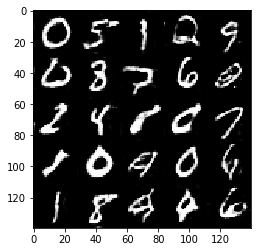

Epoch 6/25... Discriminator Loss: 1.2024... Generator Loss: 0.6843
Epoch 6/25... Discriminator Loss: 0.8819... Generator Loss: 1.1144
Epoch 6/25... Discriminator Loss: 0.8873... Generator Loss: 1.0450
Epoch 6/25... Discriminator Loss: 0.7083... Generator Loss: 1.3881
Epoch 6/25... Discriminator Loss: 0.7192... Generator Loss: 1.5444
Epoch 6/25... Discriminator Loss: 1.2254... Generator Loss: 0.6974
Epoch 6/25... Discriminator Loss: 0.9551... Generator Loss: 1.8729
Epoch 6/25... Discriminator Loss: 0.8673... Generator Loss: 1.3177
Epoch 6/25... Discriminator Loss: 1.5832... Generator Loss: 0.4428
Epoch 6/25... Discriminator Loss: 1.0311... Generator Loss: 0.8204


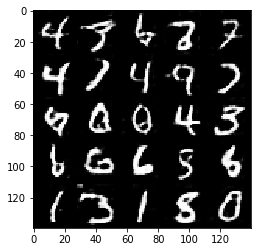

Epoch 6/25... Discriminator Loss: 0.7119... Generator Loss: 1.4983
Epoch 6/25... Discriminator Loss: 0.8178... Generator Loss: 1.2179
Epoch 6/25... Discriminator Loss: 0.6304... Generator Loss: 1.7972
Epoch 6/25... Discriminator Loss: 0.8632... Generator Loss: 1.1028
Epoch 6/25... Discriminator Loss: 0.8888... Generator Loss: 1.4211
Epoch 6/25... Discriminator Loss: 0.7763... Generator Loss: 1.2557
Epoch 6/25... Discriminator Loss: 0.6740... Generator Loss: 1.4857
Epoch 6/25... Discriminator Loss: 0.7053... Generator Loss: 1.4280
Epoch 6/25... Discriminator Loss: 0.5853... Generator Loss: 2.0425
Epoch 6/25... Discriminator Loss: 0.9012... Generator Loss: 1.0253


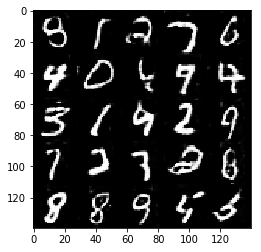

Epoch 7/25... Discriminator Loss: 1.1413... Generator Loss: 0.7381
Epoch 7/25... Discriminator Loss: 0.9935... Generator Loss: 0.8836
Epoch 7/25... Discriminator Loss: 0.7369... Generator Loss: 1.3432
Epoch 7/25... Discriminator Loss: 1.0354... Generator Loss: 0.9645
Epoch 7/25... Discriminator Loss: 0.9049... Generator Loss: 1.6346
Epoch 7/25... Discriminator Loss: 0.8710... Generator Loss: 1.2108
Epoch 7/25... Discriminator Loss: 0.9139... Generator Loss: 1.8496
Epoch 7/25... Discriminator Loss: 0.8680... Generator Loss: 1.0739
Epoch 7/25... Discriminator Loss: 1.2052... Generator Loss: 0.6860
Epoch 7/25... Discriminator Loss: 0.7294... Generator Loss: 1.8133


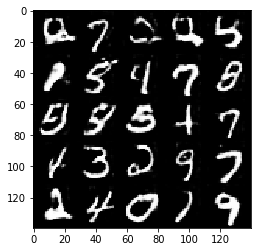

Epoch 7/25... Discriminator Loss: 0.7574... Generator Loss: 1.4827
Epoch 7/25... Discriminator Loss: 0.7569... Generator Loss: 1.2495
Epoch 7/25... Discriminator Loss: 0.6810... Generator Loss: 1.5489
Epoch 7/25... Discriminator Loss: 0.6875... Generator Loss: 1.4419
Epoch 7/25... Discriminator Loss: 0.7566... Generator Loss: 2.2227
Epoch 7/25... Discriminator Loss: 1.0698... Generator Loss: 1.2416
Epoch 7/25... Discriminator Loss: 0.7307... Generator Loss: 1.5268
Epoch 7/25... Discriminator Loss: 0.7942... Generator Loss: 1.2657
Epoch 7/25... Discriminator Loss: 0.7081... Generator Loss: 1.4257
Epoch 7/25... Discriminator Loss: 0.6506... Generator Loss: 1.6531


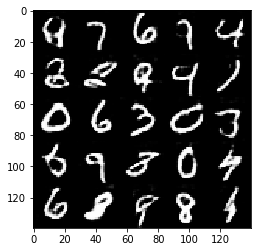

Epoch 7/25... Discriminator Loss: 0.5959... Generator Loss: 2.0925
Epoch 7/25... Discriminator Loss: 0.8608... Generator Loss: 1.0558
Epoch 7/25... Discriminator Loss: 1.0193... Generator Loss: 0.8332
Epoch 7/25... Discriminator Loss: 0.6178... Generator Loss: 1.7101
Epoch 7/25... Discriminator Loss: 0.6558... Generator Loss: 1.4826
Epoch 7/25... Discriminator Loss: 0.6489... Generator Loss: 2.0547
Epoch 7/25... Discriminator Loss: 2.4895... Generator Loss: 4.8862
Epoch 7/25... Discriminator Loss: 0.9624... Generator Loss: 1.0124
Epoch 7/25... Discriminator Loss: 1.0626... Generator Loss: 0.9197
Epoch 7/25... Discriminator Loss: 0.6141... Generator Loss: 1.6730


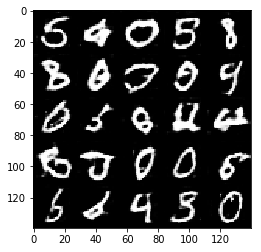

Epoch 7/25... Discriminator Loss: 1.2721... Generator Loss: 0.5950
Epoch 7/25... Discriminator Loss: 0.6617... Generator Loss: 1.7010
Epoch 7/25... Discriminator Loss: 0.7748... Generator Loss: 1.2633
Epoch 7/25... Discriminator Loss: 0.7747... Generator Loss: 1.3227
Epoch 7/25... Discriminator Loss: 1.1412... Generator Loss: 1.0349
Epoch 7/25... Discriminator Loss: 0.8628... Generator Loss: 1.4279
Epoch 7/25... Discriminator Loss: 0.9709... Generator Loss: 1.0464
Epoch 7/25... Discriminator Loss: 0.9687... Generator Loss: 1.0971
Epoch 7/25... Discriminator Loss: 1.0192... Generator Loss: 0.8501
Epoch 7/25... Discriminator Loss: 0.6442... Generator Loss: 1.5824


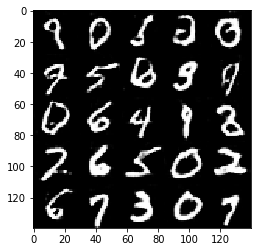

Epoch 7/25... Discriminator Loss: 0.6797... Generator Loss: 1.6869
Epoch 7/25... Discriminator Loss: 0.6235... Generator Loss: 1.8274
Epoch 7/25... Discriminator Loss: 0.8536... Generator Loss: 1.0996
Epoch 7/25... Discriminator Loss: 0.6378... Generator Loss: 1.5164
Epoch 7/25... Discriminator Loss: 1.7569... Generator Loss: 3.4234
Epoch 7/25... Discriminator Loss: 0.8866... Generator Loss: 1.8959
Epoch 7/25... Discriminator Loss: 0.9854... Generator Loss: 0.9128
Epoch 8/25... Discriminator Loss: 0.7838... Generator Loss: 1.2891
Epoch 8/25... Discriminator Loss: 0.8029... Generator Loss: 1.1907
Epoch 8/25... Discriminator Loss: 1.0007... Generator Loss: 0.9546


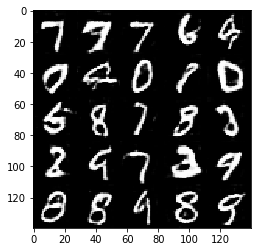

Epoch 8/25... Discriminator Loss: 0.7169... Generator Loss: 1.3887
Epoch 8/25... Discriminator Loss: 0.8302... Generator Loss: 1.1712
Epoch 8/25... Discriminator Loss: 1.1867... Generator Loss: 0.6874
Epoch 8/25... Discriminator Loss: 0.8373... Generator Loss: 1.4803
Epoch 8/25... Discriminator Loss: 0.9723... Generator Loss: 0.9164
Epoch 8/25... Discriminator Loss: 0.5984... Generator Loss: 1.8401
Epoch 8/25... Discriminator Loss: 1.0499... Generator Loss: 0.8246
Epoch 8/25... Discriminator Loss: 0.6795... Generator Loss: 1.5642
Epoch 8/25... Discriminator Loss: 0.6520... Generator Loss: 1.5185
Epoch 8/25... Discriminator Loss: 0.5379... Generator Loss: 1.9998


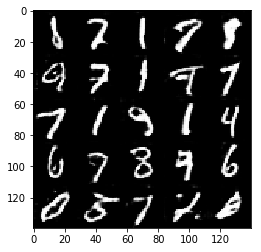

Epoch 8/25... Discriminator Loss: 0.6795... Generator Loss: 1.5022
Epoch 8/25... Discriminator Loss: 0.7746... Generator Loss: 1.3063
Epoch 8/25... Discriminator Loss: 1.0792... Generator Loss: 0.8064
Epoch 8/25... Discriminator Loss: 0.8453... Generator Loss: 2.6461
Epoch 8/25... Discriminator Loss: 0.6973... Generator Loss: 2.1148
Epoch 8/25... Discriminator Loss: 0.7125... Generator Loss: 1.4270
Epoch 8/25... Discriminator Loss: 0.6814... Generator Loss: 1.5124
Epoch 8/25... Discriminator Loss: 0.8399... Generator Loss: 1.0907
Epoch 8/25... Discriminator Loss: 0.4605... Generator Loss: 2.7856
Epoch 8/25... Discriminator Loss: 1.0715... Generator Loss: 0.8591


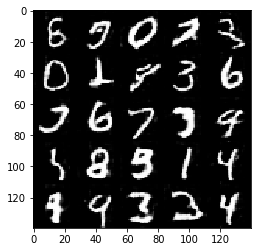

Epoch 8/25... Discriminator Loss: 0.7321... Generator Loss: 1.4567
Epoch 8/25... Discriminator Loss: 0.6760... Generator Loss: 1.5418
Epoch 8/25... Discriminator Loss: 1.3472... Generator Loss: 3.5343
Epoch 8/25... Discriminator Loss: 0.9067... Generator Loss: 0.9930
Epoch 8/25... Discriminator Loss: 0.7208... Generator Loss: 1.3280
Epoch 8/25... Discriminator Loss: 0.8132... Generator Loss: 1.1501
Epoch 8/25... Discriminator Loss: 0.6205... Generator Loss: 1.6787
Epoch 8/25... Discriminator Loss: 0.6514... Generator Loss: 1.5594
Epoch 8/25... Discriminator Loss: 1.1605... Generator Loss: 0.7535
Epoch 8/25... Discriminator Loss: 1.0987... Generator Loss: 2.6101


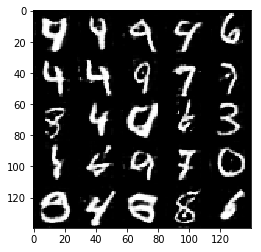

Epoch 8/25... Discriminator Loss: 0.8815... Generator Loss: 1.1435
Epoch 8/25... Discriminator Loss: 0.8214... Generator Loss: 1.4453
Epoch 8/25... Discriminator Loss: 0.6827... Generator Loss: 1.8473
Epoch 8/25... Discriminator Loss: 0.6126... Generator Loss: 1.7750
Epoch 8/25... Discriminator Loss: 0.7260... Generator Loss: 1.3842
Epoch 8/25... Discriminator Loss: 1.1616... Generator Loss: 0.8133
Epoch 8/25... Discriminator Loss: 1.0458... Generator Loss: 0.8220
Epoch 8/25... Discriminator Loss: 0.6665... Generator Loss: 1.5892
Epoch 8/25... Discriminator Loss: 0.6879... Generator Loss: 1.4710
Epoch 8/25... Discriminator Loss: 0.6407... Generator Loss: 1.5049


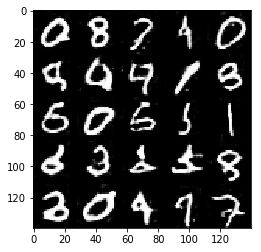

Epoch 8/25... Discriminator Loss: 1.3286... Generator Loss: 0.5940
Epoch 8/25... Discriminator Loss: 0.8412... Generator Loss: 1.5848
Epoch 8/25... Discriminator Loss: 0.8200... Generator Loss: 1.2039
Epoch 8/25... Discriminator Loss: 0.9329... Generator Loss: 1.0853
Epoch 9/25... Discriminator Loss: 0.9463... Generator Loss: 1.0021
Epoch 9/25... Discriminator Loss: 1.0100... Generator Loss: 2.9061
Epoch 9/25... Discriminator Loss: 0.6867... Generator Loss: 2.1944
Epoch 9/25... Discriminator Loss: 0.7819... Generator Loss: 1.2459
Epoch 9/25... Discriminator Loss: 0.8138... Generator Loss: 1.1739
Epoch 9/25... Discriminator Loss: 0.7587... Generator Loss: 1.2410


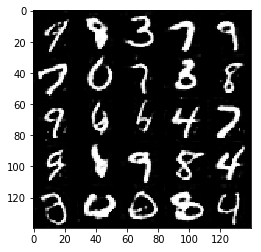

Epoch 9/25... Discriminator Loss: 0.8383... Generator Loss: 1.4775
Epoch 9/25... Discriminator Loss: 1.2024... Generator Loss: 0.7902
Epoch 9/25... Discriminator Loss: 0.7573... Generator Loss: 1.2503
Epoch 9/25... Discriminator Loss: 0.7875... Generator Loss: 1.1661
Epoch 9/25... Discriminator Loss: 0.7786... Generator Loss: 1.2414
Epoch 9/25... Discriminator Loss: 0.7225... Generator Loss: 1.4040
Epoch 9/25... Discriminator Loss: 0.8258... Generator Loss: 1.1089
Epoch 9/25... Discriminator Loss: 0.9771... Generator Loss: 0.9404
Epoch 9/25... Discriminator Loss: 0.6814... Generator Loss: 1.4875
Epoch 9/25... Discriminator Loss: 0.7959... Generator Loss: 1.1939


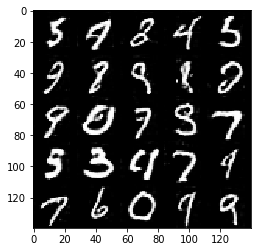

Epoch 9/25... Discriminator Loss: 1.0204... Generator Loss: 0.9109
Epoch 9/25... Discriminator Loss: 0.9095... Generator Loss: 0.9712
Epoch 9/25... Discriminator Loss: 0.8161... Generator Loss: 1.1445
Epoch 9/25... Discriminator Loss: 2.2036... Generator Loss: 0.3116
Epoch 9/25... Discriminator Loss: 1.5451... Generator Loss: 0.4730
Epoch 9/25... Discriminator Loss: 0.7858... Generator Loss: 1.3344
Epoch 9/25... Discriminator Loss: 1.0292... Generator Loss: 0.8653
Epoch 9/25... Discriminator Loss: 0.6902... Generator Loss: 1.5473
Epoch 9/25... Discriminator Loss: 0.9724... Generator Loss: 0.9135
Epoch 9/25... Discriminator Loss: 1.1620... Generator Loss: 0.7418


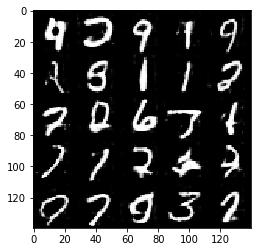

Epoch 9/25... Discriminator Loss: 1.6265... Generator Loss: 4.2595
Epoch 9/25... Discriminator Loss: 0.7543... Generator Loss: 1.2428
Epoch 9/25... Discriminator Loss: 0.9686... Generator Loss: 0.9396
Epoch 9/25... Discriminator Loss: 0.6483... Generator Loss: 1.6056
Epoch 9/25... Discriminator Loss: 0.9276... Generator Loss: 1.0132
Epoch 9/25... Discriminator Loss: 0.6307... Generator Loss: 1.8430
Epoch 9/25... Discriminator Loss: 0.8733... Generator Loss: 1.1289
Epoch 9/25... Discriminator Loss: 0.9068... Generator Loss: 1.0823
Epoch 9/25... Discriminator Loss: 0.6145... Generator Loss: 1.7945
Epoch 9/25... Discriminator Loss: 1.1419... Generator Loss: 3.4201


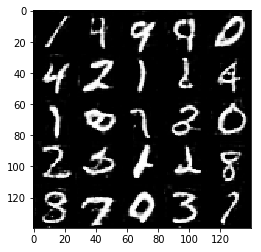

Epoch 9/25... Discriminator Loss: 0.6253... Generator Loss: 1.7554
Epoch 9/25... Discriminator Loss: 0.7344... Generator Loss: 1.3245
Epoch 9/25... Discriminator Loss: 0.7286... Generator Loss: 1.3797
Epoch 9/25... Discriminator Loss: 0.5631... Generator Loss: 1.9145
Epoch 9/25... Discriminator Loss: 0.7692... Generator Loss: 1.2241
Epoch 9/25... Discriminator Loss: 0.7276... Generator Loss: 1.3615
Epoch 9/25... Discriminator Loss: 0.6728... Generator Loss: 1.9421
Epoch 9/25... Discriminator Loss: 0.5522... Generator Loss: 1.9079
Epoch 9/25... Discriminator Loss: 0.7136... Generator Loss: 1.3859
Epoch 9/25... Discriminator Loss: 0.6786... Generator Loss: 2.0028


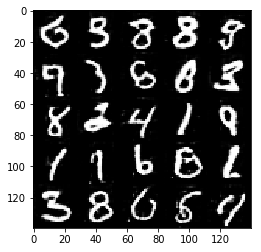

Epoch 9/25... Discriminator Loss: 0.6315... Generator Loss: 1.6655
Epoch 10/25... Discriminator Loss: 0.5901... Generator Loss: 1.7271
Epoch 10/25... Discriminator Loss: 0.6535... Generator Loss: 1.5301
Epoch 10/25... Discriminator Loss: 0.6750... Generator Loss: 1.9704
Epoch 10/25... Discriminator Loss: 0.8086... Generator Loss: 1.4544
Epoch 10/25... Discriminator Loss: 0.9076... Generator Loss: 0.9798
Epoch 10/25... Discriminator Loss: 0.9667... Generator Loss: 0.9349
Epoch 10/25... Discriminator Loss: 0.6600... Generator Loss: 1.6264
Epoch 10/25... Discriminator Loss: 0.6528... Generator Loss: 1.6338
Epoch 10/25... Discriminator Loss: 1.0968... Generator Loss: 2.5597


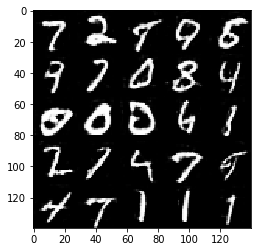

Epoch 10/25... Discriminator Loss: 0.8640... Generator Loss: 1.5248
Epoch 10/25... Discriminator Loss: 0.7569... Generator Loss: 1.6688
Epoch 10/25... Discriminator Loss: 0.7775... Generator Loss: 1.3020
Epoch 10/25... Discriminator Loss: 0.8178... Generator Loss: 1.1507
Epoch 10/25... Discriminator Loss: 0.5534... Generator Loss: 2.0737
Epoch 10/25... Discriminator Loss: 0.6087... Generator Loss: 1.9358
Epoch 10/25... Discriminator Loss: 0.5828... Generator Loss: 2.0626
Epoch 10/25... Discriminator Loss: 0.7216... Generator Loss: 1.4144
Epoch 10/25... Discriminator Loss: 0.7682... Generator Loss: 1.8092
Epoch 10/25... Discriminator Loss: 1.1035... Generator Loss: 0.7911


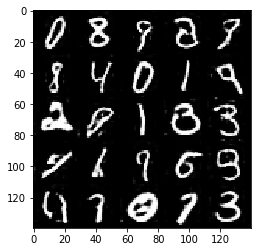

Epoch 10/25... Discriminator Loss: 1.1876... Generator Loss: 2.2649
Epoch 10/25... Discriminator Loss: 0.8794... Generator Loss: 1.0850
Epoch 10/25... Discriminator Loss: 0.7433... Generator Loss: 1.4457
Epoch 10/25... Discriminator Loss: 0.8330... Generator Loss: 1.1577
Epoch 10/25... Discriminator Loss: 0.7531... Generator Loss: 1.2819
Epoch 10/25... Discriminator Loss: 0.6310... Generator Loss: 1.5855
Epoch 10/25... Discriminator Loss: 0.5934... Generator Loss: 1.7515
Epoch 10/25... Discriminator Loss: 0.9035... Generator Loss: 1.0206
Epoch 10/25... Discriminator Loss: 0.6461... Generator Loss: 1.5781
Epoch 10/25... Discriminator Loss: 0.5881... Generator Loss: 1.8729


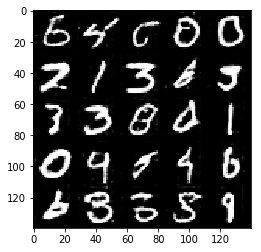

Epoch 10/25... Discriminator Loss: 0.9586... Generator Loss: 0.9042
Epoch 10/25... Discriminator Loss: 0.7513... Generator Loss: 1.2729
Epoch 10/25... Discriminator Loss: 0.6308... Generator Loss: 1.7842
Epoch 10/25... Discriminator Loss: 0.6639... Generator Loss: 1.5471
Epoch 10/25... Discriminator Loss: 0.7557... Generator Loss: 1.8105
Epoch 10/25... Discriminator Loss: 0.6970... Generator Loss: 1.4066
Epoch 10/25... Discriminator Loss: 0.6636... Generator Loss: 1.4986
Epoch 10/25... Discriminator Loss: 0.6578... Generator Loss: 1.7651
Epoch 10/25... Discriminator Loss: 1.0394... Generator Loss: 1.9406
Epoch 10/25... Discriminator Loss: 0.9333... Generator Loss: 1.0220


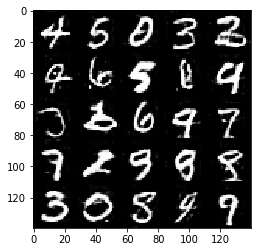

Epoch 10/25... Discriminator Loss: 0.7878... Generator Loss: 1.7075
Epoch 10/25... Discriminator Loss: 0.8085... Generator Loss: 1.3872
Epoch 10/25... Discriminator Loss: 0.7671... Generator Loss: 1.2803
Epoch 10/25... Discriminator Loss: 0.7893... Generator Loss: 1.9551
Epoch 10/25... Discriminator Loss: 0.7336... Generator Loss: 1.7927
Epoch 10/25... Discriminator Loss: 0.7289... Generator Loss: 1.5189
Epoch 10/25... Discriminator Loss: 0.7518... Generator Loss: 1.3780
Epoch 10/25... Discriminator Loss: 0.5981... Generator Loss: 1.8235
Epoch 11/25... Discriminator Loss: 0.8285... Generator Loss: 1.1030
Epoch 11/25... Discriminator Loss: 1.0258... Generator Loss: 0.8479


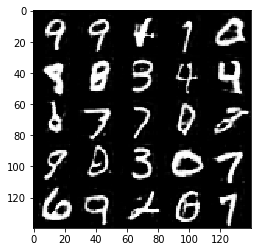

Epoch 11/25... Discriminator Loss: 0.6977... Generator Loss: 1.4251
Epoch 11/25... Discriminator Loss: 0.5511... Generator Loss: 1.9540
Epoch 11/25... Discriminator Loss: 0.5960... Generator Loss: 1.8978
Epoch 11/25... Discriminator Loss: 0.8872... Generator Loss: 1.1581
Epoch 11/25... Discriminator Loss: 0.9229... Generator Loss: 0.9993
Epoch 11/25... Discriminator Loss: 1.0246... Generator Loss: 0.8597
Epoch 11/25... Discriminator Loss: 0.8379... Generator Loss: 1.1210
Epoch 11/25... Discriminator Loss: 0.6445... Generator Loss: 1.5980
Epoch 11/25... Discriminator Loss: 1.1851... Generator Loss: 0.7166
Epoch 11/25... Discriminator Loss: 0.7150... Generator Loss: 1.3835


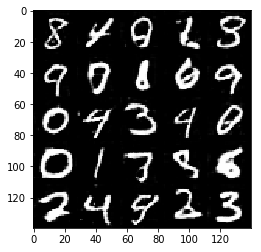

Epoch 11/25... Discriminator Loss: 0.5229... Generator Loss: 2.0732
Epoch 11/25... Discriminator Loss: 0.6335... Generator Loss: 1.6274
Epoch 11/25... Discriminator Loss: 0.6303... Generator Loss: 1.6142
Epoch 11/25... Discriminator Loss: 0.7952... Generator Loss: 1.1426
Epoch 11/25... Discriminator Loss: 1.3548... Generator Loss: 0.5934
Epoch 11/25... Discriminator Loss: 0.8038... Generator Loss: 1.6377
Epoch 11/25... Discriminator Loss: 0.8192... Generator Loss: 1.1409
Epoch 11/25... Discriminator Loss: 0.9531... Generator Loss: 0.9973
Epoch 11/25... Discriminator Loss: 0.8437... Generator Loss: 1.0759
Epoch 11/25... Discriminator Loss: 0.6418... Generator Loss: 1.4947


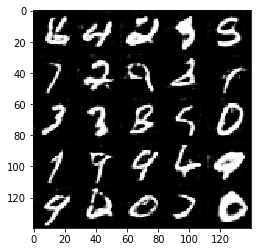

Epoch 11/25... Discriminator Loss: 0.8802... Generator Loss: 1.0778
Epoch 11/25... Discriminator Loss: 0.6956... Generator Loss: 1.4277
Epoch 11/25... Discriminator Loss: 0.5967... Generator Loss: 1.7034
Epoch 11/25... Discriminator Loss: 0.6195... Generator Loss: 1.9282
Epoch 11/25... Discriminator Loss: 1.8466... Generator Loss: 0.3755
Epoch 11/25... Discriminator Loss: 0.7920... Generator Loss: 1.3461
Epoch 11/25... Discriminator Loss: 0.5952... Generator Loss: 1.7593
Epoch 11/25... Discriminator Loss: 0.6836... Generator Loss: 1.5131
Epoch 11/25... Discriminator Loss: 0.4697... Generator Loss: 2.4084
Epoch 11/25... Discriminator Loss: 1.1527... Generator Loss: 2.8367


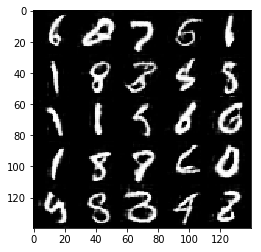

Epoch 11/25... Discriminator Loss: 0.8752... Generator Loss: 1.4310
Epoch 11/25... Discriminator Loss: 0.8223... Generator Loss: 1.3817
Epoch 11/25... Discriminator Loss: 1.1957... Generator Loss: 0.6778
Epoch 11/25... Discriminator Loss: 0.7306... Generator Loss: 1.4291
Epoch 11/25... Discriminator Loss: 0.9657... Generator Loss: 2.7104
Epoch 11/25... Discriminator Loss: 1.0255... Generator Loss: 1.7788
Epoch 11/25... Discriminator Loss: 0.8466... Generator Loss: 1.2817
Epoch 11/25... Discriminator Loss: 0.8313... Generator Loss: 1.1266
Epoch 11/25... Discriminator Loss: 0.7433... Generator Loss: 1.2909
Epoch 11/25... Discriminator Loss: 0.6886... Generator Loss: 1.4881


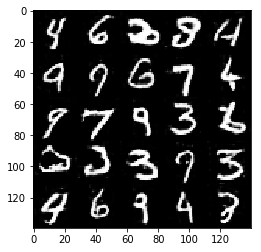

Epoch 11/25... Discriminator Loss: 0.5893... Generator Loss: 2.1863
Epoch 11/25... Discriminator Loss: 0.5864... Generator Loss: 1.9148
Epoch 11/25... Discriminator Loss: 0.6192... Generator Loss: 1.7520
Epoch 11/25... Discriminator Loss: 0.8570... Generator Loss: 1.0528
Epoch 12/25... Discriminator Loss: 0.8172... Generator Loss: 1.1545
Epoch 12/25... Discriminator Loss: 0.6847... Generator Loss: 1.4134
Epoch 12/25... Discriminator Loss: 0.5950... Generator Loss: 1.8428
Epoch 12/25... Discriminator Loss: 0.6265... Generator Loss: 1.6346
Epoch 12/25... Discriminator Loss: 0.7247... Generator Loss: 1.3864
Epoch 12/25... Discriminator Loss: 0.6251... Generator Loss: 1.5992


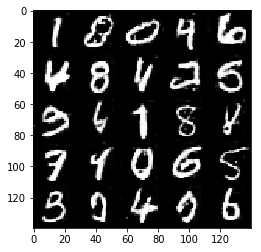

Epoch 12/25... Discriminator Loss: 0.5891... Generator Loss: 1.6989
Epoch 12/25... Discriminator Loss: 0.5270... Generator Loss: 1.9984
Epoch 12/25... Discriminator Loss: 0.8518... Generator Loss: 1.1462
Epoch 12/25... Discriminator Loss: 0.6036... Generator Loss: 2.1867
Epoch 12/25... Discriminator Loss: 0.6273... Generator Loss: 1.6009
Epoch 12/25... Discriminator Loss: 0.6578... Generator Loss: 1.5622
Epoch 12/25... Discriminator Loss: 0.6249... Generator Loss: 1.8081
Epoch 12/25... Discriminator Loss: 0.6502... Generator Loss: 1.5501
Epoch 12/25... Discriminator Loss: 0.6808... Generator Loss: 1.4830
Epoch 12/25... Discriminator Loss: 0.5976... Generator Loss: 1.8604


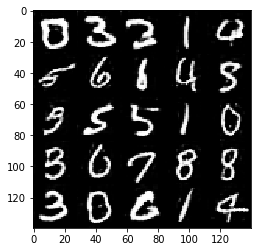

Epoch 12/25... Discriminator Loss: 0.5693... Generator Loss: 1.8859
Epoch 12/25... Discriminator Loss: 0.7702... Generator Loss: 1.4680
Epoch 12/25... Discriminator Loss: 1.8400... Generator Loss: 0.4108
Epoch 12/25... Discriminator Loss: 0.6990... Generator Loss: 1.4122
Epoch 12/25... Discriminator Loss: 0.5112... Generator Loss: 2.3539
Epoch 12/25... Discriminator Loss: 0.7775... Generator Loss: 2.7448
Epoch 12/25... Discriminator Loss: 0.9802... Generator Loss: 0.9340
Epoch 12/25... Discriminator Loss: 0.9661... Generator Loss: 0.9251
Epoch 12/25... Discriminator Loss: 0.5831... Generator Loss: 1.7244
Epoch 12/25... Discriminator Loss: 0.6580... Generator Loss: 2.1579


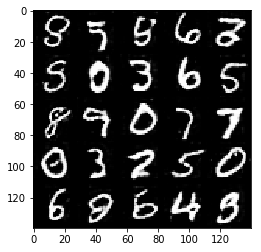

Epoch 12/25... Discriminator Loss: 0.5080... Generator Loss: 2.1576
Epoch 12/25... Discriminator Loss: 0.6690... Generator Loss: 1.4717
Epoch 12/25... Discriminator Loss: 0.6937... Generator Loss: 1.4497
Epoch 12/25... Discriminator Loss: 0.7124... Generator Loss: 1.3537
Epoch 12/25... Discriminator Loss: 0.7013... Generator Loss: 1.3747
Epoch 12/25... Discriminator Loss: 2.7337... Generator Loss: 4.7012
Epoch 12/25... Discriminator Loss: 0.8970... Generator Loss: 1.4151
Epoch 12/25... Discriminator Loss: 0.9280... Generator Loss: 1.0155
Epoch 12/25... Discriminator Loss: 0.8571... Generator Loss: 1.3894
Epoch 12/25... Discriminator Loss: 0.9960... Generator Loss: 0.8779


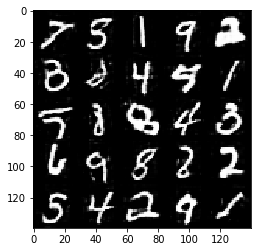

Epoch 12/25... Discriminator Loss: 0.8645... Generator Loss: 1.0991
Epoch 12/25... Discriminator Loss: 1.6212... Generator Loss: 3.5333
Epoch 12/25... Discriminator Loss: 1.4162... Generator Loss: 0.5607
Epoch 12/25... Discriminator Loss: 0.6555... Generator Loss: 1.6910
Epoch 12/25... Discriminator Loss: 1.1217... Generator Loss: 0.7646
Epoch 12/25... Discriminator Loss: 0.8033... Generator Loss: 2.9797
Epoch 12/25... Discriminator Loss: 0.9503... Generator Loss: 1.0466
Epoch 12/25... Discriminator Loss: 0.8374... Generator Loss: 1.2000
Epoch 12/25... Discriminator Loss: 0.6935... Generator Loss: 1.7766
Epoch 12/25... Discriminator Loss: 0.8399... Generator Loss: 2.4007


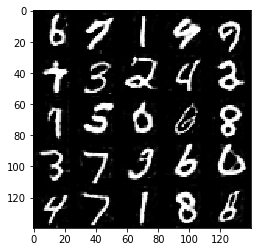

Epoch 12/25... Discriminator Loss: 1.3107... Generator Loss: 0.6329
Epoch 13/25... Discriminator Loss: 0.6447... Generator Loss: 1.6224
Epoch 13/25... Discriminator Loss: 0.6751... Generator Loss: 1.7380
Epoch 13/25... Discriminator Loss: 0.7404... Generator Loss: 1.5537
Epoch 13/25... Discriminator Loss: 0.6496... Generator Loss: 1.5813
Epoch 13/25... Discriminator Loss: 0.7652... Generator Loss: 1.2441
Epoch 13/25... Discriminator Loss: 0.9177... Generator Loss: 0.9852
Epoch 13/25... Discriminator Loss: 0.6266... Generator Loss: 1.6567
Epoch 13/25... Discriminator Loss: 0.7604... Generator Loss: 1.2514
Epoch 13/25... Discriminator Loss: 0.5416... Generator Loss: 2.0203


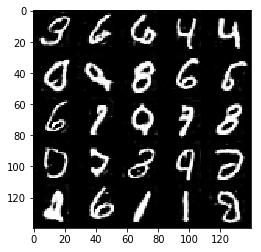

Epoch 13/25... Discriminator Loss: 1.0122... Generator Loss: 0.9087
Epoch 13/25... Discriminator Loss: 0.6985... Generator Loss: 1.3818
Epoch 13/25... Discriminator Loss: 0.6330... Generator Loss: 1.6348
Epoch 13/25... Discriminator Loss: 0.6998... Generator Loss: 1.7039
Epoch 13/25... Discriminator Loss: 0.7658... Generator Loss: 1.2406
Epoch 13/25... Discriminator Loss: 0.9026... Generator Loss: 1.0122
Epoch 13/25... Discriminator Loss: 0.5242... Generator Loss: 2.0070
Epoch 13/25... Discriminator Loss: 0.6725... Generator Loss: 1.8280
Epoch 13/25... Discriminator Loss: 0.7746... Generator Loss: 1.2465
Epoch 13/25... Discriminator Loss: 0.5399... Generator Loss: 1.9593


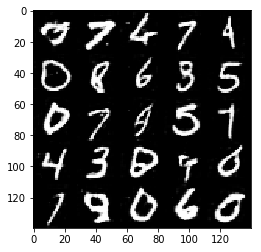

Epoch 13/25... Discriminator Loss: 0.6040... Generator Loss: 1.7033
Epoch 13/25... Discriminator Loss: 0.6983... Generator Loss: 1.3917
Epoch 13/25... Discriminator Loss: 0.4332... Generator Loss: 2.8679
Epoch 13/25... Discriminator Loss: 0.6881... Generator Loss: 1.4575
Epoch 13/25... Discriminator Loss: 0.8836... Generator Loss: 1.2081
Epoch 13/25... Discriminator Loss: 0.7649... Generator Loss: 1.9555
Epoch 13/25... Discriminator Loss: 0.6406... Generator Loss: 1.6608
Epoch 13/25... Discriminator Loss: 0.8140... Generator Loss: 2.1061
Epoch 13/25... Discriminator Loss: 0.7204... Generator Loss: 1.3563
Epoch 13/25... Discriminator Loss: 0.7642... Generator Loss: 1.2420


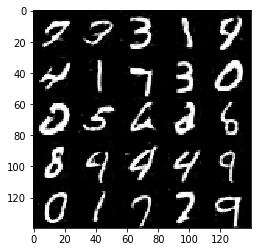

Epoch 13/25... Discriminator Loss: 0.7081... Generator Loss: 1.4568
Epoch 13/25... Discriminator Loss: 0.8516... Generator Loss: 1.1997
Epoch 13/25... Discriminator Loss: 0.7999... Generator Loss: 1.5146
Epoch 13/25... Discriminator Loss: 1.2151... Generator Loss: 0.7672
Epoch 13/25... Discriminator Loss: 1.1402... Generator Loss: 0.7357
Epoch 13/25... Discriminator Loss: 1.1990... Generator Loss: 0.7235
Epoch 13/25... Discriminator Loss: 0.7336... Generator Loss: 1.3416
Epoch 13/25... Discriminator Loss: 0.7143... Generator Loss: 1.3468
Epoch 13/25... Discriminator Loss: 0.6124... Generator Loss: 1.6391
Epoch 13/25... Discriminator Loss: 0.7975... Generator Loss: 1.1723


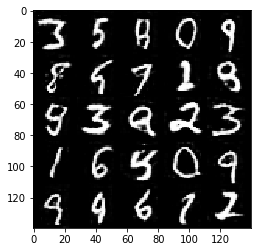

Epoch 13/25... Discriminator Loss: 0.7079... Generator Loss: 1.4079
Epoch 13/25... Discriminator Loss: 0.6506... Generator Loss: 1.6497
Epoch 13/25... Discriminator Loss: 0.5965... Generator Loss: 1.7756
Epoch 13/25... Discriminator Loss: 0.6963... Generator Loss: 1.4275
Epoch 13/25... Discriminator Loss: 0.9908... Generator Loss: 0.9281
Epoch 13/25... Discriminator Loss: 0.7473... Generator Loss: 1.9480
Epoch 13/25... Discriminator Loss: 0.8192... Generator Loss: 1.1773
Epoch 13/25... Discriminator Loss: 0.6346... Generator Loss: 1.6030
Epoch 14/25... Discriminator Loss: 0.6662... Generator Loss: 1.4707
Epoch 14/25... Discriminator Loss: 0.7040... Generator Loss: 1.3652


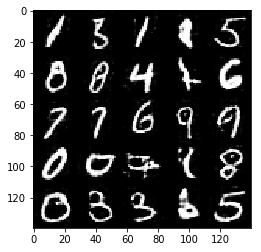

Epoch 14/25... Discriminator Loss: 0.6841... Generator Loss: 1.4191
Epoch 14/25... Discriminator Loss: 0.6926... Generator Loss: 1.3971
Epoch 14/25... Discriminator Loss: 0.6405... Generator Loss: 1.5823
Epoch 14/25... Discriminator Loss: 0.8625... Generator Loss: 1.0371
Epoch 14/25... Discriminator Loss: 0.9055... Generator Loss: 1.1761
Epoch 14/25... Discriminator Loss: 1.1408... Generator Loss: 0.7091
Epoch 14/25... Discriminator Loss: 0.6539... Generator Loss: 1.6803
Epoch 14/25... Discriminator Loss: 0.6570... Generator Loss: 1.8560
Epoch 14/25... Discriminator Loss: 0.7193... Generator Loss: 1.3781
Epoch 14/25... Discriminator Loss: 0.8842... Generator Loss: 1.1675


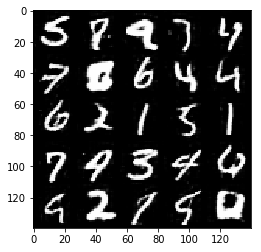

Epoch 14/25... Discriminator Loss: 0.9746... Generator Loss: 1.7581
Epoch 14/25... Discriminator Loss: 0.7146... Generator Loss: 1.6819
Epoch 14/25... Discriminator Loss: 1.2447... Generator Loss: 0.7044
Epoch 14/25... Discriminator Loss: 0.5657... Generator Loss: 1.9663
Epoch 14/25... Discriminator Loss: 1.2135... Generator Loss: 0.7000
Epoch 14/25... Discriminator Loss: 0.7988... Generator Loss: 1.2208
Epoch 14/25... Discriminator Loss: 0.7846... Generator Loss: 1.1748
Epoch 14/25... Discriminator Loss: 0.6492... Generator Loss: 1.5441
Epoch 14/25... Discriminator Loss: 0.4947... Generator Loss: 2.1765
Epoch 14/25... Discriminator Loss: 0.7628... Generator Loss: 1.2562


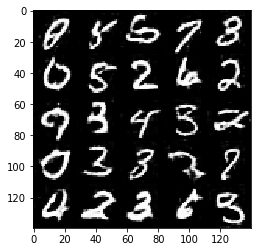

Epoch 14/25... Discriminator Loss: 0.6372... Generator Loss: 1.5852
Epoch 14/25... Discriminator Loss: 0.6428... Generator Loss: 1.5326
Epoch 14/25... Discriminator Loss: 0.6206... Generator Loss: 1.6370
Epoch 14/25... Discriminator Loss: 1.3711... Generator Loss: 0.7176
Epoch 14/25... Discriminator Loss: 0.8403... Generator Loss: 2.1106
Epoch 14/25... Discriminator Loss: 0.8297... Generator Loss: 1.2572
Epoch 14/25... Discriminator Loss: 1.1795... Generator Loss: 0.8403
Epoch 14/25... Discriminator Loss: 0.6211... Generator Loss: 1.8870
Epoch 14/25... Discriminator Loss: 0.8611... Generator Loss: 1.1179
Epoch 14/25... Discriminator Loss: 0.6626... Generator Loss: 1.6723


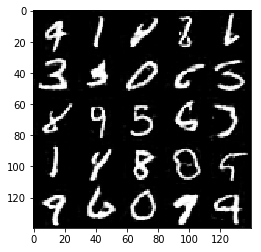

Epoch 14/25... Discriminator Loss: 0.7507... Generator Loss: 1.2858
Epoch 14/25... Discriminator Loss: 0.7845... Generator Loss: 1.2512
Epoch 14/25... Discriminator Loss: 0.7272... Generator Loss: 2.3009
Epoch 14/25... Discriminator Loss: 0.8130... Generator Loss: 3.4127
Epoch 14/25... Discriminator Loss: 0.4993... Generator Loss: 2.4380
Epoch 14/25... Discriminator Loss: 2.1990... Generator Loss: 0.3014
Epoch 14/25... Discriminator Loss: 0.9879... Generator Loss: 0.9841
Epoch 14/25... Discriminator Loss: 0.6068... Generator Loss: 1.7991
Epoch 14/25... Discriminator Loss: 0.7320... Generator Loss: 1.3463
Epoch 14/25... Discriminator Loss: 0.7663... Generator Loss: 1.2685


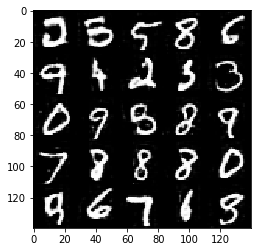

Epoch 14/25... Discriminator Loss: 0.7332... Generator Loss: 1.5219
Epoch 14/25... Discriminator Loss: 0.5319... Generator Loss: 2.1687
Epoch 14/25... Discriminator Loss: 0.4632... Generator Loss: 2.4828
Epoch 14/25... Discriminator Loss: 0.6475... Generator Loss: 1.8307
Epoch 14/25... Discriminator Loss: 0.5924... Generator Loss: 1.7062
Epoch 15/25... Discriminator Loss: 0.5113... Generator Loss: 2.0586
Epoch 15/25... Discriminator Loss: 0.5307... Generator Loss: 1.9740
Epoch 15/25... Discriminator Loss: 0.6687... Generator Loss: 1.4766
Epoch 15/25... Discriminator Loss: 0.7071... Generator Loss: 2.2409
Epoch 15/25... Discriminator Loss: 0.9031... Generator Loss: 1.0375


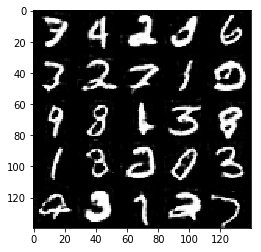

Epoch 15/25... Discriminator Loss: 0.6212... Generator Loss: 1.7682
Epoch 15/25... Discriminator Loss: 1.1367... Generator Loss: 0.7974
Epoch 15/25... Discriminator Loss: 0.6413... Generator Loss: 1.5611
Epoch 15/25... Discriminator Loss: 0.4634... Generator Loss: 2.4507
Epoch 15/25... Discriminator Loss: 1.0746... Generator Loss: 0.7824
Epoch 15/25... Discriminator Loss: 0.7707... Generator Loss: 1.2600
Epoch 15/25... Discriminator Loss: 0.6602... Generator Loss: 1.7539
Epoch 15/25... Discriminator Loss: 0.7386... Generator Loss: 1.5042
Epoch 15/25... Discriminator Loss: 0.8883... Generator Loss: 1.1042
Epoch 15/25... Discriminator Loss: 0.6598... Generator Loss: 1.5389


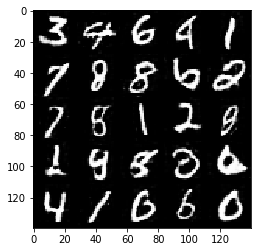

Epoch 15/25... Discriminator Loss: 0.8147... Generator Loss: 1.1713
Epoch 15/25... Discriminator Loss: 0.5503... Generator Loss: 2.2973
Epoch 15/25... Discriminator Loss: 0.6546... Generator Loss: 1.5518
Epoch 15/25... Discriminator Loss: 0.6029... Generator Loss: 1.6611
Epoch 15/25... Discriminator Loss: 0.5818... Generator Loss: 1.7259
Epoch 15/25... Discriminator Loss: 0.5962... Generator Loss: 1.7888
Epoch 15/25... Discriminator Loss: 0.7029... Generator Loss: 1.3836
Epoch 15/25... Discriminator Loss: 0.8010... Generator Loss: 1.1415
Epoch 15/25... Discriminator Loss: 0.5941... Generator Loss: 1.8117
Epoch 15/25... Discriminator Loss: 0.5839... Generator Loss: 1.8274


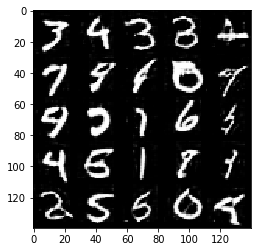

Epoch 15/25... Discriminator Loss: 0.5190... Generator Loss: 2.1522
Epoch 15/25... Discriminator Loss: 0.8440... Generator Loss: 1.2095
Epoch 15/25... Discriminator Loss: 0.6016... Generator Loss: 2.5652
Epoch 15/25... Discriminator Loss: 0.4150... Generator Loss: 2.9820
Epoch 15/25... Discriminator Loss: 0.8572... Generator Loss: 1.0787
Epoch 15/25... Discriminator Loss: 0.6326... Generator Loss: 1.6205
Epoch 15/25... Discriminator Loss: 0.9606... Generator Loss: 0.9304
Epoch 15/25... Discriminator Loss: 0.5435... Generator Loss: 2.1229
Epoch 15/25... Discriminator Loss: 0.6968... Generator Loss: 1.4434
Epoch 15/25... Discriminator Loss: 0.8140... Generator Loss: 1.1824


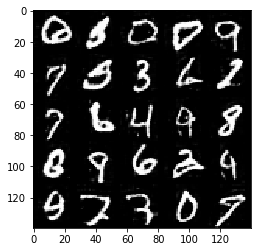

Epoch 15/25... Discriminator Loss: 0.5471... Generator Loss: 1.9172
Epoch 15/25... Discriminator Loss: 0.9798... Generator Loss: 0.8830
Epoch 15/25... Discriminator Loss: 0.4812... Generator Loss: 2.5988
Epoch 15/25... Discriminator Loss: 0.7215... Generator Loss: 1.3752
Epoch 15/25... Discriminator Loss: 0.6862... Generator Loss: 1.5778
Epoch 15/25... Discriminator Loss: 1.1314... Generator Loss: 0.7626
Epoch 15/25... Discriminator Loss: 0.8357... Generator Loss: 1.2004
Epoch 15/25... Discriminator Loss: 0.8385... Generator Loss: 1.8405
Epoch 15/25... Discriminator Loss: 1.2742... Generator Loss: 0.7067
Epoch 15/25... Discriminator Loss: 0.7252... Generator Loss: 1.3540


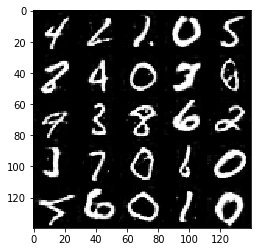

Epoch 15/25... Discriminator Loss: 0.7573... Generator Loss: 1.2814
Epoch 15/25... Discriminator Loss: 0.5895... Generator Loss: 2.0419
Epoch 16/25... Discriminator Loss: 0.7724... Generator Loss: 1.2294
Epoch 16/25... Discriminator Loss: 0.7874... Generator Loss: 1.2155
Epoch 16/25... Discriminator Loss: 0.6188... Generator Loss: 1.6981
Epoch 16/25... Discriminator Loss: 0.7367... Generator Loss: 1.2969
Epoch 16/25... Discriminator Loss: 0.6980... Generator Loss: 1.8806
Epoch 16/25... Discriminator Loss: 0.6665... Generator Loss: 1.5768
Epoch 16/25... Discriminator Loss: 0.8277... Generator Loss: 1.3252
Epoch 16/25... Discriminator Loss: 0.8814... Generator Loss: 1.1548


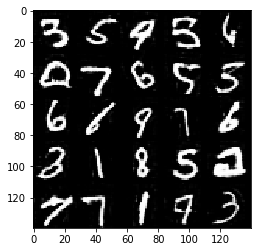

Epoch 16/25... Discriminator Loss: 0.6559... Generator Loss: 1.5347
Epoch 16/25... Discriminator Loss: 0.7329... Generator Loss: 1.3152
Epoch 16/25... Discriminator Loss: 0.7828... Generator Loss: 1.3413
Epoch 16/25... Discriminator Loss: 0.9378... Generator Loss: 0.9338
Epoch 16/25... Discriminator Loss: 0.6835... Generator Loss: 1.8294
Epoch 16/25... Discriminator Loss: 0.5718... Generator Loss: 1.7941
Epoch 16/25... Discriminator Loss: 0.7808... Generator Loss: 1.2511
Epoch 16/25... Discriminator Loss: 0.7964... Generator Loss: 1.1958
Epoch 16/25... Discriminator Loss: 0.9797... Generator Loss: 0.9765
Epoch 16/25... Discriminator Loss: 1.1170... Generator Loss: 0.7955


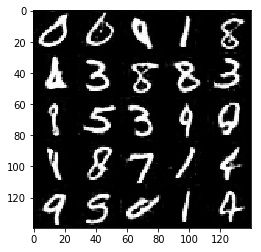

Epoch 16/25... Discriminator Loss: 0.7234... Generator Loss: 1.3742
Epoch 16/25... Discriminator Loss: 0.7300... Generator Loss: 1.3475
Epoch 16/25... Discriminator Loss: 0.9511... Generator Loss: 0.9978
Epoch 16/25... Discriminator Loss: 0.6213... Generator Loss: 1.6348
Epoch 16/25... Discriminator Loss: 0.6310... Generator Loss: 1.6076
Epoch 16/25... Discriminator Loss: 0.5722... Generator Loss: 1.8356
Epoch 16/25... Discriminator Loss: 0.5568... Generator Loss: 1.9646
Epoch 16/25... Discriminator Loss: 3.1247... Generator Loss: 7.1820
Epoch 16/25... Discriminator Loss: 1.3369... Generator Loss: 0.6279
Epoch 16/25... Discriminator Loss: 0.7646... Generator Loss: 1.4067


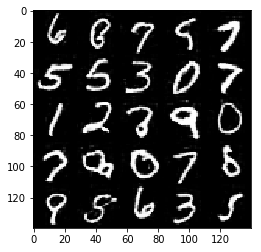

Epoch 16/25... Discriminator Loss: 0.7590... Generator Loss: 1.3281
Epoch 16/25... Discriminator Loss: 0.6175... Generator Loss: 1.9167
Epoch 16/25... Discriminator Loss: 1.0357... Generator Loss: 0.8338
Epoch 16/25... Discriminator Loss: 0.8262... Generator Loss: 1.3841
Epoch 16/25... Discriminator Loss: 0.6670... Generator Loss: 1.7988
Epoch 16/25... Discriminator Loss: 0.7307... Generator Loss: 2.0742
Epoch 16/25... Discriminator Loss: 0.8568... Generator Loss: 1.1484
Epoch 16/25... Discriminator Loss: 0.5699... Generator Loss: 1.8442
Epoch 16/25... Discriminator Loss: 0.6849... Generator Loss: 1.5718
Epoch 16/25... Discriminator Loss: 0.7208... Generator Loss: 2.5082


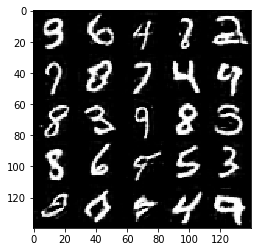

Epoch 16/25... Discriminator Loss: 0.6177... Generator Loss: 1.6756
Epoch 16/25... Discriminator Loss: 0.7706... Generator Loss: 1.3393
Epoch 16/25... Discriminator Loss: 0.5729... Generator Loss: 1.8424
Epoch 16/25... Discriminator Loss: 0.4682... Generator Loss: 2.5726
Epoch 16/25... Discriminator Loss: 0.5281... Generator Loss: 2.0390
Epoch 16/25... Discriminator Loss: 0.7855... Generator Loss: 1.2712
Epoch 16/25... Discriminator Loss: 0.6541... Generator Loss: 1.7890
Epoch 16/25... Discriminator Loss: 0.8654... Generator Loss: 1.0478
Epoch 17/25... Discriminator Loss: 0.9443... Generator Loss: 0.9619
Epoch 17/25... Discriminator Loss: 0.5765... Generator Loss: 1.7706


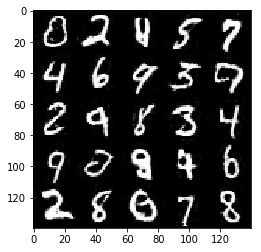

Epoch 17/25... Discriminator Loss: 0.6646... Generator Loss: 1.5314
Epoch 17/25... Discriminator Loss: 0.6244... Generator Loss: 1.5674
Epoch 17/25... Discriminator Loss: 0.7075... Generator Loss: 1.3806
Epoch 17/25... Discriminator Loss: 0.6185... Generator Loss: 2.1632
Epoch 17/25... Discriminator Loss: 0.8891... Generator Loss: 1.0770
Epoch 17/25... Discriminator Loss: 0.6563... Generator Loss: 1.5098
Epoch 17/25... Discriminator Loss: 0.7365... Generator Loss: 1.3469
Epoch 17/25... Discriminator Loss: 0.6470... Generator Loss: 1.5701
Epoch 17/25... Discriminator Loss: 2.0574... Generator Loss: 0.4760
Epoch 17/25... Discriminator Loss: 0.7135... Generator Loss: 2.5351


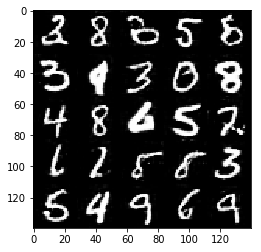

Epoch 17/25... Discriminator Loss: 0.6798... Generator Loss: 1.5308
Epoch 17/25... Discriminator Loss: 0.7619... Generator Loss: 1.2987
Epoch 17/25... Discriminator Loss: 0.7509... Generator Loss: 1.2348
Epoch 17/25... Discriminator Loss: 0.5780... Generator Loss: 1.9345
Epoch 17/25... Discriminator Loss: 0.5433... Generator Loss: 2.0437
Epoch 17/25... Discriminator Loss: 0.5736... Generator Loss: 2.6731
Epoch 17/25... Discriminator Loss: 0.6445... Generator Loss: 1.6084
Epoch 17/25... Discriminator Loss: 0.8255... Generator Loss: 1.1369
Epoch 17/25... Discriminator Loss: 0.5339... Generator Loss: 2.0535
Epoch 17/25... Discriminator Loss: 0.6869... Generator Loss: 1.4810


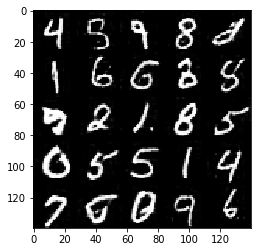

Epoch 17/25... Discriminator Loss: 0.7281... Generator Loss: 1.3198
Epoch 17/25... Discriminator Loss: 0.6948... Generator Loss: 1.4629
Epoch 17/25... Discriminator Loss: 0.4985... Generator Loss: 2.1998
Epoch 17/25... Discriminator Loss: 0.6199... Generator Loss: 1.6227
Epoch 17/25... Discriminator Loss: 1.1264... Generator Loss: 3.3626
Epoch 17/25... Discriminator Loss: 0.7238... Generator Loss: 2.4281
Epoch 17/25... Discriminator Loss: 0.9477... Generator Loss: 0.9964
Epoch 17/25... Discriminator Loss: 1.2167... Generator Loss: 2.6524
Epoch 17/25... Discriminator Loss: 0.9925... Generator Loss: 2.5794
Epoch 17/25... Discriminator Loss: 0.6812... Generator Loss: 1.7141


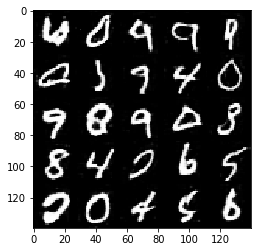

Epoch 17/25... Discriminator Loss: 0.7250... Generator Loss: 1.3226
Epoch 17/25... Discriminator Loss: 0.8724... Generator Loss: 1.0526
Epoch 17/25... Discriminator Loss: 0.6247... Generator Loss: 1.6864
Epoch 17/25... Discriminator Loss: 0.6032... Generator Loss: 1.7927
Epoch 17/25... Discriminator Loss: 0.7546... Generator Loss: 1.2836
Epoch 17/25... Discriminator Loss: 0.6578... Generator Loss: 2.2246
Epoch 17/25... Discriminator Loss: 0.7466... Generator Loss: 1.3080
Epoch 17/25... Discriminator Loss: 0.7242... Generator Loss: 1.3824
Epoch 17/25... Discriminator Loss: 1.0268... Generator Loss: 0.9110
Epoch 17/25... Discriminator Loss: 0.5484... Generator Loss: 1.9424


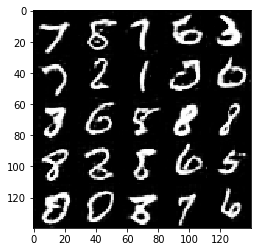

Epoch 17/25... Discriminator Loss: 0.7698... Generator Loss: 1.2579
Epoch 17/25... Discriminator Loss: 0.6427... Generator Loss: 1.5390
Epoch 17/25... Discriminator Loss: 0.6006... Generator Loss: 1.7320
Epoch 17/25... Discriminator Loss: 0.4635... Generator Loss: 2.4737
Epoch 17/25... Discriminator Loss: 0.4205... Generator Loss: 2.8707
Epoch 18/25... Discriminator Loss: 0.4858... Generator Loss: 2.2796
Epoch 18/25... Discriminator Loss: 0.7064... Generator Loss: 1.4151
Epoch 18/25... Discriminator Loss: 0.5451... Generator Loss: 1.8783
Epoch 18/25... Discriminator Loss: 0.4556... Generator Loss: 2.5064
Epoch 18/25... Discriminator Loss: 0.8472... Generator Loss: 1.0910


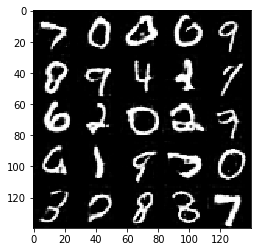

Epoch 18/25... Discriminator Loss: 0.9195... Generator Loss: 0.9805
Epoch 18/25... Discriminator Loss: 0.6290... Generator Loss: 1.8124
Epoch 18/25... Discriminator Loss: 0.6324... Generator Loss: 1.6149
Epoch 18/25... Discriminator Loss: 1.0635... Generator Loss: 0.8667
Epoch 18/25... Discriminator Loss: 0.9915... Generator Loss: 1.6451
Epoch 18/25... Discriminator Loss: 0.8144... Generator Loss: 1.2122
Epoch 18/25... Discriminator Loss: 0.7643... Generator Loss: 1.3041
Epoch 18/25... Discriminator Loss: 1.5419... Generator Loss: 4.0288
Epoch 18/25... Discriminator Loss: 0.6731... Generator Loss: 1.6254
Epoch 18/25... Discriminator Loss: 0.8210... Generator Loss: 1.2111


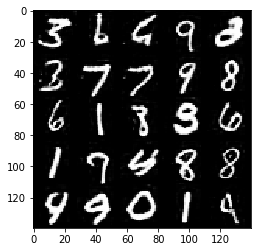

Epoch 18/25... Discriminator Loss: 0.7344... Generator Loss: 1.5072
Epoch 18/25... Discriminator Loss: 0.8474... Generator Loss: 1.1666
Epoch 18/25... Discriminator Loss: 0.7215... Generator Loss: 1.8137
Epoch 18/25... Discriminator Loss: 0.5325... Generator Loss: 2.1711
Epoch 18/25... Discriminator Loss: 0.5878... Generator Loss: 2.1915
Epoch 18/25... Discriminator Loss: 0.6840... Generator Loss: 1.4546
Epoch 18/25... Discriminator Loss: 0.5295... Generator Loss: 2.0055
Epoch 18/25... Discriminator Loss: 0.7051... Generator Loss: 1.3962
Epoch 18/25... Discriminator Loss: 0.6105... Generator Loss: 2.1414
Epoch 18/25... Discriminator Loss: 0.7457... Generator Loss: 1.3143


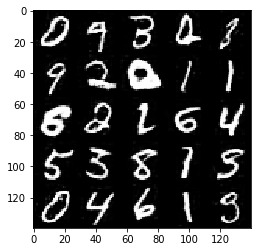

Epoch 18/25... Discriminator Loss: 0.6215... Generator Loss: 1.6878
Epoch 18/25... Discriminator Loss: 0.7241... Generator Loss: 1.4115
Epoch 18/25... Discriminator Loss: 0.8451... Generator Loss: 1.1012
Epoch 18/25... Discriminator Loss: 0.6227... Generator Loss: 1.5964
Epoch 18/25... Discriminator Loss: 0.9344... Generator Loss: 1.0004
Epoch 18/25... Discriminator Loss: 0.4691... Generator Loss: 2.5564
Epoch 18/25... Discriminator Loss: 0.9754... Generator Loss: 1.0196
Epoch 18/25... Discriminator Loss: 0.7532... Generator Loss: 1.3850
Epoch 18/25... Discriminator Loss: 1.0850... Generator Loss: 0.9080
Epoch 18/25... Discriminator Loss: 0.5628... Generator Loss: 1.9820


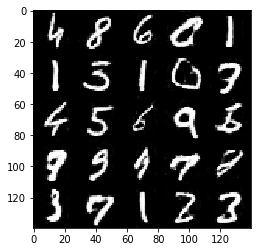

Epoch 18/25... Discriminator Loss: 1.3910... Generator Loss: 2.9532
Epoch 18/25... Discriminator Loss: 0.7591... Generator Loss: 1.2780
Epoch 18/25... Discriminator Loss: 1.0421... Generator Loss: 0.8457
Epoch 18/25... Discriminator Loss: 0.6745... Generator Loss: 1.7916
Epoch 18/25... Discriminator Loss: 1.2424... Generator Loss: 0.7641
Epoch 18/25... Discriminator Loss: 1.0328... Generator Loss: 1.2076
Epoch 18/25... Discriminator Loss: 0.7561... Generator Loss: 1.4740
Epoch 18/25... Discriminator Loss: 0.7236... Generator Loss: 1.9552
Epoch 18/25... Discriminator Loss: 1.0493... Generator Loss: 0.8633
Epoch 18/25... Discriminator Loss: 0.8562... Generator Loss: 1.0943


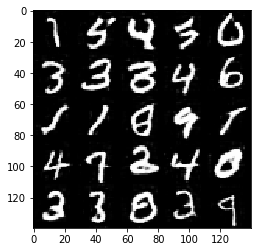

Epoch 18/25... Discriminator Loss: 0.7996... Generator Loss: 1.2345
Epoch 18/25... Discriminator Loss: 0.7743... Generator Loss: 1.1908
Epoch 19/25... Discriminator Loss: 0.6371... Generator Loss: 1.5491
Epoch 19/25... Discriminator Loss: 0.7330... Generator Loss: 1.3246
Epoch 19/25... Discriminator Loss: 0.6439... Generator Loss: 1.5649
Epoch 19/25... Discriminator Loss: 0.7276... Generator Loss: 1.3217
Epoch 19/25... Discriminator Loss: 0.5472... Generator Loss: 2.2624
Epoch 19/25... Discriminator Loss: 0.8823... Generator Loss: 1.0249
Epoch 19/25... Discriminator Loss: 0.8508... Generator Loss: 1.1316
Epoch 19/25... Discriminator Loss: 0.7189... Generator Loss: 1.3596


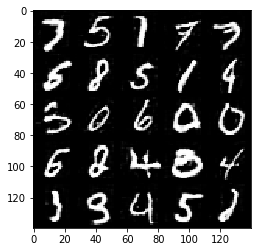

Epoch 19/25... Discriminator Loss: 0.5866... Generator Loss: 1.8293
Epoch 19/25... Discriminator Loss: 0.5607... Generator Loss: 2.2188
Epoch 19/25... Discriminator Loss: 0.6002... Generator Loss: 1.7473
Epoch 19/25... Discriminator Loss: 0.8116... Generator Loss: 1.1596
Epoch 19/25... Discriminator Loss: 0.4700... Generator Loss: 2.4046
Epoch 19/25... Discriminator Loss: 0.5896... Generator Loss: 1.7358
Epoch 19/25... Discriminator Loss: 0.6421... Generator Loss: 1.6600
Epoch 19/25... Discriminator Loss: 0.5276... Generator Loss: 2.0709
Epoch 19/25... Discriminator Loss: 0.5848... Generator Loss: 1.7719
Epoch 19/25... Discriminator Loss: 0.6359... Generator Loss: 1.5553


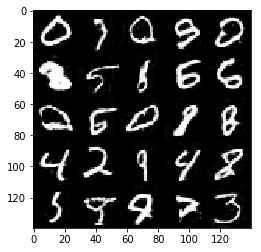

Epoch 19/25... Discriminator Loss: 0.6137... Generator Loss: 1.8301
Epoch 19/25... Discriminator Loss: 0.5451... Generator Loss: 1.8669
Epoch 19/25... Discriminator Loss: 0.5935... Generator Loss: 1.7402
Epoch 19/25... Discriminator Loss: 0.6799... Generator Loss: 1.5062
Epoch 19/25... Discriminator Loss: 0.6788... Generator Loss: 1.5458
Epoch 19/25... Discriminator Loss: 0.7029... Generator Loss: 2.0569
Epoch 19/25... Discriminator Loss: 0.7201... Generator Loss: 1.4402
Epoch 19/25... Discriminator Loss: 0.8390... Generator Loss: 1.2010
Epoch 19/25... Discriminator Loss: 0.8229... Generator Loss: 1.1592
Epoch 19/25... Discriminator Loss: 0.6618... Generator Loss: 1.5670


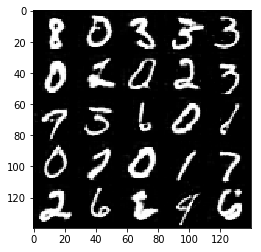

Epoch 19/25... Discriminator Loss: 0.6898... Generator Loss: 1.3871
Epoch 19/25... Discriminator Loss: 0.5592... Generator Loss: 1.8962
Epoch 19/25... Discriminator Loss: 0.5553... Generator Loss: 1.9008
Epoch 19/25... Discriminator Loss: 0.5713... Generator Loss: 2.0100
Epoch 19/25... Discriminator Loss: 1.4020... Generator Loss: 0.5616
Epoch 19/25... Discriminator Loss: 0.9152... Generator Loss: 1.0544
Epoch 19/25... Discriminator Loss: 0.7283... Generator Loss: 1.9323
Epoch 19/25... Discriminator Loss: 0.7078... Generator Loss: 1.5441
Epoch 19/25... Discriminator Loss: 0.8580... Generator Loss: 1.9976
Epoch 19/25... Discriminator Loss: 0.6269... Generator Loss: 1.8443


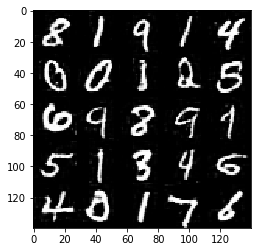

Epoch 19/25... Discriminator Loss: 0.8196... Generator Loss: 1.3363
Epoch 19/25... Discriminator Loss: 1.1304... Generator Loss: 0.7591
Epoch 19/25... Discriminator Loss: 0.7484... Generator Loss: 1.3456
Epoch 19/25... Discriminator Loss: 1.0621... Generator Loss: 0.8343
Epoch 19/25... Discriminator Loss: 0.7482... Generator Loss: 1.3842
Epoch 19/25... Discriminator Loss: 0.6642... Generator Loss: 1.6478
Epoch 19/25... Discriminator Loss: 0.5250... Generator Loss: 2.2740
Epoch 19/25... Discriminator Loss: 0.4778... Generator Loss: 2.2767
Epoch 19/25... Discriminator Loss: 0.5199... Generator Loss: 2.0397
Epoch 20/25... Discriminator Loss: 0.5774... Generator Loss: 1.8543


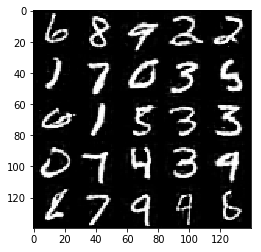

Epoch 20/25... Discriminator Loss: 0.5917... Generator Loss: 1.9832
Epoch 20/25... Discriminator Loss: 0.6237... Generator Loss: 1.6295
Epoch 20/25... Discriminator Loss: 0.7982... Generator Loss: 2.4837
Epoch 20/25... Discriminator Loss: 0.7517... Generator Loss: 1.3941
Epoch 20/25... Discriminator Loss: 0.5743... Generator Loss: 2.0883
Epoch 20/25... Discriminator Loss: 0.7101... Generator Loss: 1.6418
Epoch 20/25... Discriminator Loss: 0.6885... Generator Loss: 1.4528
Epoch 20/25... Discriminator Loss: 0.7295... Generator Loss: 1.9290
Epoch 20/25... Discriminator Loss: 0.7392... Generator Loss: 1.6207
Epoch 20/25... Discriminator Loss: 0.7938... Generator Loss: 1.2044


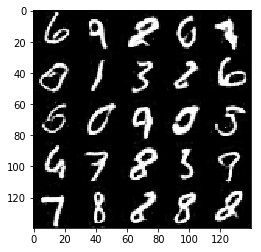

Epoch 20/25... Discriminator Loss: 0.6179... Generator Loss: 1.6356
Epoch 20/25... Discriminator Loss: 0.7558... Generator Loss: 1.3270
Epoch 20/25... Discriminator Loss: 0.5593... Generator Loss: 1.9361
Epoch 20/25... Discriminator Loss: 0.5561... Generator Loss: 1.8468
Epoch 20/25... Discriminator Loss: 0.8217... Generator Loss: 1.1544
Epoch 20/25... Discriminator Loss: 0.5824... Generator Loss: 2.1063
Epoch 20/25... Discriminator Loss: 0.4986... Generator Loss: 2.2034
Epoch 20/25... Discriminator Loss: 0.5042... Generator Loss: 2.2043
Epoch 20/25... Discriminator Loss: 0.5437... Generator Loss: 1.8792
Epoch 20/25... Discriminator Loss: 0.5896... Generator Loss: 1.7025


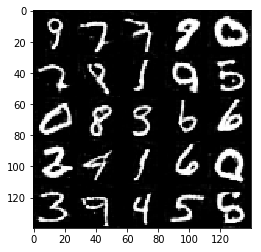

Epoch 20/25... Discriminator Loss: 0.5603... Generator Loss: 1.9691
Epoch 20/25... Discriminator Loss: 0.7902... Generator Loss: 1.1989
Epoch 20/25... Discriminator Loss: 0.6037... Generator Loss: 1.7666
Epoch 20/25... Discriminator Loss: 0.4422... Generator Loss: 2.6185
Epoch 20/25... Discriminator Loss: 0.6607... Generator Loss: 1.5149
Epoch 20/25... Discriminator Loss: 0.7118... Generator Loss: 1.3464
Epoch 20/25... Discriminator Loss: 0.5005... Generator Loss: 2.1921
Epoch 20/25... Discriminator Loss: 0.5418... Generator Loss: 2.2377
Epoch 20/25... Discriminator Loss: 1.0064... Generator Loss: 0.8783
Epoch 20/25... Discriminator Loss: 1.0330... Generator Loss: 1.3286


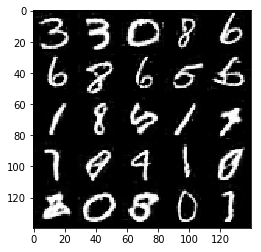

Epoch 20/25... Discriminator Loss: 0.8871... Generator Loss: 1.1041
Epoch 20/25... Discriminator Loss: 0.6809... Generator Loss: 1.8522
Epoch 20/25... Discriminator Loss: 0.7292... Generator Loss: 1.7214
Epoch 20/25... Discriminator Loss: 0.9050... Generator Loss: 1.0837
Epoch 20/25... Discriminator Loss: 0.7630... Generator Loss: 1.2867
Epoch 20/25... Discriminator Loss: 0.7595... Generator Loss: 1.3052
Epoch 20/25... Discriminator Loss: 0.6793... Generator Loss: 1.5635
Epoch 20/25... Discriminator Loss: 0.7223... Generator Loss: 1.4136
Epoch 20/25... Discriminator Loss: 0.5473... Generator Loss: 2.0293
Epoch 20/25... Discriminator Loss: 0.7887... Generator Loss: 1.2177


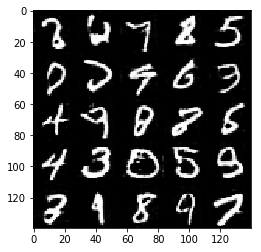

Epoch 20/25... Discriminator Loss: 0.5052... Generator Loss: 2.2021
Epoch 20/25... Discriminator Loss: 0.7022... Generator Loss: 1.3989
Epoch 20/25... Discriminator Loss: 0.6256... Generator Loss: 1.8425
Epoch 20/25... Discriminator Loss: 0.8273... Generator Loss: 1.2208
Epoch 20/25... Discriminator Loss: 0.5808... Generator Loss: 1.7883
Epoch 20/25... Discriminator Loss: 0.5740... Generator Loss: 1.8201
Epoch 21/25... Discriminator Loss: 0.8013... Generator Loss: 1.1653
Epoch 21/25... Discriminator Loss: 0.6137... Generator Loss: 1.6712
Epoch 21/25... Discriminator Loss: 0.7338... Generator Loss: 1.3709
Epoch 21/25... Discriminator Loss: 0.5138... Generator Loss: 2.9961


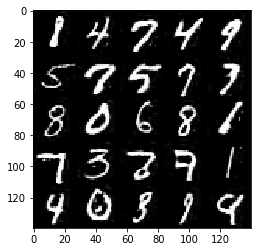

Epoch 21/25... Discriminator Loss: 0.7634... Generator Loss: 2.7585
Epoch 21/25... Discriminator Loss: 0.7110... Generator Loss: 2.2833
Epoch 21/25... Discriminator Loss: 0.7671... Generator Loss: 1.4202
Epoch 21/25... Discriminator Loss: 0.9074... Generator Loss: 1.1517
Epoch 21/25... Discriminator Loss: 0.8955... Generator Loss: 1.0460
Epoch 21/25... Discriminator Loss: 0.5924... Generator Loss: 1.7883
Epoch 21/25... Discriminator Loss: 0.9000... Generator Loss: 1.0453
Epoch 21/25... Discriminator Loss: 0.7696... Generator Loss: 1.2626
Epoch 21/25... Discriminator Loss: 0.5057... Generator Loss: 2.2045
Epoch 21/25... Discriminator Loss: 0.6106... Generator Loss: 1.6739


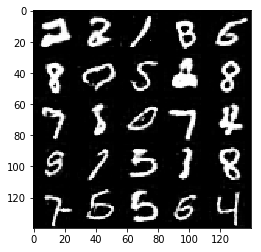

Epoch 21/25... Discriminator Loss: 0.5422... Generator Loss: 1.8939
Epoch 21/25... Discriminator Loss: 0.8312... Generator Loss: 1.1626
Epoch 21/25... Discriminator Loss: 0.4397... Generator Loss: 2.5648
Epoch 21/25... Discriminator Loss: 0.8328... Generator Loss: 1.1607
Epoch 21/25... Discriminator Loss: 0.5647... Generator Loss: 2.0161
Epoch 21/25... Discriminator Loss: 0.8008... Generator Loss: 1.2063
Epoch 21/25... Discriminator Loss: 0.4760... Generator Loss: 2.5685
Epoch 21/25... Discriminator Loss: 0.8627... Generator Loss: 1.1013
Epoch 21/25... Discriminator Loss: 0.3938... Generator Loss: 3.2831
Epoch 21/25... Discriminator Loss: 0.5938... Generator Loss: 1.6886


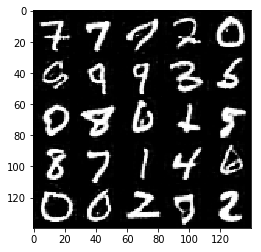

Epoch 21/25... Discriminator Loss: 0.4872... Generator Loss: 2.3049
Epoch 21/25... Discriminator Loss: 0.7604... Generator Loss: 1.2551
Epoch 21/25... Discriminator Loss: 0.7430... Generator Loss: 1.3855
Epoch 21/25... Discriminator Loss: 0.6356... Generator Loss: 1.7161
Epoch 21/25... Discriminator Loss: 0.6405... Generator Loss: 1.5668
Epoch 21/25... Discriminator Loss: 0.5296... Generator Loss: 2.3781
Epoch 21/25... Discriminator Loss: 1.2751... Generator Loss: 3.0569
Epoch 21/25... Discriminator Loss: 0.7441... Generator Loss: 1.2938
Epoch 21/25... Discriminator Loss: 0.8512... Generator Loss: 1.1472
Epoch 21/25... Discriminator Loss: 0.7818... Generator Loss: 2.7550


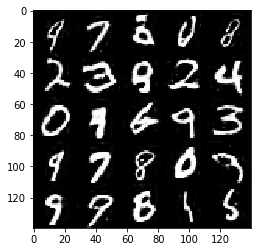

Epoch 21/25... Discriminator Loss: 0.6982... Generator Loss: 1.5158
Epoch 21/25... Discriminator Loss: 0.8664... Generator Loss: 1.1737
Epoch 21/25... Discriminator Loss: 0.8289... Generator Loss: 1.2647
Epoch 21/25... Discriminator Loss: 0.4805... Generator Loss: 2.2801
Epoch 21/25... Discriminator Loss: 0.7810... Generator Loss: 1.2740
Epoch 21/25... Discriminator Loss: 0.7061... Generator Loss: 1.4065
Epoch 21/25... Discriminator Loss: 0.5502... Generator Loss: 2.0017
Epoch 21/25... Discriminator Loss: 0.6215... Generator Loss: 1.6478
Epoch 21/25... Discriminator Loss: 0.4682... Generator Loss: 2.3843
Epoch 21/25... Discriminator Loss: 1.7874... Generator Loss: 0.4719


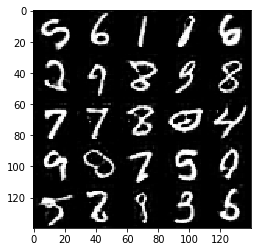

Epoch 21/25... Discriminator Loss: 0.7743... Generator Loss: 1.5246
Epoch 21/25... Discriminator Loss: 1.4391... Generator Loss: 0.5863
Epoch 22/25... Discriminator Loss: 0.6391... Generator Loss: 1.6794
Epoch 22/25... Discriminator Loss: 0.7580... Generator Loss: 1.2630
Epoch 22/25... Discriminator Loss: 0.6170... Generator Loss: 1.7471
Epoch 22/25... Discriminator Loss: 0.5922... Generator Loss: 1.7233
Epoch 22/25... Discriminator Loss: 0.7091... Generator Loss: 1.4258
Epoch 22/25... Discriminator Loss: 0.6449... Generator Loss: 1.7055
Epoch 22/25... Discriminator Loss: 0.9292... Generator Loss: 1.1408
Epoch 22/25... Discriminator Loss: 0.6487... Generator Loss: 1.5246


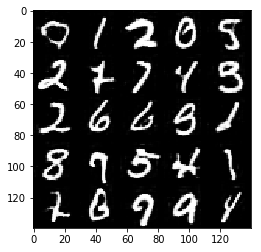

Epoch 22/25... Discriminator Loss: 0.5830... Generator Loss: 2.3628
Epoch 22/25... Discriminator Loss: 0.9070... Generator Loss: 1.3534
Epoch 22/25... Discriminator Loss: 0.7958... Generator Loss: 1.2487
Epoch 22/25... Discriminator Loss: 0.8199... Generator Loss: 1.6987
Epoch 22/25... Discriminator Loss: 0.7275... Generator Loss: 2.4701
Epoch 22/25... Discriminator Loss: 0.7380... Generator Loss: 2.2024
Epoch 22/25... Discriminator Loss: 0.7434... Generator Loss: 1.9339
Epoch 22/25... Discriminator Loss: 0.7596... Generator Loss: 1.3860
Epoch 22/25... Discriminator Loss: 0.6370... Generator Loss: 1.5801
Epoch 22/25... Discriminator Loss: 0.7150... Generator Loss: 1.3856


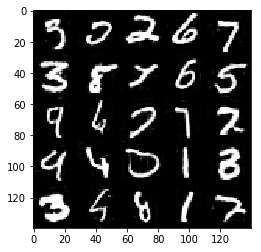

Epoch 22/25... Discriminator Loss: 0.7034... Generator Loss: 1.4609
Epoch 22/25... Discriminator Loss: 1.3004... Generator Loss: 0.6441
Epoch 22/25... Discriminator Loss: 0.5780... Generator Loss: 1.8585
Epoch 22/25... Discriminator Loss: 0.9602... Generator Loss: 0.9689
Epoch 22/25... Discriminator Loss: 0.7663... Generator Loss: 1.2234
Epoch 22/25... Discriminator Loss: 0.6478... Generator Loss: 1.5392
Epoch 22/25... Discriminator Loss: 0.5994... Generator Loss: 1.6800
Epoch 22/25... Discriminator Loss: 0.7486... Generator Loss: 1.4268
Epoch 22/25... Discriminator Loss: 0.5689... Generator Loss: 1.8020
Epoch 22/25... Discriminator Loss: 0.6354... Generator Loss: 1.5842


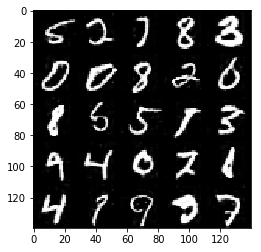

Epoch 22/25... Discriminator Loss: 0.7622... Generator Loss: 1.2268
Epoch 22/25... Discriminator Loss: 0.6756... Generator Loss: 1.4518
Epoch 22/25... Discriminator Loss: 0.8798... Generator Loss: 1.0863
Epoch 22/25... Discriminator Loss: 0.7251... Generator Loss: 2.4856
Epoch 22/25... Discriminator Loss: 0.6116... Generator Loss: 1.6765
Epoch 22/25... Discriminator Loss: 0.7147... Generator Loss: 1.4291
Epoch 22/25... Discriminator Loss: 0.5609... Generator Loss: 1.9138
Epoch 22/25... Discriminator Loss: 0.5837... Generator Loss: 2.0132
Epoch 22/25... Discriminator Loss: 0.7502... Generator Loss: 1.3093
Epoch 22/25... Discriminator Loss: 1.8943... Generator Loss: 0.4707


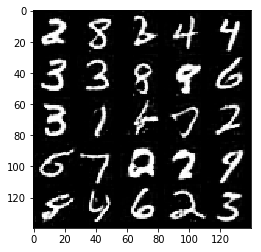

Epoch 22/25... Discriminator Loss: 0.9857... Generator Loss: 0.9801
Epoch 22/25... Discriminator Loss: 0.5920... Generator Loss: 1.7302
Epoch 22/25... Discriminator Loss: 0.7424... Generator Loss: 1.3708
Epoch 22/25... Discriminator Loss: 0.5795... Generator Loss: 1.8264
Epoch 22/25... Discriminator Loss: 0.6322... Generator Loss: 1.5761
Epoch 22/25... Discriminator Loss: 0.6902... Generator Loss: 1.4149
Epoch 22/25... Discriminator Loss: 0.6319... Generator Loss: 1.7633
Epoch 22/25... Discriminator Loss: 0.7126... Generator Loss: 1.4678
Epoch 22/25... Discriminator Loss: 0.7312... Generator Loss: 1.9338
Epoch 23/25... Discriminator Loss: 0.6441... Generator Loss: 1.5885


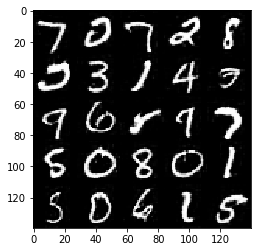

Epoch 23/25... Discriminator Loss: 0.7447... Generator Loss: 1.2932
Epoch 23/25... Discriminator Loss: 0.6679... Generator Loss: 1.4957
Epoch 23/25... Discriminator Loss: 0.6669... Generator Loss: 1.5109
Epoch 23/25... Discriminator Loss: 0.7110... Generator Loss: 1.3642
Epoch 23/25... Discriminator Loss: 1.0526... Generator Loss: 0.8555
Epoch 23/25... Discriminator Loss: 1.5648... Generator Loss: 0.5085
Epoch 23/25... Discriminator Loss: 1.0446... Generator Loss: 0.8679
Epoch 23/25... Discriminator Loss: 0.8419... Generator Loss: 1.1270
Epoch 23/25... Discriminator Loss: 0.6943... Generator Loss: 1.4417
Epoch 23/25... Discriminator Loss: 0.5974... Generator Loss: 1.7319


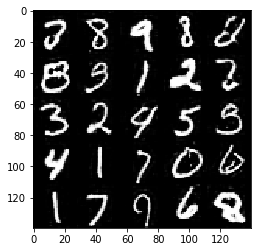

Epoch 23/25... Discriminator Loss: 0.5060... Generator Loss: 2.0583
Epoch 23/25... Discriminator Loss: 0.8912... Generator Loss: 1.0323
Epoch 23/25... Discriminator Loss: 0.5479... Generator Loss: 1.9114
Epoch 23/25... Discriminator Loss: 0.7383... Generator Loss: 1.2823
Epoch 23/25... Discriminator Loss: 0.6832... Generator Loss: 1.4448
Epoch 23/25... Discriminator Loss: 0.6249... Generator Loss: 1.6382
Epoch 23/25... Discriminator Loss: 0.6761... Generator Loss: 1.4301
Epoch 23/25... Discriminator Loss: 0.4989... Generator Loss: 2.2751
Epoch 23/25... Discriminator Loss: 0.4864... Generator Loss: 2.2695
Epoch 23/25... Discriminator Loss: 0.6735... Generator Loss: 1.4374


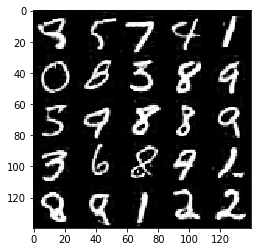

Epoch 23/25... Discriminator Loss: 0.5549... Generator Loss: 2.2322
Epoch 23/25... Discriminator Loss: 0.7236... Generator Loss: 1.3147
Epoch 23/25... Discriminator Loss: 0.6426... Generator Loss: 1.9549
Epoch 23/25... Discriminator Loss: 0.7006... Generator Loss: 1.4069
Epoch 23/25... Discriminator Loss: 0.9929... Generator Loss: 1.0031
Epoch 23/25... Discriminator Loss: 1.0510... Generator Loss: 0.8824
Epoch 23/25... Discriminator Loss: 0.7719... Generator Loss: 1.2196
Epoch 23/25... Discriminator Loss: 0.8451... Generator Loss: 1.1024
Epoch 23/25... Discriminator Loss: 0.7176... Generator Loss: 1.3786
Epoch 23/25... Discriminator Loss: 0.4124... Generator Loss: 3.0907


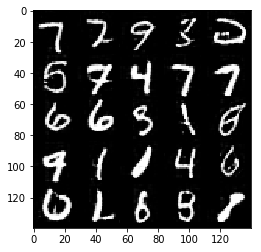

Epoch 23/25... Discriminator Loss: 0.6521... Generator Loss: 1.5792
Epoch 23/25... Discriminator Loss: 0.6600... Generator Loss: 1.5342
Epoch 23/25... Discriminator Loss: 0.8266... Generator Loss: 1.1338
Epoch 23/25... Discriminator Loss: 0.6403... Generator Loss: 2.3438
Epoch 23/25... Discriminator Loss: 2.1671... Generator Loss: 0.4265
Epoch 23/25... Discriminator Loss: 0.9314... Generator Loss: 1.1194
Epoch 23/25... Discriminator Loss: 0.6548... Generator Loss: 1.5828
Epoch 23/25... Discriminator Loss: 0.7525... Generator Loss: 1.4276
Epoch 23/25... Discriminator Loss: 0.8122... Generator Loss: 1.1567
Epoch 23/25... Discriminator Loss: 0.6482... Generator Loss: 1.5288


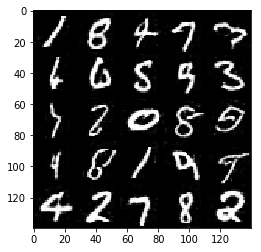

Epoch 23/25... Discriminator Loss: 0.5835... Generator Loss: 1.9108
Epoch 23/25... Discriminator Loss: 0.7632... Generator Loss: 1.2624
Epoch 23/25... Discriminator Loss: 0.6297... Generator Loss: 1.6537
Epoch 23/25... Discriminator Loss: 0.5890... Generator Loss: 1.7740
Epoch 23/25... Discriminator Loss: 0.4603... Generator Loss: 2.4711
Epoch 23/25... Discriminator Loss: 0.9169... Generator Loss: 0.9937
Epoch 24/25... Discriminator Loss: 0.8053... Generator Loss: 1.2088
Epoch 24/25... Discriminator Loss: 0.5220... Generator Loss: 2.0666
Epoch 24/25... Discriminator Loss: 0.7204... Generator Loss: 2.0051
Epoch 24/25... Discriminator Loss: 0.8781... Generator Loss: 2.9017


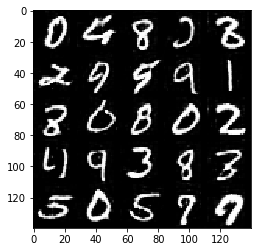

Epoch 24/25... Discriminator Loss: 0.6595... Generator Loss: 2.0700
Epoch 24/25... Discriminator Loss: 0.7864... Generator Loss: 1.2597
Epoch 24/25... Discriminator Loss: 0.6800... Generator Loss: 1.9880
Epoch 24/25... Discriminator Loss: 0.7196... Generator Loss: 1.4464
Epoch 24/25... Discriminator Loss: 0.5716... Generator Loss: 1.9365
Epoch 24/25... Discriminator Loss: 0.8000... Generator Loss: 1.3593
Epoch 24/25... Discriminator Loss: 0.7424... Generator Loss: 2.7461
Epoch 24/25... Discriminator Loss: 0.7770... Generator Loss: 2.2202
Epoch 24/25... Discriminator Loss: 0.9646... Generator Loss: 0.9517
Epoch 24/25... Discriminator Loss: 0.7906... Generator Loss: 1.2334


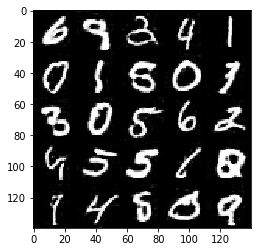

Epoch 24/25... Discriminator Loss: 0.7973... Generator Loss: 1.2083
Epoch 24/25... Discriminator Loss: 0.5724... Generator Loss: 1.8629
Epoch 24/25... Discriminator Loss: 0.8574... Generator Loss: 1.0567
Epoch 24/25... Discriminator Loss: 0.8555... Generator Loss: 1.1086
Epoch 24/25... Discriminator Loss: 0.7353... Generator Loss: 1.3045
Epoch 24/25... Discriminator Loss: 0.5483... Generator Loss: 1.9824
Epoch 24/25... Discriminator Loss: 0.7205... Generator Loss: 1.3038
Epoch 24/25... Discriminator Loss: 0.4520... Generator Loss: 2.7300
Epoch 24/25... Discriminator Loss: 0.7172... Generator Loss: 1.4298
Epoch 24/25... Discriminator Loss: 0.6189... Generator Loss: 2.4576


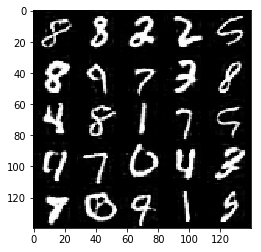

Epoch 24/25... Discriminator Loss: 0.8969... Generator Loss: 1.0473
Epoch 24/25... Discriminator Loss: 0.5741... Generator Loss: 1.9041
Epoch 24/25... Discriminator Loss: 0.6870... Generator Loss: 1.5138
Epoch 24/25... Discriminator Loss: 0.8122... Generator Loss: 1.1848
Epoch 24/25... Discriminator Loss: 0.6386... Generator Loss: 1.5344
Epoch 24/25... Discriminator Loss: 0.5800... Generator Loss: 1.9647
Epoch 24/25... Discriminator Loss: 2.0920... Generator Loss: 4.9201
Epoch 24/25... Discriminator Loss: 0.7810... Generator Loss: 2.0947
Epoch 24/25... Discriminator Loss: 0.7483... Generator Loss: 1.7305
Epoch 24/25... Discriminator Loss: 1.2300... Generator Loss: 0.7528


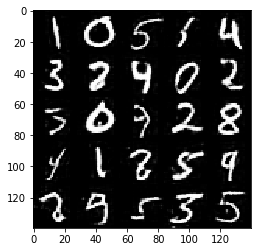

Epoch 24/25... Discriminator Loss: 1.0632... Generator Loss: 0.9114
Epoch 24/25... Discriminator Loss: 0.5542... Generator Loss: 1.9497
Epoch 24/25... Discriminator Loss: 0.6732... Generator Loss: 1.7858
Epoch 24/25... Discriminator Loss: 2.0252... Generator Loss: 4.1009
Epoch 24/25... Discriminator Loss: 0.7389... Generator Loss: 1.3654
Epoch 24/25... Discriminator Loss: 1.0378... Generator Loss: 1.0825
Epoch 24/25... Discriminator Loss: 0.7035... Generator Loss: 2.2294
Epoch 24/25... Discriminator Loss: 0.9927... Generator Loss: 0.8893
Epoch 24/25... Discriminator Loss: 0.6575... Generator Loss: 1.5472
Epoch 24/25... Discriminator Loss: 0.5528... Generator Loss: 2.1068


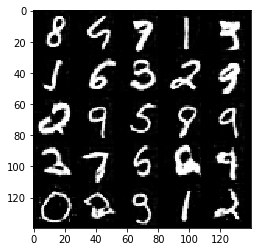

Epoch 24/25... Discriminator Loss: 0.7863... Generator Loss: 1.2283
Epoch 24/25... Discriminator Loss: 0.6922... Generator Loss: 1.4507
Epoch 24/25... Discriminator Loss: 0.6376... Generator Loss: 1.6567
Epoch 25/25... Discriminator Loss: 0.6075... Generator Loss: 1.6634
Epoch 25/25... Discriminator Loss: 0.6592... Generator Loss: 1.4972
Epoch 25/25... Discriminator Loss: 0.6423... Generator Loss: 1.5629
Epoch 25/25... Discriminator Loss: 0.7703... Generator Loss: 1.3117
Epoch 25/25... Discriminator Loss: 0.6752... Generator Loss: 1.5034
Epoch 25/25... Discriminator Loss: 1.3041... Generator Loss: 0.6103
Epoch 25/25... Discriminator Loss: 0.7381... Generator Loss: 1.4547


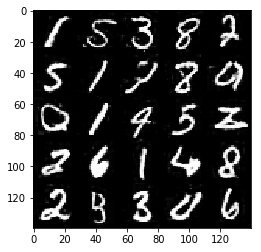

Epoch 25/25... Discriminator Loss: 0.6723... Generator Loss: 1.9601
Epoch 25/25... Discriminator Loss: 0.6836... Generator Loss: 2.2305
Epoch 25/25... Discriminator Loss: 0.9187... Generator Loss: 2.8872
Epoch 25/25... Discriminator Loss: 0.6313... Generator Loss: 2.0760
Epoch 25/25... Discriminator Loss: 0.8560... Generator Loss: 1.0936
Epoch 25/25... Discriminator Loss: 0.6867... Generator Loss: 1.5017
Epoch 25/25... Discriminator Loss: 0.7059... Generator Loss: 1.3644
Epoch 25/25... Discriminator Loss: 0.5096... Generator Loss: 2.2477
Epoch 25/25... Discriminator Loss: 0.7659... Generator Loss: 1.2725
Epoch 25/25... Discriminator Loss: 0.7282... Generator Loss: 1.6572


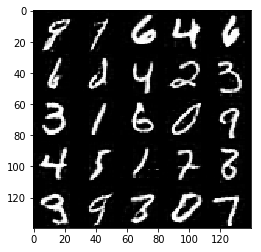

Epoch 25/25... Discriminator Loss: 0.5464... Generator Loss: 2.1875
Epoch 25/25... Discriminator Loss: 0.6837... Generator Loss: 1.4924
Epoch 25/25... Discriminator Loss: 0.8348... Generator Loss: 1.1237
Epoch 25/25... Discriminator Loss: 0.5263... Generator Loss: 1.9843
Epoch 25/25... Discriminator Loss: 0.6437... Generator Loss: 1.5980
Epoch 25/25... Discriminator Loss: 0.6100... Generator Loss: 1.6447
Epoch 25/25... Discriminator Loss: 0.7210... Generator Loss: 1.4066
Epoch 25/25... Discriminator Loss: 0.7043... Generator Loss: 1.3761
Epoch 25/25... Discriminator Loss: 0.5728... Generator Loss: 1.8115
Epoch 25/25... Discriminator Loss: 1.0041... Generator Loss: 0.8657


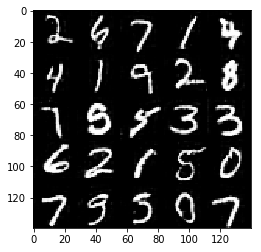

Epoch 25/25... Discriminator Loss: 0.5254... Generator Loss: 2.0996
Epoch 25/25... Discriminator Loss: 0.4590... Generator Loss: 2.7913
Epoch 25/25... Discriminator Loss: 1.1397... Generator Loss: 0.7801
Epoch 25/25... Discriminator Loss: 0.6141... Generator Loss: 1.6717
Epoch 25/25... Discriminator Loss: 0.6353... Generator Loss: 1.6296
Epoch 25/25... Discriminator Loss: 0.6147... Generator Loss: 1.7136
Epoch 25/25... Discriminator Loss: 0.5810... Generator Loss: 1.8149
Epoch 25/25... Discriminator Loss: 0.7257... Generator Loss: 1.4091
Epoch 25/25... Discriminator Loss: 0.6807... Generator Loss: 1.5607
Epoch 25/25... Discriminator Loss: 0.9667... Generator Loss: 1.0118


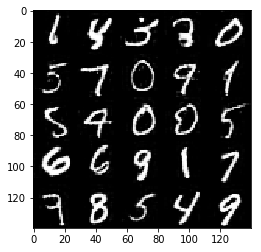

Epoch 25/25... Discriminator Loss: 1.6178... Generator Loss: 0.7435
Epoch 25/25... Discriminator Loss: 0.7495... Generator Loss: 1.2829
Epoch 25/25... Discriminator Loss: 0.7207... Generator Loss: 1.4118
Epoch 25/25... Discriminator Loss: 0.6457... Generator Loss: 1.7744
Epoch 25/25... Discriminator Loss: 0.6099... Generator Loss: 1.8294
Epoch 25/25... Discriminator Loss: 0.7092... Generator Loss: 1.3920
Epoch 25/25... Discriminator Loss: 0.8246... Generator Loss: 1.2143
Epoch 25/25... Discriminator Loss: 0.9713... Generator Loss: 1.0418
Epoch 25/25... Discriminator Loss: 0.5857... Generator Loss: 1.7495
Epoch 25/25... Discriminator Loss: 0.6282... Generator Loss: 1.5928


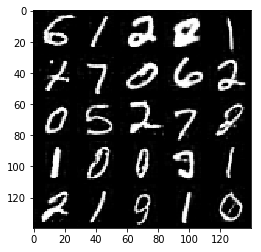

In [25]:
batch_size = 128
z_dim = 512
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 25

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discriminator Loss: 0.6201... Generator Loss: 2.8750
Epoch 1/10... Discriminator Loss: 0.5115... Generator Loss: 3.1992
Epoch 1/10... Discriminator Loss: 0.5446... Generator Loss: 3.0213
Epoch 1/10... Discriminator Loss: 0.5487... Generator Loss: 6.8241
Epoch 1/10... Discriminator Loss: 0.6515... Generator Loss: 2.0392
Epoch 1/10... Discriminator Loss: 0.4798... Generator Loss: 2.9571
Epoch 1/10... Discriminator Loss: 0.5497... Generator Loss: 2.1911
Epoch 1/10... Discriminator Loss: 0.6562... Generator Loss: 2.0632
Epoch 1/10... Discriminator Loss: 0.7137... Generator Loss: 1.5585
Epoch 1/10... Discriminator Loss: 0.6786... Generator Loss: 2.4273


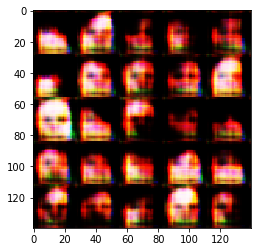

Epoch 1/10... Discriminator Loss: 1.0594... Generator Loss: 1.0628
Epoch 1/10... Discriminator Loss: 1.0706... Generator Loss: 0.9463
Epoch 1/10... Discriminator Loss: 0.9153... Generator Loss: 1.7193
Epoch 1/10... Discriminator Loss: 0.7754... Generator Loss: 1.5922
Epoch 1/10... Discriminator Loss: 1.1161... Generator Loss: 0.8112
Epoch 1/10... Discriminator Loss: 0.6839... Generator Loss: 2.0354
Epoch 1/10... Discriminator Loss: 1.1087... Generator Loss: 0.9201
Epoch 1/10... Discriminator Loss: 0.8029... Generator Loss: 2.4073
Epoch 1/10... Discriminator Loss: 0.5793... Generator Loss: 2.5054
Epoch 1/10... Discriminator Loss: 0.6621... Generator Loss: 3.8161


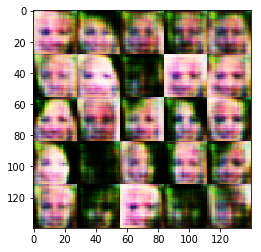

Epoch 1/10... Discriminator Loss: 0.5514... Generator Loss: 2.5901
Epoch 1/10... Discriminator Loss: 0.9320... Generator Loss: 1.3693
Epoch 1/10... Discriminator Loss: 1.2906... Generator Loss: 0.6721
Epoch 1/10... Discriminator Loss: 0.6146... Generator Loss: 1.9471
Epoch 1/10... Discriminator Loss: 0.7180... Generator Loss: 2.3303
Epoch 1/10... Discriminator Loss: 0.6131... Generator Loss: 1.8003
Epoch 1/10... Discriminator Loss: 0.5110... Generator Loss: 2.5356
Epoch 1/10... Discriminator Loss: 0.7215... Generator Loss: 1.4163
Epoch 1/10... Discriminator Loss: 0.9729... Generator Loss: 2.5961
Epoch 1/10... Discriminator Loss: 1.0155... Generator Loss: 4.0743


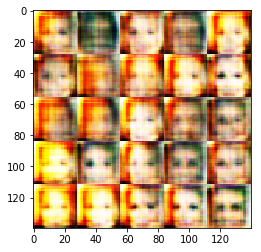

Epoch 1/10... Discriminator Loss: 0.7812... Generator Loss: 1.5927
Epoch 1/10... Discriminator Loss: 1.0552... Generator Loss: 0.9819
Epoch 1/10... Discriminator Loss: 1.5931... Generator Loss: 4.8741
Epoch 1/10... Discriminator Loss: 0.8742... Generator Loss: 1.9016
Epoch 1/10... Discriminator Loss: 1.2488... Generator Loss: 0.6981
Epoch 1/10... Discriminator Loss: 0.8239... Generator Loss: 1.4557
Epoch 1/10... Discriminator Loss: 0.5997... Generator Loss: 2.3956
Epoch 1/10... Discriminator Loss: 0.6405... Generator Loss: 2.7837
Epoch 1/10... Discriminator Loss: 0.6586... Generator Loss: 1.6713
Epoch 1/10... Discriminator Loss: 0.8776... Generator Loss: 2.2224


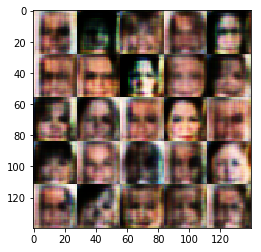

Epoch 1/10... Discriminator Loss: 0.6282... Generator Loss: 2.4382
Epoch 1/10... Discriminator Loss: 0.6455... Generator Loss: 2.0032
Epoch 1/10... Discriminator Loss: 0.9564... Generator Loss: 1.1896
Epoch 1/10... Discriminator Loss: 0.6090... Generator Loss: 2.4216
Epoch 1/10... Discriminator Loss: 1.0750... Generator Loss: 0.8788
Epoch 1/10... Discriminator Loss: 1.6895... Generator Loss: 4.9181
Epoch 1/10... Discriminator Loss: 0.9225... Generator Loss: 1.7197
Epoch 1/10... Discriminator Loss: 0.8492... Generator Loss: 1.3033
Epoch 1/10... Discriminator Loss: 0.9295... Generator Loss: 2.1103
Epoch 1/10... Discriminator Loss: 1.1004... Generator Loss: 0.8364


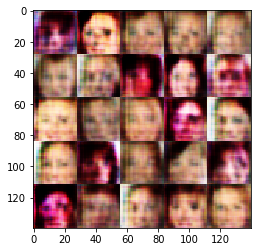

Epoch 1/10... Discriminator Loss: 0.9342... Generator Loss: 2.8947
Epoch 1/10... Discriminator Loss: 0.7375... Generator Loss: 1.6109
Epoch 1/10... Discriminator Loss: 0.8065... Generator Loss: 1.8005
Epoch 1/10... Discriminator Loss: 1.3009... Generator Loss: 0.6991
Epoch 1/10... Discriminator Loss: 1.0821... Generator Loss: 1.0815
Epoch 1/10... Discriminator Loss: 0.8731... Generator Loss: 1.2169
Epoch 1/10... Discriminator Loss: 1.1837... Generator Loss: 0.9333
Epoch 1/10... Discriminator Loss: 0.9418... Generator Loss: 3.3161
Epoch 1/10... Discriminator Loss: 1.2185... Generator Loss: 0.7113
Epoch 1/10... Discriminator Loss: 0.9303... Generator Loss: 1.1518


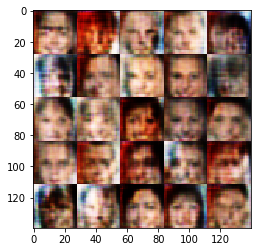

Epoch 1/10... Discriminator Loss: 0.9854... Generator Loss: 1.3254
Epoch 1/10... Discriminator Loss: 0.8923... Generator Loss: 1.2763
Epoch 1/10... Discriminator Loss: 1.1018... Generator Loss: 0.9109
Epoch 1/10... Discriminator Loss: 1.2617... Generator Loss: 0.6517
Epoch 1/10... Discriminator Loss: 0.8198... Generator Loss: 1.8251
Epoch 1/10... Discriminator Loss: 0.9399... Generator Loss: 1.4217
Epoch 1/10... Discriminator Loss: 0.6023... Generator Loss: 1.9847
Epoch 1/10... Discriminator Loss: 0.9608... Generator Loss: 1.3243
Epoch 1/10... Discriminator Loss: 1.0190... Generator Loss: 1.1953
Epoch 1/10... Discriminator Loss: 0.9994... Generator Loss: 1.6198


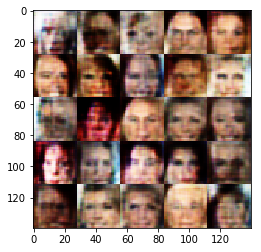

Epoch 1/10... Discriminator Loss: 0.9578... Generator Loss: 1.0649
Epoch 1/10... Discriminator Loss: 1.2123... Generator Loss: 0.7038
Epoch 1/10... Discriminator Loss: 0.5669... Generator Loss: 2.3385
Epoch 1/10... Discriminator Loss: 0.8684... Generator Loss: 1.4320
Epoch 1/10... Discriminator Loss: 1.1251... Generator Loss: 0.9583
Epoch 1/10... Discriminator Loss: 1.0672... Generator Loss: 0.9620
Epoch 1/10... Discriminator Loss: 1.7385... Generator Loss: 0.3717
Epoch 1/10... Discriminator Loss: 0.6982... Generator Loss: 1.9603
Epoch 1/10... Discriminator Loss: 1.2804... Generator Loss: 0.6736
Epoch 1/10... Discriminator Loss: 0.8923... Generator Loss: 1.2521


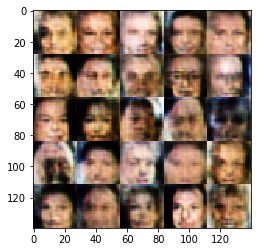

Epoch 1/10... Discriminator Loss: 1.0849... Generator Loss: 1.0420
Epoch 1/10... Discriminator Loss: 0.9569... Generator Loss: 1.2839
Epoch 1/10... Discriminator Loss: 1.0775... Generator Loss: 2.0768
Epoch 1/10... Discriminator Loss: 1.0123... Generator Loss: 1.0546
Epoch 1/10... Discriminator Loss: 1.1000... Generator Loss: 0.8592
Epoch 1/10... Discriminator Loss: 1.0109... Generator Loss: 0.9690
Epoch 1/10... Discriminator Loss: 0.7181... Generator Loss: 2.7212
Epoch 1/10... Discriminator Loss: 1.0038... Generator Loss: 1.1802
Epoch 1/10... Discriminator Loss: 1.2263... Generator Loss: 0.6771
Epoch 1/10... Discriminator Loss: 1.4007... Generator Loss: 0.5496


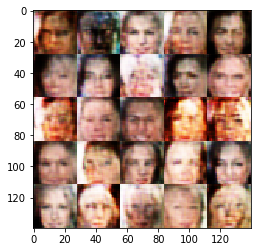

Epoch 1/10... Discriminator Loss: 1.0365... Generator Loss: 1.0056
Epoch 1/10... Discriminator Loss: 1.1941... Generator Loss: 2.6138
Epoch 1/10... Discriminator Loss: 0.9958... Generator Loss: 2.1057
Epoch 1/10... Discriminator Loss: 1.1492... Generator Loss: 0.7483
Epoch 1/10... Discriminator Loss: 1.1695... Generator Loss: 0.6936
Epoch 1/10... Discriminator Loss: 0.9871... Generator Loss: 1.8547
Epoch 1/10... Discriminator Loss: 1.0306... Generator Loss: 0.9835
Epoch 1/10... Discriminator Loss: 1.0245... Generator Loss: 0.8465
Epoch 1/10... Discriminator Loss: 0.8188... Generator Loss: 1.5721
Epoch 1/10... Discriminator Loss: 0.6964... Generator Loss: 1.8643


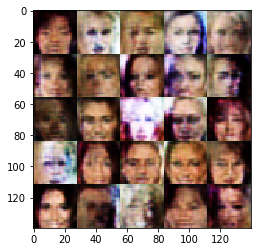

Epoch 1/10... Discriminator Loss: 0.9292... Generator Loss: 1.0454
Epoch 1/10... Discriminator Loss: 0.5055... Generator Loss: 2.6550
Epoch 1/10... Discriminator Loss: 1.1626... Generator Loss: 0.7757
Epoch 1/10... Discriminator Loss: 1.0940... Generator Loss: 0.7805
Epoch 1/10... Discriminator Loss: 1.3468... Generator Loss: 0.5774
Epoch 1/10... Discriminator Loss: 1.1284... Generator Loss: 0.8054
Epoch 1/10... Discriminator Loss: 0.8974... Generator Loss: 1.4411
Epoch 1/10... Discriminator Loss: 0.9909... Generator Loss: 1.5657
Epoch 1/10... Discriminator Loss: 0.7956... Generator Loss: 1.3603
Epoch 1/10... Discriminator Loss: 0.9506... Generator Loss: 0.9565


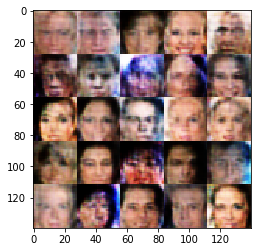

Epoch 1/10... Discriminator Loss: 0.9519... Generator Loss: 1.1022
Epoch 1/10... Discriminator Loss: 0.9646... Generator Loss: 1.3428
Epoch 1/10... Discriminator Loss: 0.9618... Generator Loss: 1.1399
Epoch 1/10... Discriminator Loss: 0.8728... Generator Loss: 1.8565
Epoch 1/10... Discriminator Loss: 1.1481... Generator Loss: 0.7252
Epoch 1/10... Discriminator Loss: 0.7651... Generator Loss: 1.6044
Epoch 1/10... Discriminator Loss: 1.0763... Generator Loss: 1.1894
Epoch 1/10... Discriminator Loss: 0.9085... Generator Loss: 1.6840
Epoch 1/10... Discriminator Loss: 0.8435... Generator Loss: 1.8322
Epoch 1/10... Discriminator Loss: 1.2292... Generator Loss: 0.6469


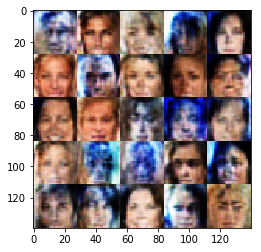

Epoch 1/10... Discriminator Loss: 0.7450... Generator Loss: 1.5525
Epoch 1/10... Discriminator Loss: 0.9734... Generator Loss: 1.8677
Epoch 1/10... Discriminator Loss: 0.8820... Generator Loss: 1.4619
Epoch 1/10... Discriminator Loss: 0.6960... Generator Loss: 1.8308
Epoch 1/10... Discriminator Loss: 1.1109... Generator Loss: 0.7607
Epoch 1/10... Discriminator Loss: 0.8090... Generator Loss: 1.3383
Epoch 1/10... Discriminator Loss: 0.7919... Generator Loss: 1.2601
Epoch 1/10... Discriminator Loss: 0.8321... Generator Loss: 2.5773
Epoch 1/10... Discriminator Loss: 0.8376... Generator Loss: 1.6468
Epoch 1/10... Discriminator Loss: 1.3848... Generator Loss: 0.5402


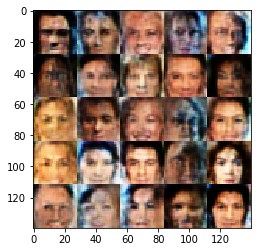

Epoch 1/10... Discriminator Loss: 0.8237... Generator Loss: 1.3949
Epoch 1/10... Discriminator Loss: 1.6675... Generator Loss: 0.3682
Epoch 1/10... Discriminator Loss: 1.0003... Generator Loss: 1.3795
Epoch 1/10... Discriminator Loss: 0.9587... Generator Loss: 1.1484
Epoch 1/10... Discriminator Loss: 0.8468... Generator Loss: 2.1318
Epoch 1/10... Discriminator Loss: 1.1598... Generator Loss: 0.6858
Epoch 1/10... Discriminator Loss: 0.6538... Generator Loss: 1.6283
Epoch 1/10... Discriminator Loss: 1.1191... Generator Loss: 0.7729
Epoch 1/10... Discriminator Loss: 1.5422... Generator Loss: 0.4264
Epoch 1/10... Discriminator Loss: 0.8127... Generator Loss: 2.2919


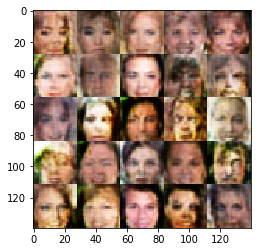

Epoch 1/10... Discriminator Loss: 1.0163... Generator Loss: 0.8935
Epoch 1/10... Discriminator Loss: 0.7620... Generator Loss: 1.4734
Epoch 1/10... Discriminator Loss: 1.2371... Generator Loss: 0.6083
Epoch 1/10... Discriminator Loss: 0.7811... Generator Loss: 2.5847
Epoch 1/10... Discriminator Loss: 1.2947... Generator Loss: 0.5832
Epoch 1/10... Discriminator Loss: 0.5605... Generator Loss: 1.9563
Epoch 1/10... Discriminator Loss: 0.5157... Generator Loss: 2.4953
Epoch 1/10... Discriminator Loss: 1.0252... Generator Loss: 0.9317
Epoch 1/10... Discriminator Loss: 1.1360... Generator Loss: 0.7085
Epoch 1/10... Discriminator Loss: 1.1088... Generator Loss: 0.7999


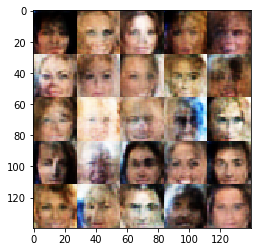

Epoch 1/10... Discriminator Loss: 0.7584... Generator Loss: 1.4464
Epoch 1/10... Discriminator Loss: 0.9599... Generator Loss: 0.9332
Epoch 1/10... Discriminator Loss: 0.8279... Generator Loss: 1.3189
Epoch 1/10... Discriminator Loss: 0.7287... Generator Loss: 1.4574
Epoch 1/10... Discriminator Loss: 0.7935... Generator Loss: 1.8086
Epoch 1/10... Discriminator Loss: 0.8623... Generator Loss: 1.1043
Epoch 1/10... Discriminator Loss: 1.3285... Generator Loss: 0.5366
Epoch 1/10... Discriminator Loss: 0.6999... Generator Loss: 1.7970
Epoch 2/10... Discriminator Loss: 0.7496... Generator Loss: 1.6709
Epoch 2/10... Discriminator Loss: 1.4162... Generator Loss: 0.4837


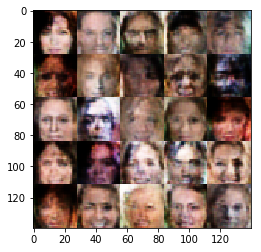

Epoch 2/10... Discriminator Loss: 0.8380... Generator Loss: 1.7887
Epoch 2/10... Discriminator Loss: 0.7922... Generator Loss: 1.5272
Epoch 2/10... Discriminator Loss: 1.4488... Generator Loss: 0.4580
Epoch 2/10... Discriminator Loss: 0.5779... Generator Loss: 2.9952
Epoch 2/10... Discriminator Loss: 0.6639... Generator Loss: 1.5776
Epoch 2/10... Discriminator Loss: 0.5801... Generator Loss: 2.5932
Epoch 2/10... Discriminator Loss: 1.9136... Generator Loss: 0.2787
Epoch 2/10... Discriminator Loss: 2.5770... Generator Loss: 0.1533
Epoch 2/10... Discriminator Loss: 1.1591... Generator Loss: 1.4641
Epoch 2/10... Discriminator Loss: 1.0646... Generator Loss: 0.8170


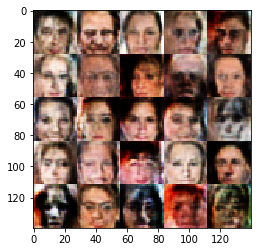

Epoch 2/10... Discriminator Loss: 0.8813... Generator Loss: 1.0249
Epoch 2/10... Discriminator Loss: 0.7279... Generator Loss: 1.3908
Epoch 2/10... Discriminator Loss: 0.9152... Generator Loss: 1.4451
Epoch 2/10... Discriminator Loss: 0.7220... Generator Loss: 2.2608
Epoch 2/10... Discriminator Loss: 0.6271... Generator Loss: 1.6890
Epoch 2/10... Discriminator Loss: 2.0880... Generator Loss: 0.2632
Epoch 2/10... Discriminator Loss: 0.9694... Generator Loss: 1.3474
Epoch 2/10... Discriminator Loss: 0.9007... Generator Loss: 1.1478
Epoch 2/10... Discriminator Loss: 0.8524... Generator Loss: 1.2385
Epoch 2/10... Discriminator Loss: 0.7379... Generator Loss: 2.3450


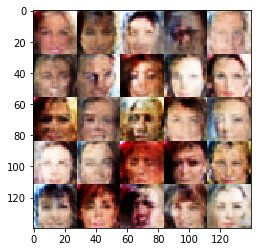

Epoch 2/10... Discriminator Loss: 0.8038... Generator Loss: 1.2827
Epoch 2/10... Discriminator Loss: 0.7571... Generator Loss: 1.2725
Epoch 2/10... Discriminator Loss: 0.6097... Generator Loss: 1.8522
Epoch 2/10... Discriminator Loss: 0.5044... Generator Loss: 2.3278
Epoch 2/10... Discriminator Loss: 1.0108... Generator Loss: 0.8205
Epoch 2/10... Discriminator Loss: 1.5868... Generator Loss: 0.4010
Epoch 2/10... Discriminator Loss: 1.0065... Generator Loss: 0.8717
Epoch 2/10... Discriminator Loss: 0.8532... Generator Loss: 1.0776
Epoch 2/10... Discriminator Loss: 0.6991... Generator Loss: 1.7193
Epoch 2/10... Discriminator Loss: 1.6539... Generator Loss: 0.3631


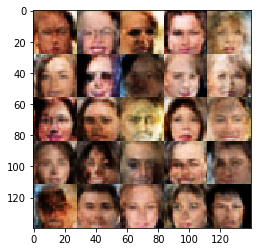

Epoch 2/10... Discriminator Loss: 1.1022... Generator Loss: 0.8406
Epoch 2/10... Discriminator Loss: 1.5651... Generator Loss: 0.4067
Epoch 2/10... Discriminator Loss: 0.8466... Generator Loss: 1.3018
Epoch 2/10... Discriminator Loss: 1.0869... Generator Loss: 0.7689
Epoch 2/10... Discriminator Loss: 1.1346... Generator Loss: 0.7023
Epoch 2/10... Discriminator Loss: 0.4611... Generator Loss: 3.5695
Epoch 2/10... Discriminator Loss: 1.2552... Generator Loss: 2.4557
Epoch 2/10... Discriminator Loss: 1.1854... Generator Loss: 0.7580
Epoch 2/10... Discriminator Loss: 0.7076... Generator Loss: 1.6631
Epoch 2/10... Discriminator Loss: 1.0316... Generator Loss: 0.8274


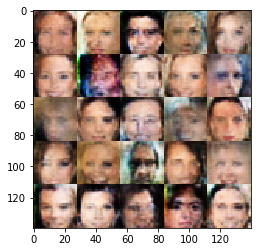

Epoch 2/10... Discriminator Loss: 0.6636... Generator Loss: 1.8276
Epoch 2/10... Discriminator Loss: 1.4491... Generator Loss: 0.4707
Epoch 2/10... Discriminator Loss: 0.6692... Generator Loss: 2.4437
Epoch 2/10... Discriminator Loss: 0.9576... Generator Loss: 0.9250
Epoch 2/10... Discriminator Loss: 0.8071... Generator Loss: 1.5928
Epoch 2/10... Discriminator Loss: 0.7209... Generator Loss: 2.1769
Epoch 2/10... Discriminator Loss: 1.2499... Generator Loss: 0.6102
Epoch 2/10... Discriminator Loss: 0.9366... Generator Loss: 1.1416
Epoch 2/10... Discriminator Loss: 0.8664... Generator Loss: 1.4063
Epoch 2/10... Discriminator Loss: 1.0229... Generator Loss: 0.8309


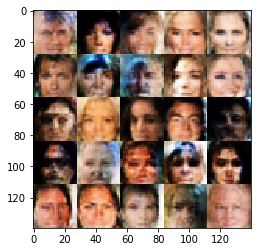

Epoch 2/10... Discriminator Loss: 1.0121... Generator Loss: 0.8976
Epoch 2/10... Discriminator Loss: 0.9288... Generator Loss: 1.1691
Epoch 2/10... Discriminator Loss: 1.1609... Generator Loss: 0.6913
Epoch 2/10... Discriminator Loss: 0.6573... Generator Loss: 1.6082
Epoch 2/10... Discriminator Loss: 0.6871... Generator Loss: 1.4528
Epoch 2/10... Discriminator Loss: 0.9066... Generator Loss: 1.0383
Epoch 2/10... Discriminator Loss: 0.9172... Generator Loss: 1.7488
Epoch 2/10... Discriminator Loss: 0.8371... Generator Loss: 1.6028
Epoch 2/10... Discriminator Loss: 1.1473... Generator Loss: 2.5522
Epoch 2/10... Discriminator Loss: 0.9669... Generator Loss: 1.0233


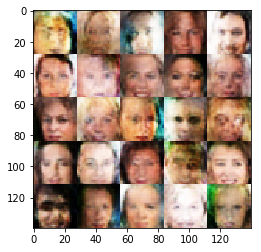

Epoch 2/10... Discriminator Loss: 0.7993... Generator Loss: 1.5388
Epoch 2/10... Discriminator Loss: 0.9204... Generator Loss: 1.1536
Epoch 2/10... Discriminator Loss: 0.8582... Generator Loss: 1.1619
Epoch 2/10... Discriminator Loss: 1.0762... Generator Loss: 0.7914
Epoch 2/10... Discriminator Loss: 1.0139... Generator Loss: 0.9279
Epoch 2/10... Discriminator Loss: 0.8542... Generator Loss: 1.4427
Epoch 2/10... Discriminator Loss: 0.9946... Generator Loss: 0.9001
Epoch 2/10... Discriminator Loss: 0.9679... Generator Loss: 1.2328
Epoch 2/10... Discriminator Loss: 1.0859... Generator Loss: 0.8083
Epoch 2/10... Discriminator Loss: 0.5821... Generator Loss: 2.1372


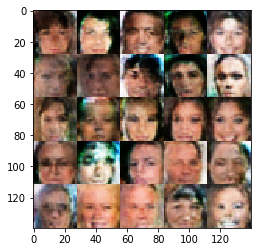

Epoch 2/10... Discriminator Loss: 0.8122... Generator Loss: 1.2733
Epoch 2/10... Discriminator Loss: 1.0201... Generator Loss: 0.8946
Epoch 2/10... Discriminator Loss: 0.8145... Generator Loss: 1.8223
Epoch 2/10... Discriminator Loss: 0.9298... Generator Loss: 0.9433
Epoch 2/10... Discriminator Loss: 0.9233... Generator Loss: 1.7383
Epoch 2/10... Discriminator Loss: 1.3797... Generator Loss: 2.2506
Epoch 2/10... Discriminator Loss: 1.0535... Generator Loss: 0.9250
Epoch 2/10... Discriminator Loss: 0.9805... Generator Loss: 0.8865
Epoch 2/10... Discriminator Loss: 1.0323... Generator Loss: 0.9425
Epoch 2/10... Discriminator Loss: 0.9550... Generator Loss: 1.0203


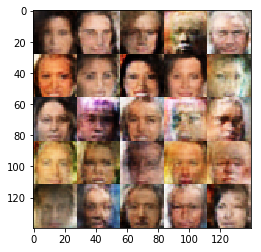

Epoch 2/10... Discriminator Loss: 0.9713... Generator Loss: 1.5402
Epoch 2/10... Discriminator Loss: 1.0165... Generator Loss: 0.8316
Epoch 2/10... Discriminator Loss: 1.2086... Generator Loss: 0.6369
Epoch 2/10... Discriminator Loss: 1.0120... Generator Loss: 0.8526
Epoch 2/10... Discriminator Loss: 0.9375... Generator Loss: 1.2753
Epoch 2/10... Discriminator Loss: 0.7619... Generator Loss: 2.4687
Epoch 2/10... Discriminator Loss: 0.7792... Generator Loss: 1.8136
Epoch 2/10... Discriminator Loss: 0.9228... Generator Loss: 1.0489
Epoch 2/10... Discriminator Loss: 0.9531... Generator Loss: 0.9467
Epoch 2/10... Discriminator Loss: 1.0498... Generator Loss: 0.9287


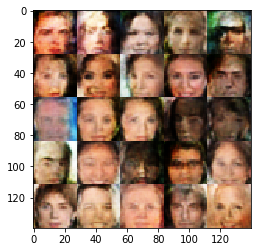

Epoch 2/10... Discriminator Loss: 0.9001... Generator Loss: 1.0168
Epoch 2/10... Discriminator Loss: 0.8622... Generator Loss: 1.7923
Epoch 2/10... Discriminator Loss: 0.9661... Generator Loss: 1.9691
Epoch 2/10... Discriminator Loss: 0.7063... Generator Loss: 1.4003
Epoch 2/10... Discriminator Loss: 0.9498... Generator Loss: 1.3710
Epoch 2/10... Discriminator Loss: 1.3246... Generator Loss: 0.5572
Epoch 2/10... Discriminator Loss: 0.9324... Generator Loss: 1.0441
Epoch 2/10... Discriminator Loss: 0.8230... Generator Loss: 1.2928
Epoch 2/10... Discriminator Loss: 1.2125... Generator Loss: 0.6171
Epoch 2/10... Discriminator Loss: 1.1185... Generator Loss: 0.7891


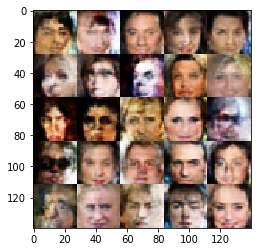

Epoch 2/10... Discriminator Loss: 0.6093... Generator Loss: 1.6757
Epoch 2/10... Discriminator Loss: 0.8724... Generator Loss: 1.4364
Epoch 2/10... Discriminator Loss: 0.7377... Generator Loss: 1.3410
Epoch 2/10... Discriminator Loss: 0.8499... Generator Loss: 1.2886
Epoch 2/10... Discriminator Loss: 0.9117... Generator Loss: 1.1813
Epoch 2/10... Discriminator Loss: 1.4024... Generator Loss: 0.4873
Epoch 2/10... Discriminator Loss: 1.2389... Generator Loss: 0.6161
Epoch 2/10... Discriminator Loss: 1.2991... Generator Loss: 0.5533
Epoch 2/10... Discriminator Loss: 1.0239... Generator Loss: 0.9002
Epoch 2/10... Discriminator Loss: 1.1921... Generator Loss: 0.6788


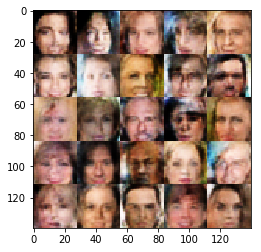

Epoch 2/10... Discriminator Loss: 0.9395... Generator Loss: 1.1520
Epoch 2/10... Discriminator Loss: 0.5077... Generator Loss: 2.0830
Epoch 2/10... Discriminator Loss: 0.9767... Generator Loss: 0.9215
Epoch 2/10... Discriminator Loss: 1.2588... Generator Loss: 0.6020
Epoch 2/10... Discriminator Loss: 0.8966... Generator Loss: 1.2628
Epoch 2/10... Discriminator Loss: 1.3316... Generator Loss: 0.5316
Epoch 2/10... Discriminator Loss: 1.0217... Generator Loss: 0.8820
Epoch 2/10... Discriminator Loss: 1.2270... Generator Loss: 0.6156
Epoch 2/10... Discriminator Loss: 3.2354... Generator Loss: 4.2486
Epoch 2/10... Discriminator Loss: 0.9234... Generator Loss: 1.2882


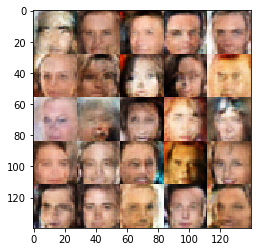

Epoch 2/10... Discriminator Loss: 0.9069... Generator Loss: 1.2906
Epoch 2/10... Discriminator Loss: 0.9430... Generator Loss: 1.0576
Epoch 2/10... Discriminator Loss: 1.1060... Generator Loss: 0.7592
Epoch 2/10... Discriminator Loss: 1.0932... Generator Loss: 1.4139
Epoch 2/10... Discriminator Loss: 0.8889... Generator Loss: 1.1006
Epoch 2/10... Discriminator Loss: 0.7255... Generator Loss: 1.3994
Epoch 2/10... Discriminator Loss: 0.8364... Generator Loss: 1.1092
Epoch 2/10... Discriminator Loss: 1.1481... Generator Loss: 0.6954
Epoch 2/10... Discriminator Loss: 0.8130... Generator Loss: 1.1447
Epoch 2/10... Discriminator Loss: 1.1361... Generator Loss: 0.6927


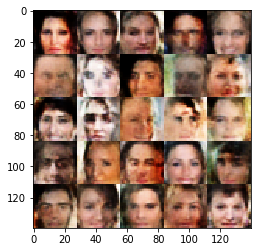

Epoch 2/10... Discriminator Loss: 0.8110... Generator Loss: 1.5590
Epoch 2/10... Discriminator Loss: 0.9064... Generator Loss: 1.1893
Epoch 2/10... Discriminator Loss: 1.0156... Generator Loss: 0.8450
Epoch 2/10... Discriminator Loss: 1.1207... Generator Loss: 0.7345
Epoch 2/10... Discriminator Loss: 1.0772... Generator Loss: 0.8770
Epoch 2/10... Discriminator Loss: 0.7613... Generator Loss: 2.9945
Epoch 2/10... Discriminator Loss: 1.1326... Generator Loss: 0.7787
Epoch 2/10... Discriminator Loss: 1.0410... Generator Loss: 0.9024
Epoch 2/10... Discriminator Loss: 0.8004... Generator Loss: 1.7923
Epoch 2/10... Discriminator Loss: 1.0559... Generator Loss: 0.9606


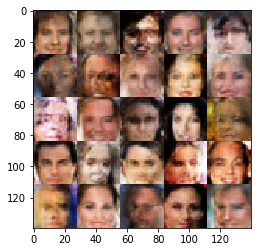

Epoch 2/10... Discriminator Loss: 0.9152... Generator Loss: 1.0868
Epoch 2/10... Discriminator Loss: 0.6336... Generator Loss: 1.8584
Epoch 2/10... Discriminator Loss: 0.9440... Generator Loss: 2.0257
Epoch 2/10... Discriminator Loss: 1.0614... Generator Loss: 0.7965
Epoch 2/10... Discriminator Loss: 1.0832... Generator Loss: 0.7526
Epoch 2/10... Discriminator Loss: 0.8785... Generator Loss: 1.0260
Epoch 2/10... Discriminator Loss: 1.0083... Generator Loss: 0.9701
Epoch 2/10... Discriminator Loss: 0.7933... Generator Loss: 1.6451
Epoch 2/10... Discriminator Loss: 0.9396... Generator Loss: 2.0571
Epoch 2/10... Discriminator Loss: 1.7736... Generator Loss: 2.7498


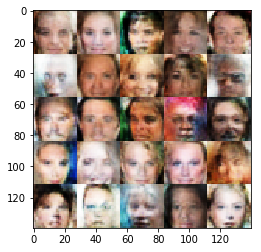

Epoch 2/10... Discriminator Loss: 1.1315... Generator Loss: 1.4662
Epoch 2/10... Discriminator Loss: 0.9912... Generator Loss: 0.9673
Epoch 2/10... Discriminator Loss: 1.0240... Generator Loss: 0.9940
Epoch 2/10... Discriminator Loss: 0.9831... Generator Loss: 0.9716
Epoch 2/10... Discriminator Loss: 0.9206... Generator Loss: 1.2113
Epoch 2/10... Discriminator Loss: 0.8825... Generator Loss: 1.0087
Epoch 3/10... Discriminator Loss: 0.8708... Generator Loss: 1.2231
Epoch 3/10... Discriminator Loss: 0.9118... Generator Loss: 1.1736
Epoch 3/10... Discriminator Loss: 1.2298... Generator Loss: 0.6187
Epoch 3/10... Discriminator Loss: 1.2598... Generator Loss: 0.5769


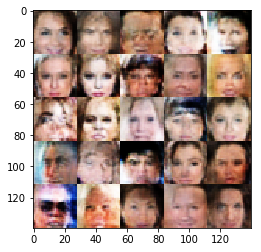

Epoch 3/10... Discriminator Loss: 0.8659... Generator Loss: 1.2192
Epoch 3/10... Discriminator Loss: 0.8534... Generator Loss: 1.2619
Epoch 3/10... Discriminator Loss: 0.7224... Generator Loss: 1.3454
Epoch 3/10... Discriminator Loss: 0.9527... Generator Loss: 0.9579
Epoch 3/10... Discriminator Loss: 0.9617... Generator Loss: 0.9030
Epoch 3/10... Discriminator Loss: 1.0522... Generator Loss: 0.7936
Epoch 3/10... Discriminator Loss: 0.7336... Generator Loss: 1.7022
Epoch 3/10... Discriminator Loss: 1.4303... Generator Loss: 0.5020
Epoch 3/10... Discriminator Loss: 1.5506... Generator Loss: 0.5048
Epoch 3/10... Discriminator Loss: 0.9876... Generator Loss: 1.0660


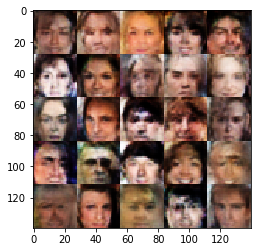

Epoch 3/10... Discriminator Loss: 1.1597... Generator Loss: 0.7309
Epoch 3/10... Discriminator Loss: 0.9856... Generator Loss: 1.3905
Epoch 3/10... Discriminator Loss: 0.5681... Generator Loss: 3.1618
Epoch 3/10... Discriminator Loss: 1.2173... Generator Loss: 0.6089
Epoch 3/10... Discriminator Loss: 0.7783... Generator Loss: 2.0820
Epoch 3/10... Discriminator Loss: 1.2328... Generator Loss: 0.6312
Epoch 3/10... Discriminator Loss: 1.8130... Generator Loss: 0.3261
Epoch 3/10... Discriminator Loss: 0.8147... Generator Loss: 1.3868
Epoch 3/10... Discriminator Loss: 0.7829... Generator Loss: 1.4558
Epoch 3/10... Discriminator Loss: 1.2542... Generator Loss: 0.6248


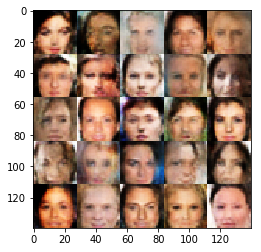

Epoch 3/10... Discriminator Loss: 0.6731... Generator Loss: 1.5253
Epoch 3/10... Discriminator Loss: 0.6830... Generator Loss: 1.5050
Epoch 3/10... Discriminator Loss: 0.9084... Generator Loss: 1.0251
Epoch 3/10... Discriminator Loss: 1.2640... Generator Loss: 0.5790
Epoch 3/10... Discriminator Loss: 0.9925... Generator Loss: 0.9141
Epoch 3/10... Discriminator Loss: 1.1036... Generator Loss: 0.7129
Epoch 3/10... Discriminator Loss: 1.1912... Generator Loss: 0.6620
Epoch 3/10... Discriminator Loss: 0.9874... Generator Loss: 1.6127
Epoch 3/10... Discriminator Loss: 0.7215... Generator Loss: 1.7428
Epoch 3/10... Discriminator Loss: 1.0880... Generator Loss: 0.8253


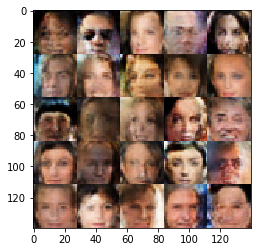

Epoch 3/10... Discriminator Loss: 0.4899... Generator Loss: 2.6060
Epoch 3/10... Discriminator Loss: 2.1072... Generator Loss: 0.2617
Epoch 3/10... Discriminator Loss: 1.4700... Generator Loss: 1.6187
Epoch 3/10... Discriminator Loss: 1.5851... Generator Loss: 0.4276
Epoch 3/10... Discriminator Loss: 0.9725... Generator Loss: 1.0301
Epoch 3/10... Discriminator Loss: 0.9938... Generator Loss: 0.8660
Epoch 3/10... Discriminator Loss: 0.4467... Generator Loss: 3.1733
Epoch 3/10... Discriminator Loss: 0.8493... Generator Loss: 1.3115
Epoch 3/10... Discriminator Loss: 0.9034... Generator Loss: 1.2137
Epoch 3/10... Discriminator Loss: 0.8117... Generator Loss: 1.3605


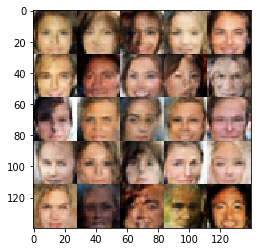

Epoch 3/10... Discriminator Loss: 1.0864... Generator Loss: 0.7606
Epoch 3/10... Discriminator Loss: 1.0863... Generator Loss: 2.6713
Epoch 3/10... Discriminator Loss: 1.1516... Generator Loss: 0.8767
Epoch 3/10... Discriminator Loss: 0.9476... Generator Loss: 1.0759
Epoch 3/10... Discriminator Loss: 0.9366... Generator Loss: 1.0547
Epoch 3/10... Discriminator Loss: 0.7799... Generator Loss: 1.5820
Epoch 3/10... Discriminator Loss: 0.9280... Generator Loss: 0.9286
Epoch 3/10... Discriminator Loss: 1.0079... Generator Loss: 1.0215
Epoch 3/10... Discriminator Loss: 1.0078... Generator Loss: 0.8319
Epoch 3/10... Discriminator Loss: 0.9796... Generator Loss: 0.9184


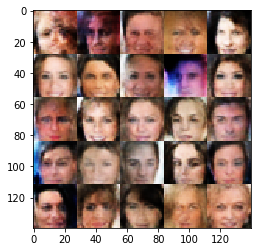

Epoch 3/10... Discriminator Loss: 0.6454... Generator Loss: 1.6073
Epoch 3/10... Discriminator Loss: 1.3806... Generator Loss: 0.4941
Epoch 3/10... Discriminator Loss: 0.7462... Generator Loss: 1.3751
Epoch 3/10... Discriminator Loss: 0.9753... Generator Loss: 0.8690
Epoch 3/10... Discriminator Loss: 1.2580... Generator Loss: 1.9689
Epoch 3/10... Discriminator Loss: 0.8188... Generator Loss: 1.3739
Epoch 3/10... Discriminator Loss: 0.9150... Generator Loss: 1.1415
Epoch 3/10... Discriminator Loss: 0.9290... Generator Loss: 1.0137
Epoch 3/10... Discriminator Loss: 0.9756... Generator Loss: 0.9157
Epoch 3/10... Discriminator Loss: 0.7551... Generator Loss: 1.7218


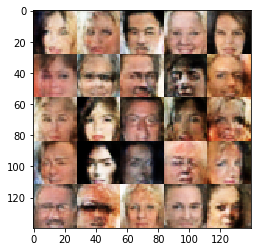

Epoch 3/10... Discriminator Loss: 1.5218... Generator Loss: 0.4337
Epoch 3/10... Discriminator Loss: 1.5210... Generator Loss: 2.6125
Epoch 3/10... Discriminator Loss: 1.0019... Generator Loss: 1.0988
Epoch 3/10... Discriminator Loss: 1.0162... Generator Loss: 0.8723
Epoch 3/10... Discriminator Loss: 0.7629... Generator Loss: 1.6860
Epoch 3/10... Discriminator Loss: 0.9931... Generator Loss: 0.9133
Epoch 3/10... Discriminator Loss: 1.3766... Generator Loss: 0.5147
Epoch 3/10... Discriminator Loss: 1.3111... Generator Loss: 2.1809
Epoch 3/10... Discriminator Loss: 0.8601... Generator Loss: 1.2288
Epoch 3/10... Discriminator Loss: 0.7029... Generator Loss: 2.0509


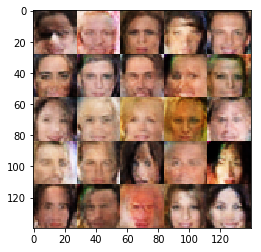

Epoch 3/10... Discriminator Loss: 0.7579... Generator Loss: 1.6105
Epoch 3/10... Discriminator Loss: 0.6973... Generator Loss: 1.3818
Epoch 3/10... Discriminator Loss: 0.7836... Generator Loss: 1.5015
Epoch 3/10... Discriminator Loss: 0.9704... Generator Loss: 1.1457
Epoch 3/10... Discriminator Loss: 1.0851... Generator Loss: 0.8259
Epoch 3/10... Discriminator Loss: 1.1771... Generator Loss: 0.6837
Epoch 3/10... Discriminator Loss: 0.8922... Generator Loss: 1.3537
Epoch 3/10... Discriminator Loss: 0.7403... Generator Loss: 1.3431
Epoch 3/10... Discriminator Loss: 0.9312... Generator Loss: 0.9833
Epoch 3/10... Discriminator Loss: 0.8978... Generator Loss: 1.5516


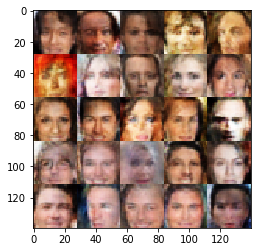

Epoch 3/10... Discriminator Loss: 0.9164... Generator Loss: 1.1433
Epoch 3/10... Discriminator Loss: 0.9182... Generator Loss: 0.9904
Epoch 3/10... Discriminator Loss: 1.0099... Generator Loss: 0.8442
Epoch 3/10... Discriminator Loss: 0.9552... Generator Loss: 1.1896
Epoch 3/10... Discriminator Loss: 0.8653... Generator Loss: 1.0543
Epoch 3/10... Discriminator Loss: 0.9707... Generator Loss: 1.0156
Epoch 3/10... Discriminator Loss: 0.6973... Generator Loss: 1.4769
Epoch 3/10... Discriminator Loss: 0.9302... Generator Loss: 0.9572
Epoch 3/10... Discriminator Loss: 1.8086... Generator Loss: 0.3209
Epoch 3/10... Discriminator Loss: 2.0102... Generator Loss: 0.3174


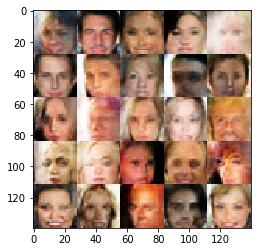

Epoch 3/10... Discriminator Loss: 0.6496... Generator Loss: 1.9841
Epoch 3/10... Discriminator Loss: 1.0782... Generator Loss: 0.9546
Epoch 3/10... Discriminator Loss: 0.8391... Generator Loss: 1.4755
Epoch 3/10... Discriminator Loss: 0.8776... Generator Loss: 1.1872
Epoch 3/10... Discriminator Loss: 1.1321... Generator Loss: 0.7219
Epoch 3/10... Discriminator Loss: 1.1186... Generator Loss: 0.8206
Epoch 3/10... Discriminator Loss: 0.7636... Generator Loss: 1.3770
Epoch 3/10... Discriminator Loss: 0.6879... Generator Loss: 1.4512
Epoch 3/10... Discriminator Loss: 0.7886... Generator Loss: 1.3264
Epoch 3/10... Discriminator Loss: 0.4548... Generator Loss: 4.9819


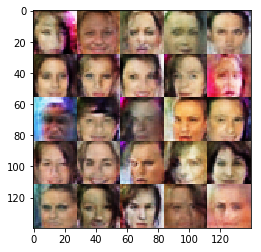

Epoch 3/10... Discriminator Loss: 1.0109... Generator Loss: 0.9152
Epoch 3/10... Discriminator Loss: 1.1666... Generator Loss: 0.7030
Epoch 3/10... Discriminator Loss: 0.8602... Generator Loss: 1.0933
Epoch 3/10... Discriminator Loss: 0.9271... Generator Loss: 1.0728
Epoch 3/10... Discriminator Loss: 1.4810... Generator Loss: 0.4553
Epoch 3/10... Discriminator Loss: 1.3725... Generator Loss: 0.5090
Epoch 3/10... Discriminator Loss: 1.0294... Generator Loss: 1.4013
Epoch 3/10... Discriminator Loss: 0.9587... Generator Loss: 1.1249
Epoch 3/10... Discriminator Loss: 0.8550... Generator Loss: 1.1393
Epoch 3/10... Discriminator Loss: 0.9693... Generator Loss: 0.9143


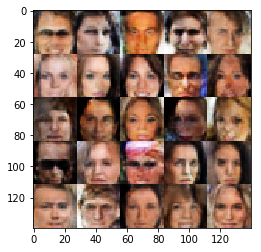

Epoch 3/10... Discriminator Loss: 1.1698... Generator Loss: 0.6990
Epoch 3/10... Discriminator Loss: 1.2221... Generator Loss: 2.8068
Epoch 3/10... Discriminator Loss: 0.9734... Generator Loss: 0.9488
Epoch 3/10... Discriminator Loss: 1.0552... Generator Loss: 0.8146
Epoch 3/10... Discriminator Loss: 0.8512... Generator Loss: 1.6289
Epoch 3/10... Discriminator Loss: 0.8433... Generator Loss: 1.7474
Epoch 3/10... Discriminator Loss: 0.8328... Generator Loss: 1.8852
Epoch 3/10... Discriminator Loss: 8.0666... Generator Loss: 9.8222
Epoch 3/10... Discriminator Loss: 1.5502... Generator Loss: 0.4796
Epoch 3/10... Discriminator Loss: 0.7606... Generator Loss: 1.9233


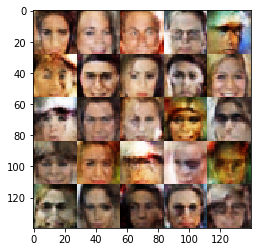

Epoch 3/10... Discriminator Loss: 1.1231... Generator Loss: 0.9463
Epoch 3/10... Discriminator Loss: 0.9720... Generator Loss: 1.4136
Epoch 3/10... Discriminator Loss: 1.1636... Generator Loss: 0.8480
Epoch 3/10... Discriminator Loss: 0.9704... Generator Loss: 2.3649
Epoch 3/10... Discriminator Loss: 0.6969... Generator Loss: 1.8327
Epoch 3/10... Discriminator Loss: 0.6923... Generator Loss: 1.7859
Epoch 3/10... Discriminator Loss: 0.5245... Generator Loss: 2.0175
Epoch 3/10... Discriminator Loss: 0.9029... Generator Loss: 1.1893
Epoch 3/10... Discriminator Loss: 0.8322... Generator Loss: 1.1595
Epoch 3/10... Discriminator Loss: 0.7853... Generator Loss: 1.2374


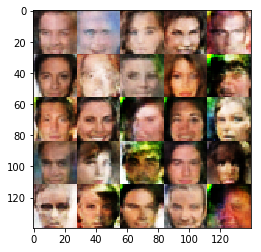

Epoch 3/10... Discriminator Loss: 0.5980... Generator Loss: 1.8438
Epoch 3/10... Discriminator Loss: 1.3105... Generator Loss: 0.5257
Epoch 3/10... Discriminator Loss: 1.2445... Generator Loss: 0.6956
Epoch 3/10... Discriminator Loss: 0.8838... Generator Loss: 1.7577
Epoch 3/10... Discriminator Loss: 1.0086... Generator Loss: 0.8633
Epoch 3/10... Discriminator Loss: 0.8964... Generator Loss: 1.0050
Epoch 3/10... Discriminator Loss: 0.8398... Generator Loss: 1.2521
Epoch 3/10... Discriminator Loss: 0.8592... Generator Loss: 1.0578
Epoch 3/10... Discriminator Loss: 1.1160... Generator Loss: 2.7370
Epoch 3/10... Discriminator Loss: 1.1644... Generator Loss: 0.6750


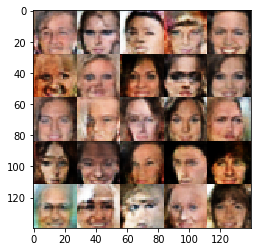

Epoch 3/10... Discriminator Loss: 0.9804... Generator Loss: 0.9394
Epoch 3/10... Discriminator Loss: 0.8642... Generator Loss: 1.0931
Epoch 3/10... Discriminator Loss: 1.0657... Generator Loss: 0.8126
Epoch 3/10... Discriminator Loss: 0.7413... Generator Loss: 1.3300
Epoch 3/10... Discriminator Loss: 0.9857... Generator Loss: 0.9205
Epoch 3/10... Discriminator Loss: 0.9691... Generator Loss: 0.9211
Epoch 3/10... Discriminator Loss: 0.6935... Generator Loss: 2.3450
Epoch 3/10... Discriminator Loss: 0.8947... Generator Loss: 1.6150
Epoch 3/10... Discriminator Loss: 1.6839... Generator Loss: 0.3496
Epoch 3/10... Discriminator Loss: 0.7455... Generator Loss: 1.3993


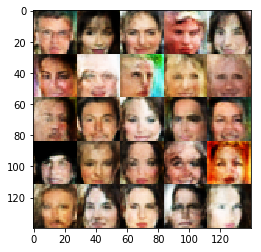

Epoch 3/10... Discriminator Loss: 0.8670... Generator Loss: 1.9991
Epoch 3/10... Discriminator Loss: 0.9236... Generator Loss: 0.9601
Epoch 3/10... Discriminator Loss: 1.3016... Generator Loss: 0.5393
Epoch 3/10... Discriminator Loss: 1.1203... Generator Loss: 0.7558
Epoch 4/10... Discriminator Loss: 0.8613... Generator Loss: 1.0703
Epoch 4/10... Discriminator Loss: 0.8678... Generator Loss: 1.0452
Epoch 4/10... Discriminator Loss: 1.3133... Generator Loss: 2.0429
Epoch 4/10... Discriminator Loss: 0.7983... Generator Loss: 1.4178
Epoch 4/10... Discriminator Loss: 0.7833... Generator Loss: 1.2186
Epoch 4/10... Discriminator Loss: 1.6063... Generator Loss: 0.4238


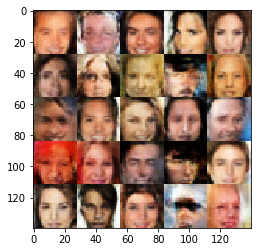

Epoch 4/10... Discriminator Loss: 1.3262... Generator Loss: 0.6600
Epoch 4/10... Discriminator Loss: 1.1253... Generator Loss: 0.7589
Epoch 4/10... Discriminator Loss: 0.4116... Generator Loss: 4.7349
Epoch 4/10... Discriminator Loss: 0.7909... Generator Loss: 1.3029
Epoch 4/10... Discriminator Loss: 0.7052... Generator Loss: 1.3866
Epoch 4/10... Discriminator Loss: 0.7434... Generator Loss: 2.2931
Epoch 4/10... Discriminator Loss: 1.0132... Generator Loss: 0.8967
Epoch 4/10... Discriminator Loss: 1.0610... Generator Loss: 0.8469
Epoch 4/10... Discriminator Loss: 1.3843... Generator Loss: 0.5253
Epoch 4/10... Discriminator Loss: 1.3498... Generator Loss: 0.5306


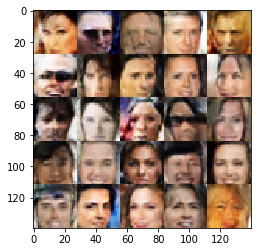

Epoch 4/10... Discriminator Loss: 0.6924... Generator Loss: 1.5307
Epoch 4/10... Discriminator Loss: 0.9497... Generator Loss: 0.9604
Epoch 4/10... Discriminator Loss: 1.0728... Generator Loss: 0.7796
Epoch 4/10... Discriminator Loss: 1.3710... Generator Loss: 0.5046
Epoch 4/10... Discriminator Loss: 1.1250... Generator Loss: 0.7011
Epoch 4/10... Discriminator Loss: 1.5090... Generator Loss: 0.4741
Epoch 4/10... Discriminator Loss: 1.1547... Generator Loss: 0.7980
Epoch 4/10... Discriminator Loss: 0.9146... Generator Loss: 1.2457
Epoch 4/10... Discriminator Loss: 0.7962... Generator Loss: 1.2468
Epoch 4/10... Discriminator Loss: 1.2308... Generator Loss: 0.6611


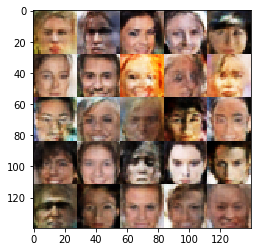

Epoch 4/10... Discriminator Loss: 0.8470... Generator Loss: 1.2620
Epoch 4/10... Discriminator Loss: 2.7546... Generator Loss: 0.1340
Epoch 4/10... Discriminator Loss: 1.0477... Generator Loss: 0.8897
Epoch 4/10... Discriminator Loss: 0.9257... Generator Loss: 1.0539
Epoch 4/10... Discriminator Loss: 1.0713... Generator Loss: 0.7562
Epoch 4/10... Discriminator Loss: 0.9403... Generator Loss: 1.5057
Epoch 4/10... Discriminator Loss: 0.4151... Generator Loss: 3.9214
Epoch 4/10... Discriminator Loss: 0.9160... Generator Loss: 1.1207
Epoch 4/10... Discriminator Loss: 1.1895... Generator Loss: 0.6380
Epoch 4/10... Discriminator Loss: 0.8458... Generator Loss: 1.1077


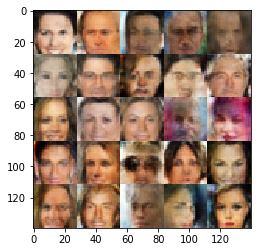

Epoch 4/10... Discriminator Loss: 0.8436... Generator Loss: 1.1263
Epoch 4/10... Discriminator Loss: 1.0678... Generator Loss: 0.7558
Epoch 4/10... Discriminator Loss: 1.2863... Generator Loss: 0.5782
Epoch 4/10... Discriminator Loss: 0.9315... Generator Loss: 0.9423
Epoch 4/10... Discriminator Loss: 1.0292... Generator Loss: 0.8458
Epoch 4/10... Discriminator Loss: 1.0259... Generator Loss: 0.8614
Epoch 4/10... Discriminator Loss: 0.7839... Generator Loss: 1.3807
Epoch 4/10... Discriminator Loss: 0.5131... Generator Loss: 2.4367
Epoch 4/10... Discriminator Loss: 0.9975... Generator Loss: 2.0527
Epoch 4/10... Discriminator Loss: 0.8936... Generator Loss: 1.8616


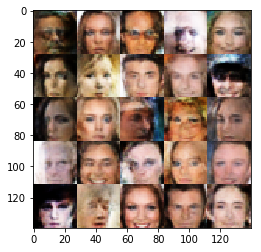

Epoch 4/10... Discriminator Loss: 0.6108... Generator Loss: 2.8053
Epoch 4/10... Discriminator Loss: 0.6675... Generator Loss: 1.6637
Epoch 4/10... Discriminator Loss: 0.9994... Generator Loss: 0.8927
Epoch 4/10... Discriminator Loss: 1.3455... Generator Loss: 0.5249
Epoch 4/10... Discriminator Loss: 0.9328... Generator Loss: 1.0221
Epoch 4/10... Discriminator Loss: 0.8393... Generator Loss: 1.0846
Epoch 4/10... Discriminator Loss: 1.7283... Generator Loss: 0.4117
Epoch 4/10... Discriminator Loss: 1.2125... Generator Loss: 0.7321
Epoch 4/10... Discriminator Loss: 0.9804... Generator Loss: 0.8729
Epoch 4/10... Discriminator Loss: 1.0578... Generator Loss: 0.8702


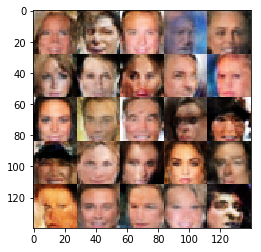

Epoch 4/10... Discriminator Loss: 1.0803... Generator Loss: 0.7780
Epoch 4/10... Discriminator Loss: 1.0580... Generator Loss: 0.8376
Epoch 4/10... Discriminator Loss: 0.7114... Generator Loss: 1.3416
Epoch 4/10... Discriminator Loss: 1.6912... Generator Loss: 0.3669
Epoch 4/10... Discriminator Loss: 1.0556... Generator Loss: 0.7655
Epoch 4/10... Discriminator Loss: 2.0074... Generator Loss: 4.4093
Epoch 4/10... Discriminator Loss: 1.2223... Generator Loss: 0.7224
Epoch 4/10... Discriminator Loss: 0.8307... Generator Loss: 1.4061
Epoch 4/10... Discriminator Loss: 0.9453... Generator Loss: 1.3321
Epoch 4/10... Discriminator Loss: 0.9504... Generator Loss: 1.0115


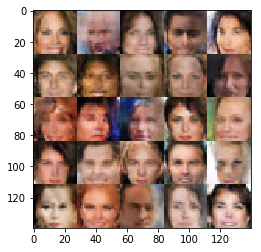

Epoch 4/10... Discriminator Loss: 0.7921... Generator Loss: 1.2048
Epoch 4/10... Discriminator Loss: 1.1680... Generator Loss: 0.6544
Epoch 4/10... Discriminator Loss: 0.8650... Generator Loss: 1.0736
Epoch 4/10... Discriminator Loss: 0.8047... Generator Loss: 1.4857
Epoch 4/10... Discriminator Loss: 0.9722... Generator Loss: 0.9123
Epoch 4/10... Discriminator Loss: 1.5248... Generator Loss: 0.4520
Epoch 4/10... Discriminator Loss: 1.1788... Generator Loss: 0.6475
Epoch 4/10... Discriminator Loss: 1.0365... Generator Loss: 0.8199
Epoch 4/10... Discriminator Loss: 1.2133... Generator Loss: 0.6286
Epoch 4/10... Discriminator Loss: 1.0037... Generator Loss: 2.0478


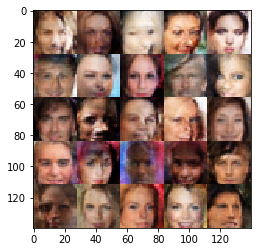

Epoch 4/10... Discriminator Loss: 1.3133... Generator Loss: 0.5810
Epoch 4/10... Discriminator Loss: 0.9306... Generator Loss: 1.2193
Epoch 4/10... Discriminator Loss: 1.2416... Generator Loss: 0.6467
Epoch 4/10... Discriminator Loss: 1.3528... Generator Loss: 0.5142
Epoch 4/10... Discriminator Loss: 3.1535... Generator Loss: 0.1274
Epoch 4/10... Discriminator Loss: 1.1076... Generator Loss: 0.8415
Epoch 4/10... Discriminator Loss: 1.0563... Generator Loss: 0.8392
Epoch 4/10... Discriminator Loss: 1.1770... Generator Loss: 0.6805
Epoch 4/10... Discriminator Loss: 0.9378... Generator Loss: 1.0229
Epoch 4/10... Discriminator Loss: 1.0773... Generator Loss: 0.8113


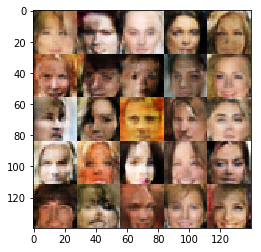

Epoch 4/10... Discriminator Loss: 1.4576... Generator Loss: 0.4841
Epoch 4/10... Discriminator Loss: 1.2209... Generator Loss: 0.6244
Epoch 4/10... Discriminator Loss: 1.0177... Generator Loss: 0.8908
Epoch 4/10... Discriminator Loss: 0.8764... Generator Loss: 1.8714
Epoch 4/10... Discriminator Loss: 1.0366... Generator Loss: 0.8392
Epoch 4/10... Discriminator Loss: 0.8641... Generator Loss: 1.0563
Epoch 4/10... Discriminator Loss: 0.9673... Generator Loss: 0.9339
Epoch 4/10... Discriminator Loss: 0.8222... Generator Loss: 1.3152
Epoch 4/10... Discriminator Loss: 0.9093... Generator Loss: 1.0684
Epoch 4/10... Discriminator Loss: 0.9641... Generator Loss: 1.2317


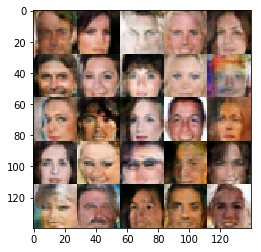

Epoch 4/10... Discriminator Loss: 0.8504... Generator Loss: 1.2728
Epoch 4/10... Discriminator Loss: 0.9558... Generator Loss: 0.9326
Epoch 4/10... Discriminator Loss: 3.7084... Generator Loss: 0.0711
Epoch 4/10... Discriminator Loss: 1.3584... Generator Loss: 0.6519
Epoch 4/10... Discriminator Loss: 1.0883... Generator Loss: 0.8149
Epoch 4/10... Discriminator Loss: 1.0390... Generator Loss: 0.8836
Epoch 4/10... Discriminator Loss: 0.8241... Generator Loss: 1.2673
Epoch 4/10... Discriminator Loss: 0.8904... Generator Loss: 1.0849
Epoch 4/10... Discriminator Loss: 0.4252... Generator Loss: 4.3717
Epoch 4/10... Discriminator Loss: 1.2239... Generator Loss: 0.6299


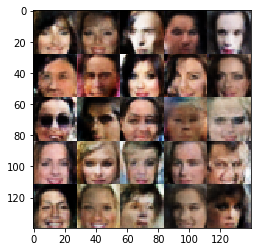

Epoch 4/10... Discriminator Loss: 1.0600... Generator Loss: 0.9790
Epoch 4/10... Discriminator Loss: 0.9110... Generator Loss: 1.1385
Epoch 4/10... Discriminator Loss: 1.2067... Generator Loss: 0.6547
Epoch 4/10... Discriminator Loss: 0.9085... Generator Loss: 1.0985
Epoch 4/10... Discriminator Loss: 1.1412... Generator Loss: 0.7061
Epoch 4/10... Discriminator Loss: 0.9529... Generator Loss: 1.8355
Epoch 4/10... Discriminator Loss: 1.6412... Generator Loss: 0.3913
Epoch 4/10... Discriminator Loss: 1.0752... Generator Loss: 0.8465
Epoch 4/10... Discriminator Loss: 1.0391... Generator Loss: 0.9974
Epoch 4/10... Discriminator Loss: 1.0152... Generator Loss: 0.9116


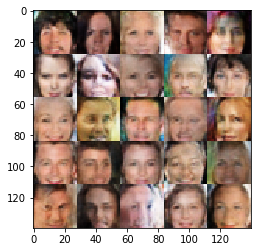

Epoch 4/10... Discriminator Loss: 1.0234... Generator Loss: 1.1139
Epoch 4/10... Discriminator Loss: 0.8878... Generator Loss: 1.0769
Epoch 4/10... Discriminator Loss: 0.9687... Generator Loss: 0.9362
Epoch 4/10... Discriminator Loss: 1.2484... Generator Loss: 0.5950
Epoch 4/10... Discriminator Loss: 1.2535... Generator Loss: 0.6427
Epoch 4/10... Discriminator Loss: 1.5279... Generator Loss: 0.4245
Epoch 4/10... Discriminator Loss: 1.3669... Generator Loss: 0.5791
Epoch 4/10... Discriminator Loss: 1.1488... Generator Loss: 0.6749
Epoch 4/10... Discriminator Loss: 0.8705... Generator Loss: 1.1046
Epoch 4/10... Discriminator Loss: 0.9390... Generator Loss: 2.4998


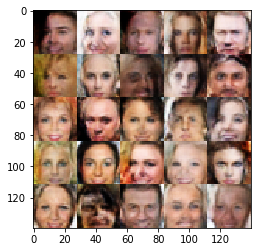

Epoch 4/10... Discriminator Loss: 2.0608... Generator Loss: 3.2566
Epoch 4/10... Discriminator Loss: 1.2937... Generator Loss: 0.5769
Epoch 4/10... Discriminator Loss: 0.8283... Generator Loss: 2.4310
Epoch 4/10... Discriminator Loss: 1.2894... Generator Loss: 0.5678
Epoch 4/10... Discriminator Loss: 0.6463... Generator Loss: 1.6621
Epoch 4/10... Discriminator Loss: 0.9050... Generator Loss: 1.0918
Epoch 4/10... Discriminator Loss: 0.8954... Generator Loss: 1.0448
Epoch 4/10... Discriminator Loss: 1.3258... Generator Loss: 0.5246
Epoch 4/10... Discriminator Loss: 1.1334... Generator Loss: 0.6806
Epoch 4/10... Discriminator Loss: 1.0318... Generator Loss: 0.8404


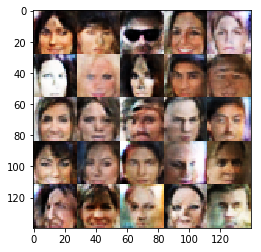

Epoch 4/10... Discriminator Loss: 1.0323... Generator Loss: 0.8240
Epoch 4/10... Discriminator Loss: 1.0314... Generator Loss: 0.8640
Epoch 4/10... Discriminator Loss: 1.2068... Generator Loss: 0.6537
Epoch 4/10... Discriminator Loss: 0.7821... Generator Loss: 1.4795
Epoch 4/10... Discriminator Loss: 1.4983... Generator Loss: 0.4859
Epoch 4/10... Discriminator Loss: 0.9742... Generator Loss: 1.3320
Epoch 4/10... Discriminator Loss: 1.1086... Generator Loss: 0.7714
Epoch 4/10... Discriminator Loss: 0.9415... Generator Loss: 1.0026
Epoch 4/10... Discriminator Loss: 0.8498... Generator Loss: 1.3656
Epoch 4/10... Discriminator Loss: 1.5036... Generator Loss: 0.4861


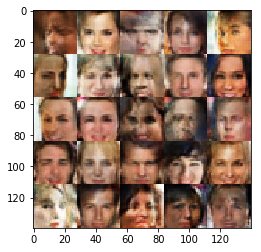

Epoch 4/10... Discriminator Loss: 1.2477... Generator Loss: 0.6359
Epoch 4/10... Discriminator Loss: 0.7837... Generator Loss: 1.4080
Epoch 4/10... Discriminator Loss: 1.2026... Generator Loss: 0.6609
Epoch 4/10... Discriminator Loss: 0.7559... Generator Loss: 1.3121
Epoch 4/10... Discriminator Loss: 0.8516... Generator Loss: 1.2114
Epoch 4/10... Discriminator Loss: 0.9841... Generator Loss: 0.9059
Epoch 4/10... Discriminator Loss: 0.8422... Generator Loss: 1.2038
Epoch 4/10... Discriminator Loss: 0.9319... Generator Loss: 0.9834
Epoch 4/10... Discriminator Loss: 0.7874... Generator Loss: 1.2842
Epoch 4/10... Discriminator Loss: 1.0540... Generator Loss: 0.8712


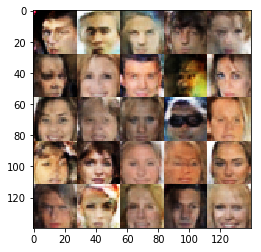

Epoch 4/10... Discriminator Loss: 1.2422... Generator Loss: 0.6028
Epoch 4/10... Discriminator Loss: 0.7167... Generator Loss: 1.4416
Epoch 5/10... Discriminator Loss: 1.5562... Generator Loss: 0.4233
Epoch 5/10... Discriminator Loss: 1.0241... Generator Loss: 0.8568
Epoch 5/10... Discriminator Loss: 1.0968... Generator Loss: 0.7923
Epoch 5/10... Discriminator Loss: 0.7812... Generator Loss: 1.1632
Epoch 5/10... Discriminator Loss: 0.9921... Generator Loss: 0.8596
Epoch 5/10... Discriminator Loss: 2.4324... Generator Loss: 0.1789
Epoch 5/10... Discriminator Loss: 1.0856... Generator Loss: 1.3726
Epoch 5/10... Discriminator Loss: 1.0616... Generator Loss: 0.7956


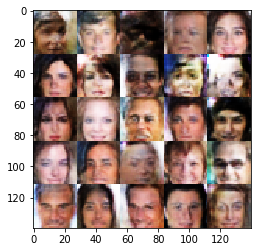

Epoch 5/10... Discriminator Loss: 0.7027... Generator Loss: 1.5344
Epoch 5/10... Discriminator Loss: 0.5283... Generator Loss: 2.2800
Epoch 5/10... Discriminator Loss: 1.0495... Generator Loss: 0.8090
Epoch 5/10... Discriminator Loss: 0.7657... Generator Loss: 2.0800
Epoch 5/10... Discriminator Loss: 0.7927... Generator Loss: 1.3268
Epoch 5/10... Discriminator Loss: 0.9103... Generator Loss: 1.0127
Epoch 5/10... Discriminator Loss: 0.7371... Generator Loss: 1.4475
Epoch 5/10... Discriminator Loss: 1.5507... Generator Loss: 0.4233
Epoch 5/10... Discriminator Loss: 0.8634... Generator Loss: 1.1237
Epoch 5/10... Discriminator Loss: 0.7739... Generator Loss: 1.3413


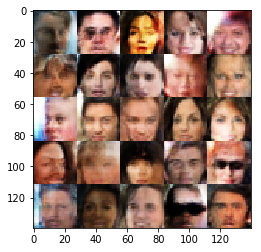

Epoch 5/10... Discriminator Loss: 0.5375... Generator Loss: 2.0639
Epoch 5/10... Discriminator Loss: 1.1214... Generator Loss: 0.7210
Epoch 5/10... Discriminator Loss: 0.5831... Generator Loss: 2.1550
Epoch 5/10... Discriminator Loss: 1.0706... Generator Loss: 0.7905
Epoch 5/10... Discriminator Loss: 1.8437... Generator Loss: 0.3397
Epoch 5/10... Discriminator Loss: 1.0420... Generator Loss: 0.8288
Epoch 5/10... Discriminator Loss: 0.8263... Generator Loss: 1.0956
Epoch 5/10... Discriminator Loss: 1.2695... Generator Loss: 0.5956
Epoch 5/10... Discriminator Loss: 0.7989... Generator Loss: 1.2355
Epoch 5/10... Discriminator Loss: 0.9634... Generator Loss: 0.8828


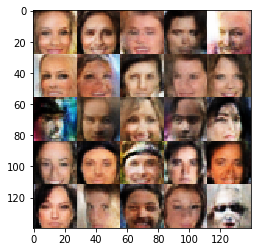

Epoch 5/10... Discriminator Loss: 2.0558... Generator Loss: 0.2597
Epoch 5/10... Discriminator Loss: 1.6517... Generator Loss: 2.8814
Epoch 5/10... Discriminator Loss: 0.9732... Generator Loss: 1.6361
Epoch 5/10... Discriminator Loss: 0.9378... Generator Loss: 1.2299
Epoch 5/10... Discriminator Loss: 0.7675... Generator Loss: 1.4963
Epoch 5/10... Discriminator Loss: 1.1284... Generator Loss: 1.6161
Epoch 5/10... Discriminator Loss: 1.0064... Generator Loss: 0.9137
Epoch 5/10... Discriminator Loss: 0.5729... Generator Loss: 1.9014
Epoch 5/10... Discriminator Loss: 1.0205... Generator Loss: 0.8375
Epoch 5/10... Discriminator Loss: 0.7758... Generator Loss: 1.5792


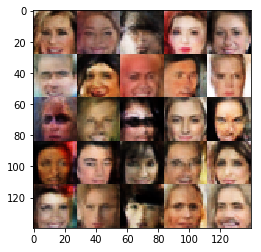

Epoch 5/10... Discriminator Loss: 0.9154... Generator Loss: 1.3557
Epoch 5/10... Discriminator Loss: 1.1200... Generator Loss: 0.7171
Epoch 5/10... Discriminator Loss: 1.4335... Generator Loss: 0.4808
Epoch 5/10... Discriminator Loss: 1.2414... Generator Loss: 0.6235
Epoch 5/10... Discriminator Loss: 0.5489... Generator Loss: 1.9723
Epoch 5/10... Discriminator Loss: 1.3429... Generator Loss: 0.5328
Epoch 5/10... Discriminator Loss: 0.7314... Generator Loss: 2.6119
Epoch 5/10... Discriminator Loss: 1.9788... Generator Loss: 0.2915
Epoch 5/10... Discriminator Loss: 0.9189... Generator Loss: 2.1122
Epoch 5/10... Discriminator Loss: 1.0323... Generator Loss: 0.8234


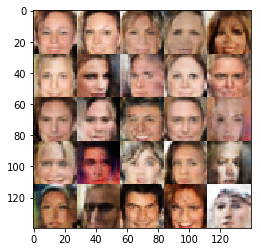

Epoch 5/10... Discriminator Loss: 0.8377... Generator Loss: 1.1297
Epoch 5/10... Discriminator Loss: 1.0750... Generator Loss: 0.7655
Epoch 5/10... Discriminator Loss: 0.3937... Generator Loss: 3.6841
Epoch 5/10... Discriminator Loss: 0.7747... Generator Loss: 1.4820
Epoch 5/10... Discriminator Loss: 0.7691... Generator Loss: 1.3501
Epoch 5/10... Discriminator Loss: 0.9419... Generator Loss: 0.9705
Epoch 5/10... Discriminator Loss: 0.8620... Generator Loss: 1.2561
Epoch 5/10... Discriminator Loss: 1.4836... Generator Loss: 0.4430
Epoch 5/10... Discriminator Loss: 2.2215... Generator Loss: 0.2195
Epoch 5/10... Discriminator Loss: 1.5882... Generator Loss: 3.3664


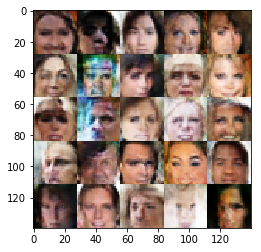

Epoch 5/10... Discriminator Loss: 1.2122... Generator Loss: 0.6944
Epoch 5/10... Discriminator Loss: 0.8629... Generator Loss: 1.2054
Epoch 5/10... Discriminator Loss: 1.0654... Generator Loss: 0.8171
Epoch 5/10... Discriminator Loss: 0.9313... Generator Loss: 1.0064
Epoch 5/10... Discriminator Loss: 1.0506... Generator Loss: 1.0086
Epoch 5/10... Discriminator Loss: 0.8519... Generator Loss: 1.0972
Epoch 5/10... Discriminator Loss: 1.0420... Generator Loss: 0.8174
Epoch 5/10... Discriminator Loss: 1.0160... Generator Loss: 0.9070
Epoch 5/10... Discriminator Loss: 0.8025... Generator Loss: 1.2068
Epoch 5/10... Discriminator Loss: 0.9552... Generator Loss: 2.3324


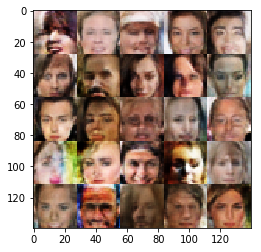

Epoch 5/10... Discriminator Loss: 1.2561... Generator Loss: 0.5985
Epoch 5/10... Discriminator Loss: 0.9231... Generator Loss: 1.0366
Epoch 5/10... Discriminator Loss: 1.0076... Generator Loss: 0.8420
Epoch 5/10... Discriminator Loss: 1.1247... Generator Loss: 0.7514
Epoch 5/10... Discriminator Loss: 1.0787... Generator Loss: 0.7925
Epoch 5/10... Discriminator Loss: 1.0173... Generator Loss: 0.9052
Epoch 5/10... Discriminator Loss: 2.4308... Generator Loss: 3.9238
Epoch 5/10... Discriminator Loss: 1.2284... Generator Loss: 0.6712
Epoch 5/10... Discriminator Loss: 1.0977... Generator Loss: 0.7675
Epoch 5/10... Discriminator Loss: 0.8335... Generator Loss: 1.2635


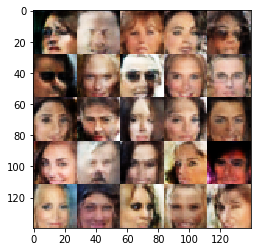

Epoch 5/10... Discriminator Loss: 1.4790... Generator Loss: 0.4404
Epoch 5/10... Discriminator Loss: 0.8665... Generator Loss: 1.0704
Epoch 5/10... Discriminator Loss: 0.9716... Generator Loss: 0.9176
Epoch 5/10... Discriminator Loss: 1.1190... Generator Loss: 0.7036
Epoch 5/10... Discriminator Loss: 0.7386... Generator Loss: 1.4397
Epoch 5/10... Discriminator Loss: 0.8773... Generator Loss: 1.2108
Epoch 5/10... Discriminator Loss: 1.4877... Generator Loss: 0.4268
Epoch 5/10... Discriminator Loss: 1.1644... Generator Loss: 0.6675
Epoch 5/10... Discriminator Loss: 0.8975... Generator Loss: 1.2609
Epoch 5/10... Discriminator Loss: 0.8346... Generator Loss: 1.3367


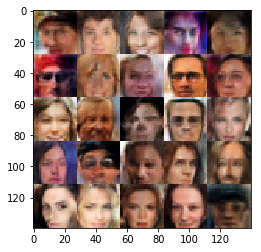

Epoch 5/10... Discriminator Loss: 0.8961... Generator Loss: 1.2246
Epoch 5/10... Discriminator Loss: 0.8685... Generator Loss: 1.0976
Epoch 5/10... Discriminator Loss: 0.9023... Generator Loss: 1.0991
Epoch 5/10... Discriminator Loss: 0.9444... Generator Loss: 0.9378
Epoch 5/10... Discriminator Loss: 0.8772... Generator Loss: 1.2343
Epoch 5/10... Discriminator Loss: 1.3530... Generator Loss: 0.5855
Epoch 5/10... Discriminator Loss: 1.9202... Generator Loss: 0.2944
Epoch 5/10... Discriminator Loss: 1.3045... Generator Loss: 0.7552
Epoch 5/10... Discriminator Loss: 0.9653... Generator Loss: 1.5508
Epoch 5/10... Discriminator Loss: 0.9663... Generator Loss: 0.9865


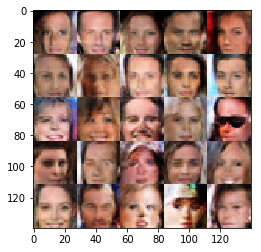

Epoch 5/10... Discriminator Loss: 0.9748... Generator Loss: 0.9300
Epoch 5/10... Discriminator Loss: 0.8768... Generator Loss: 1.8920
Epoch 5/10... Discriminator Loss: 1.1781... Generator Loss: 0.6558
Epoch 5/10... Discriminator Loss: 0.8278... Generator Loss: 1.1243
Epoch 5/10... Discriminator Loss: 1.0402... Generator Loss: 0.8103
Epoch 5/10... Discriminator Loss: 1.4182... Generator Loss: 0.4827
Epoch 5/10... Discriminator Loss: 0.9568... Generator Loss: 0.9475
Epoch 5/10... Discriminator Loss: 0.9249... Generator Loss: 1.4668
Epoch 5/10... Discriminator Loss: 1.2659... Generator Loss: 0.5897
Epoch 5/10... Discriminator Loss: 0.9435... Generator Loss: 1.5661


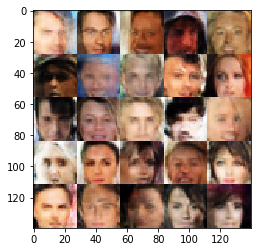

Epoch 5/10... Discriminator Loss: 1.8484... Generator Loss: 3.2844
Epoch 5/10... Discriminator Loss: 1.4663... Generator Loss: 0.5006
Epoch 5/10... Discriminator Loss: 0.9209... Generator Loss: 1.1263
Epoch 5/10... Discriminator Loss: 0.9146... Generator Loss: 1.3592
Epoch 5/10... Discriminator Loss: 1.0994... Generator Loss: 0.8150
Epoch 5/10... Discriminator Loss: 0.7694... Generator Loss: 1.2594
Epoch 5/10... Discriminator Loss: 0.9886... Generator Loss: 0.8851
Epoch 5/10... Discriminator Loss: 1.4785... Generator Loss: 0.4723
Epoch 5/10... Discriminator Loss: 0.8919... Generator Loss: 1.5923
Epoch 5/10... Discriminator Loss: 0.8779... Generator Loss: 1.1005


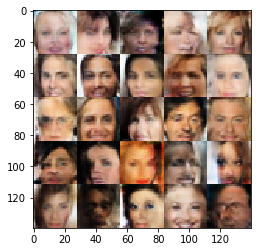

Epoch 5/10... Discriminator Loss: 1.1041... Generator Loss: 0.7370
Epoch 5/10... Discriminator Loss: 1.1100... Generator Loss: 0.7215
Epoch 5/10... Discriminator Loss: 1.5966... Generator Loss: 0.3931
Epoch 5/10... Discriminator Loss: 0.8975... Generator Loss: 1.0356
Epoch 5/10... Discriminator Loss: 0.8044... Generator Loss: 1.5443
Epoch 5/10... Discriminator Loss: 1.2896... Generator Loss: 0.5527
Epoch 5/10... Discriminator Loss: 0.9244... Generator Loss: 1.0119
Epoch 5/10... Discriminator Loss: 0.9985... Generator Loss: 0.8993
Epoch 5/10... Discriminator Loss: 3.2248... Generator Loss: 0.0952
Epoch 5/10... Discriminator Loss: 1.2332... Generator Loss: 0.6519


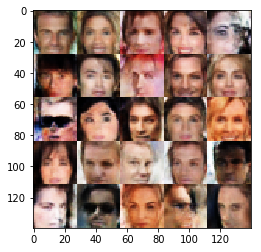

Epoch 5/10... Discriminator Loss: 1.1484... Generator Loss: 0.7481
Epoch 5/10... Discriminator Loss: 1.1083... Generator Loss: 0.7407
Epoch 5/10... Discriminator Loss: 1.0893... Generator Loss: 0.7899
Epoch 5/10... Discriminator Loss: 0.8388... Generator Loss: 1.1688
Epoch 5/10... Discriminator Loss: 1.0540... Generator Loss: 0.8224
Epoch 5/10... Discriminator Loss: 0.9455... Generator Loss: 1.1554
Epoch 5/10... Discriminator Loss: 0.6385... Generator Loss: 1.6515
Epoch 5/10... Discriminator Loss: 0.9276... Generator Loss: 1.0986
Epoch 5/10... Discriminator Loss: 0.8289... Generator Loss: 1.1866
Epoch 5/10... Discriminator Loss: 1.3530... Generator Loss: 0.5557


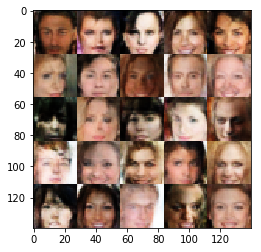

Epoch 5/10... Discriminator Loss: 0.9104... Generator Loss: 1.0164
Epoch 5/10... Discriminator Loss: 1.2045... Generator Loss: 0.6387
Epoch 5/10... Discriminator Loss: 1.6521... Generator Loss: 0.3736
Epoch 5/10... Discriminator Loss: 2.7372... Generator Loss: 3.5417
Epoch 5/10... Discriminator Loss: 1.0020... Generator Loss: 0.9116
Epoch 5/10... Discriminator Loss: 1.0616... Generator Loss: 0.8169
Epoch 5/10... Discriminator Loss: 1.4375... Generator Loss: 0.4908
Epoch 5/10... Discriminator Loss: 1.3197... Generator Loss: 0.5670
Epoch 5/10... Discriminator Loss: 0.7242... Generator Loss: 1.6728
Epoch 5/10... Discriminator Loss: 1.0395... Generator Loss: 0.7874


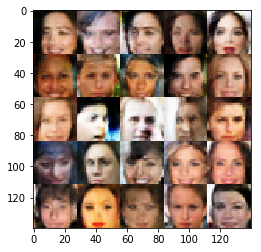

Epoch 5/10... Discriminator Loss: 1.1092... Generator Loss: 0.7361
Epoch 5/10... Discriminator Loss: 1.2737... Generator Loss: 0.6031
Epoch 5/10... Discriminator Loss: 0.8309... Generator Loss: 1.7554
Epoch 5/10... Discriminator Loss: 1.0404... Generator Loss: 2.4748
Epoch 5/10... Discriminator Loss: 1.0419... Generator Loss: 0.8461
Epoch 5/10... Discriminator Loss: 1.1594... Generator Loss: 0.6864
Epoch 5/10... Discriminator Loss: 1.2262... Generator Loss: 0.6348
Epoch 5/10... Discriminator Loss: 0.7719... Generator Loss: 1.2891
Epoch 5/10... Discriminator Loss: 1.7730... Generator Loss: 0.3788
Epoch 5/10... Discriminator Loss: 0.9838... Generator Loss: 1.0043


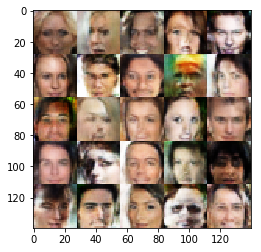

Epoch 5/10... Discriminator Loss: 2.4951... Generator Loss: 0.1981
Epoch 6/10... Discriminator Loss: 1.0468... Generator Loss: 0.9241
Epoch 6/10... Discriminator Loss: 1.0664... Generator Loss: 1.0406
Epoch 6/10... Discriminator Loss: 0.8175... Generator Loss: 1.4537
Epoch 6/10... Discriminator Loss: 0.8726... Generator Loss: 1.1336
Epoch 6/10... Discriminator Loss: 1.5941... Generator Loss: 0.4083
Epoch 6/10... Discriminator Loss: 0.8639... Generator Loss: 1.1527
Epoch 6/10... Discriminator Loss: 1.3360... Generator Loss: 0.5401
Epoch 6/10... Discriminator Loss: 0.9334... Generator Loss: 1.2803
Epoch 6/10... Discriminator Loss: 0.9775... Generator Loss: 0.9114


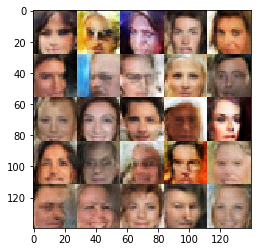

Epoch 6/10... Discriminator Loss: 1.5165... Generator Loss: 0.4332
Epoch 6/10... Discriminator Loss: 1.1310... Generator Loss: 0.7329
Epoch 6/10... Discriminator Loss: 1.3929... Generator Loss: 0.5015
Epoch 6/10... Discriminator Loss: 0.8562... Generator Loss: 1.0701
Epoch 6/10... Discriminator Loss: 0.8741... Generator Loss: 1.6973
Epoch 6/10... Discriminator Loss: 0.8890... Generator Loss: 1.0411
Epoch 6/10... Discriminator Loss: 1.0244... Generator Loss: 0.9479
Epoch 6/10... Discriminator Loss: 0.7371... Generator Loss: 1.3807
Epoch 6/10... Discriminator Loss: 0.9118... Generator Loss: 1.0803
Epoch 6/10... Discriminator Loss: 3.3661... Generator Loss: 4.5689


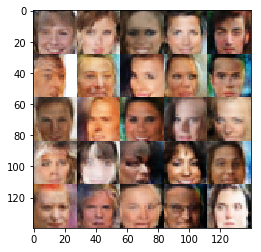

Epoch 6/10... Discriminator Loss: 1.6667... Generator Loss: 0.3925
Epoch 6/10... Discriminator Loss: 1.0096... Generator Loss: 1.2710
Epoch 6/10... Discriminator Loss: 1.6566... Generator Loss: 0.3722
Epoch 6/10... Discriminator Loss: 1.2056... Generator Loss: 0.6515
Epoch 6/10... Discriminator Loss: 1.2207... Generator Loss: 0.6395
Epoch 6/10... Discriminator Loss: 1.0467... Generator Loss: 0.8258
Epoch 6/10... Discriminator Loss: 1.1118... Generator Loss: 0.7232
Epoch 6/10... Discriminator Loss: 0.9368... Generator Loss: 1.0685
Epoch 6/10... Discriminator Loss: 1.0185... Generator Loss: 0.8253
Epoch 6/10... Discriminator Loss: 0.9585... Generator Loss: 0.9296


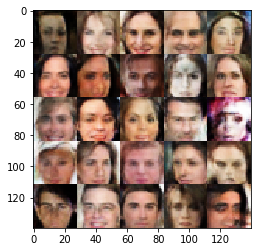

Epoch 6/10... Discriminator Loss: 1.1155... Generator Loss: 0.7140
Epoch 6/10... Discriminator Loss: 0.9021... Generator Loss: 1.1064
Epoch 6/10... Discriminator Loss: 0.9796... Generator Loss: 0.9054
Epoch 6/10... Discriminator Loss: 1.5024... Generator Loss: 0.4572
Epoch 6/10... Discriminator Loss: 0.8710... Generator Loss: 1.5407
Epoch 6/10... Discriminator Loss: 1.6796... Generator Loss: 0.3705
Epoch 6/10... Discriminator Loss: 1.4759... Generator Loss: 0.5516
Epoch 6/10... Discriminator Loss: 0.9719... Generator Loss: 1.2664
Epoch 6/10... Discriminator Loss: 1.0116... Generator Loss: 0.8908
Epoch 6/10... Discriminator Loss: 0.9774... Generator Loss: 1.0326


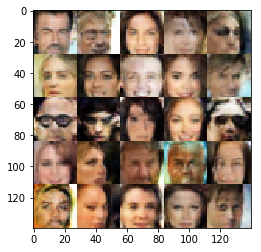

Epoch 6/10... Discriminator Loss: 0.9148... Generator Loss: 1.0279
Epoch 6/10... Discriminator Loss: 0.9570... Generator Loss: 0.9489
Epoch 6/10... Discriminator Loss: 1.3445... Generator Loss: 0.5493
Epoch 6/10... Discriminator Loss: 0.9390... Generator Loss: 1.0974
Epoch 6/10... Discriminator Loss: 0.7250... Generator Loss: 1.4478
Epoch 6/10... Discriminator Loss: 0.8995... Generator Loss: 1.2697
Epoch 6/10... Discriminator Loss: 1.0018... Generator Loss: 0.8708
Epoch 6/10... Discriminator Loss: 0.9868... Generator Loss: 0.8487
Epoch 6/10... Discriminator Loss: 1.2553... Generator Loss: 0.5997
Epoch 6/10... Discriminator Loss: 1.6945... Generator Loss: 0.3755


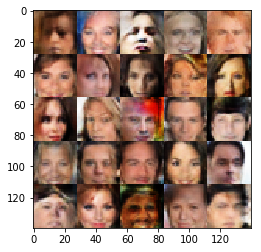

Epoch 6/10... Discriminator Loss: 0.9226... Generator Loss: 1.5353
Epoch 6/10... Discriminator Loss: 0.9205... Generator Loss: 1.1418
Epoch 6/10... Discriminator Loss: 0.9102... Generator Loss: 0.9915
Epoch 6/10... Discriminator Loss: 0.9068... Generator Loss: 1.2708
Epoch 6/10... Discriminator Loss: 0.9251... Generator Loss: 1.0131
Epoch 6/10... Discriminator Loss: 0.7825... Generator Loss: 1.5336
Epoch 6/10... Discriminator Loss: 1.1323... Generator Loss: 0.7580
Epoch 6/10... Discriminator Loss: 0.7751... Generator Loss: 1.4097
Epoch 6/10... Discriminator Loss: 1.3376... Generator Loss: 0.6011
Epoch 6/10... Discriminator Loss: 1.0064... Generator Loss: 0.9760


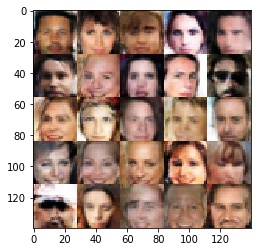

Epoch 6/10... Discriminator Loss: 1.5209... Generator Loss: 0.4510
Epoch 6/10... Discriminator Loss: 0.8078... Generator Loss: 1.3833
Epoch 6/10... Discriminator Loss: 0.5515... Generator Loss: 2.1900
Epoch 6/10... Discriminator Loss: 1.0168... Generator Loss: 0.8608
Epoch 6/10... Discriminator Loss: 1.1708... Generator Loss: 0.6935
Epoch 6/10... Discriminator Loss: 0.8911... Generator Loss: 1.2062
Epoch 6/10... Discriminator Loss: 0.9322... Generator Loss: 1.0552
Epoch 6/10... Discriminator Loss: 0.8793... Generator Loss: 1.6982
Epoch 6/10... Discriminator Loss: 1.2740... Generator Loss: 0.6166
Epoch 6/10... Discriminator Loss: 1.1947... Generator Loss: 0.6877


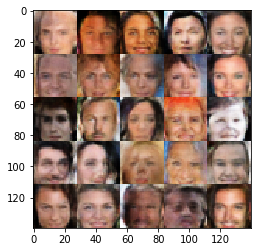

Epoch 6/10... Discriminator Loss: 0.9191... Generator Loss: 1.2204
Epoch 6/10... Discriminator Loss: 1.3954... Generator Loss: 0.5038
Epoch 6/10... Discriminator Loss: 0.8603... Generator Loss: 1.0764
Epoch 6/10... Discriminator Loss: 0.6972... Generator Loss: 1.5379
Epoch 6/10... Discriminator Loss: 1.1061... Generator Loss: 0.7313
Epoch 6/10... Discriminator Loss: 1.3820... Generator Loss: 0.5272
Epoch 6/10... Discriminator Loss: 1.2609... Generator Loss: 0.6735
Epoch 6/10... Discriminator Loss: 1.1457... Generator Loss: 0.7385
Epoch 6/10... Discriminator Loss: 1.3911... Generator Loss: 2.6709
Epoch 6/10... Discriminator Loss: 1.4237... Generator Loss: 0.5009


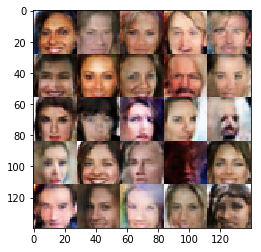

Epoch 6/10... Discriminator Loss: 1.0251... Generator Loss: 0.8776
Epoch 6/10... Discriminator Loss: 1.3282... Generator Loss: 0.5776
Epoch 6/10... Discriminator Loss: 0.9111... Generator Loss: 0.9937
Epoch 6/10... Discriminator Loss: 0.9191... Generator Loss: 0.9818
Epoch 6/10... Discriminator Loss: 1.2630... Generator Loss: 0.6126
Epoch 6/10... Discriminator Loss: 1.0164... Generator Loss: 0.8570
Epoch 6/10... Discriminator Loss: 0.7458... Generator Loss: 1.4432
Epoch 6/10... Discriminator Loss: 0.8700... Generator Loss: 1.0503
Epoch 6/10... Discriminator Loss: 0.7369... Generator Loss: 1.9062
Epoch 6/10... Discriminator Loss: 1.1765... Generator Loss: 0.6660


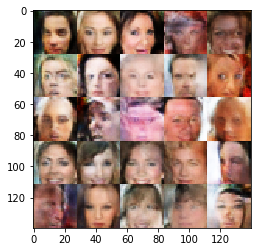

Epoch 6/10... Discriminator Loss: 0.7990... Generator Loss: 1.6418
Epoch 6/10... Discriminator Loss: 1.3682... Generator Loss: 0.5206
Epoch 6/10... Discriminator Loss: 0.9771... Generator Loss: 0.9010
Epoch 6/10... Discriminator Loss: 1.0653... Generator Loss: 0.7822
Epoch 6/10... Discriminator Loss: 0.9247... Generator Loss: 0.9691
Epoch 6/10... Discriminator Loss: 2.8554... Generator Loss: 3.8379
Epoch 6/10... Discriminator Loss: 0.7787... Generator Loss: 1.8994
Epoch 6/10... Discriminator Loss: 0.9766... Generator Loss: 1.2730
Epoch 6/10... Discriminator Loss: 1.1680... Generator Loss: 0.6729
Epoch 6/10... Discriminator Loss: 0.8243... Generator Loss: 1.2521


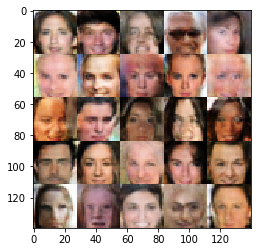

Epoch 6/10... Discriminator Loss: 1.0487... Generator Loss: 0.7853
Epoch 6/10... Discriminator Loss: 0.6868... Generator Loss: 1.9401
Epoch 6/10... Discriminator Loss: 1.3752... Generator Loss: 0.5450
Epoch 6/10... Discriminator Loss: 0.8822... Generator Loss: 1.0500
Epoch 6/10... Discriminator Loss: 1.1793... Generator Loss: 0.6842
Epoch 6/10... Discriminator Loss: 0.8942... Generator Loss: 1.0728
Epoch 6/10... Discriminator Loss: 0.9631... Generator Loss: 0.9548
Epoch 6/10... Discriminator Loss: 0.8529... Generator Loss: 1.0954
Epoch 6/10... Discriminator Loss: 0.9498... Generator Loss: 1.0082
Epoch 6/10... Discriminator Loss: 0.8690... Generator Loss: 1.0483


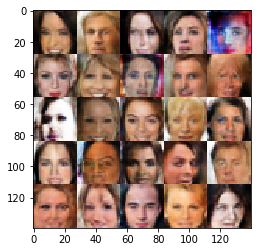

Epoch 6/10... Discriminator Loss: 0.9984... Generator Loss: 1.0506
Epoch 6/10... Discriminator Loss: 0.7775... Generator Loss: 1.3491
Epoch 6/10... Discriminator Loss: 1.4712... Generator Loss: 0.4877
Epoch 6/10... Discriminator Loss: 2.1563... Generator Loss: 0.2931
Epoch 6/10... Discriminator Loss: 1.7489... Generator Loss: 0.3621
Epoch 6/10... Discriminator Loss: 2.0218... Generator Loss: 0.3379
Epoch 6/10... Discriminator Loss: 0.9814... Generator Loss: 1.1056
Epoch 6/10... Discriminator Loss: 1.1597... Generator Loss: 0.7323
Epoch 6/10... Discriminator Loss: 0.9936... Generator Loss: 0.8779
Epoch 6/10... Discriminator Loss: 0.5152... Generator Loss: 2.4223


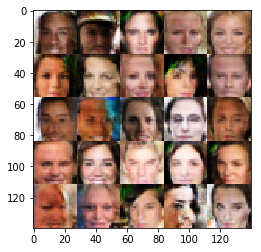

Epoch 6/10... Discriminator Loss: 0.9563... Generator Loss: 0.9071
Epoch 6/10... Discriminator Loss: 1.3003... Generator Loss: 0.5932
Epoch 6/10... Discriminator Loss: 0.8960... Generator Loss: 1.0324
Epoch 6/10... Discriminator Loss: 1.0429... Generator Loss: 0.8805
Epoch 6/10... Discriminator Loss: 0.8569... Generator Loss: 1.2163
Epoch 6/10... Discriminator Loss: 1.2626... Generator Loss: 0.6198
Epoch 6/10... Discriminator Loss: 1.1288... Generator Loss: 0.7178
Epoch 6/10... Discriminator Loss: 0.9974... Generator Loss: 2.1063
Epoch 6/10... Discriminator Loss: 1.2291... Generator Loss: 0.6492
Epoch 6/10... Discriminator Loss: 0.9134... Generator Loss: 1.0049


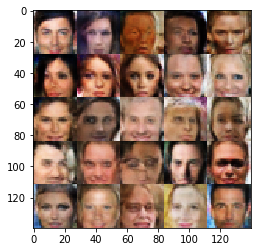

Epoch 6/10... Discriminator Loss: 1.0485... Generator Loss: 0.8061
Epoch 6/10... Discriminator Loss: 0.7998... Generator Loss: 1.5253
Epoch 6/10... Discriminator Loss: 0.8901... Generator Loss: 1.5053
Epoch 6/10... Discriminator Loss: 1.0769... Generator Loss: 0.8748
Epoch 6/10... Discriminator Loss: 1.2665... Generator Loss: 0.5991
Epoch 6/10... Discriminator Loss: 0.7780... Generator Loss: 1.3476
Epoch 6/10... Discriminator Loss: 0.9440... Generator Loss: 0.9629
Epoch 6/10... Discriminator Loss: 1.1481... Generator Loss: 0.7138
Epoch 6/10... Discriminator Loss: 1.7663... Generator Loss: 0.3332
Epoch 6/10... Discriminator Loss: 1.0149... Generator Loss: 1.0892


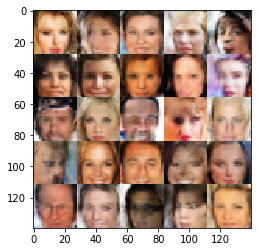

Epoch 6/10... Discriminator Loss: 0.9651... Generator Loss: 0.9323
Epoch 6/10... Discriminator Loss: 0.9616... Generator Loss: 0.9702
Epoch 6/10... Discriminator Loss: 0.7847... Generator Loss: 1.2985
Epoch 6/10... Discriminator Loss: 1.0578... Generator Loss: 0.7550
Epoch 6/10... Discriminator Loss: 1.5245... Generator Loss: 0.4633
Epoch 6/10... Discriminator Loss: 1.3873... Generator Loss: 0.5200
Epoch 6/10... Discriminator Loss: 1.0303... Generator Loss: 0.8247
Epoch 6/10... Discriminator Loss: 1.0304... Generator Loss: 0.8216
Epoch 6/10... Discriminator Loss: 1.0341... Generator Loss: 0.8395
Epoch 6/10... Discriminator Loss: 1.2099... Generator Loss: 0.6230


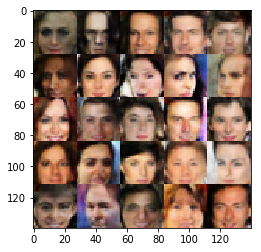

Epoch 6/10... Discriminator Loss: 1.6091... Generator Loss: 0.4143
Epoch 6/10... Discriminator Loss: 1.1808... Generator Loss: 0.7166
Epoch 6/10... Discriminator Loss: 2.2656... Generator Loss: 3.6020
Epoch 6/10... Discriminator Loss: 1.4368... Generator Loss: 0.7493
Epoch 6/10... Discriminator Loss: 0.9504... Generator Loss: 1.4112
Epoch 6/10... Discriminator Loss: 1.4991... Generator Loss: 0.4987
Epoch 6/10... Discriminator Loss: 1.2621... Generator Loss: 0.6674
Epoch 6/10... Discriminator Loss: 1.1098... Generator Loss: 0.7788
Epoch 6/10... Discriminator Loss: 0.9710... Generator Loss: 0.9768
Epoch 7/10... Discriminator Loss: 0.8649... Generator Loss: 1.0921


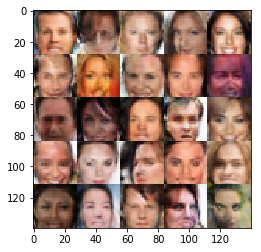

Epoch 7/10... Discriminator Loss: 1.0432... Generator Loss: 0.8002
Epoch 7/10... Discriminator Loss: 1.0467... Generator Loss: 0.7985
Epoch 7/10... Discriminator Loss: 1.2703... Generator Loss: 0.5975
Epoch 7/10... Discriminator Loss: 1.0731... Generator Loss: 0.7673
Epoch 7/10... Discriminator Loss: 1.0127... Generator Loss: 0.8799
Epoch 7/10... Discriminator Loss: 0.9287... Generator Loss: 0.9545
Epoch 7/10... Discriminator Loss: 0.8149... Generator Loss: 2.0247
Epoch 7/10... Discriminator Loss: 1.1865... Generator Loss: 2.0881
Epoch 7/10... Discriminator Loss: 0.8982... Generator Loss: 1.5990
Epoch 7/10... Discriminator Loss: 1.2258... Generator Loss: 0.6418


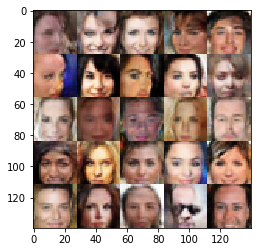

Epoch 7/10... Discriminator Loss: 0.9551... Generator Loss: 0.9227
Epoch 7/10... Discriminator Loss: 0.8863... Generator Loss: 1.0897
Epoch 7/10... Discriminator Loss: 0.9250... Generator Loss: 1.0265
Epoch 7/10... Discriminator Loss: 0.7401... Generator Loss: 1.2789
Epoch 7/10... Discriminator Loss: 0.8375... Generator Loss: 1.4114
Epoch 7/10... Discriminator Loss: 1.0208... Generator Loss: 1.3892
Epoch 7/10... Discriminator Loss: 1.6411... Generator Loss: 0.3855
Epoch 7/10... Discriminator Loss: 1.6651... Generator Loss: 0.3724
Epoch 7/10... Discriminator Loss: 1.6288... Generator Loss: 0.4215
Epoch 7/10... Discriminator Loss: 1.0048... Generator Loss: 0.9307


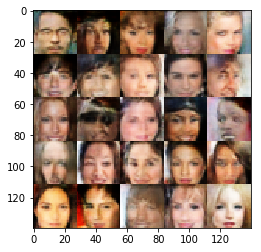

Epoch 7/10... Discriminator Loss: 1.3616... Generator Loss: 0.5273
Epoch 7/10... Discriminator Loss: 0.8144... Generator Loss: 1.5955
Epoch 7/10... Discriminator Loss: 0.9032... Generator Loss: 1.1826
Epoch 7/10... Discriminator Loss: 1.1387... Generator Loss: 0.7373
Epoch 7/10... Discriminator Loss: 1.0380... Generator Loss: 0.8011
Epoch 7/10... Discriminator Loss: 0.8857... Generator Loss: 1.4518
Epoch 7/10... Discriminator Loss: 0.9452... Generator Loss: 1.0138
Epoch 7/10... Discriminator Loss: 0.8358... Generator Loss: 1.3008
Epoch 7/10... Discriminator Loss: 0.8502... Generator Loss: 1.2296
Epoch 7/10... Discriminator Loss: 0.9448... Generator Loss: 0.9357


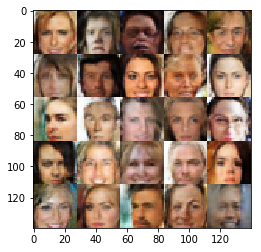

Epoch 7/10... Discriminator Loss: 0.8682... Generator Loss: 1.0864
Epoch 7/10... Discriminator Loss: 0.8893... Generator Loss: 1.0288
Epoch 7/10... Discriminator Loss: 0.8668... Generator Loss: 1.0868
Epoch 7/10... Discriminator Loss: 0.8601... Generator Loss: 1.5679
Epoch 7/10... Discriminator Loss: 1.7524... Generator Loss: 0.3525
Epoch 7/10... Discriminator Loss: 0.9678... Generator Loss: 1.1479
Epoch 7/10... Discriminator Loss: 1.3615... Generator Loss: 0.5205
Epoch 7/10... Discriminator Loss: 1.4060... Generator Loss: 2.7882
Epoch 7/10... Discriminator Loss: 1.5720... Generator Loss: 0.4370
Epoch 7/10... Discriminator Loss: 0.8970... Generator Loss: 1.0908


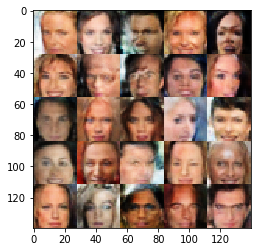

Epoch 7/10... Discriminator Loss: 1.0738... Generator Loss: 0.7562
Epoch 7/10... Discriminator Loss: 0.8757... Generator Loss: 1.1803
Epoch 7/10... Discriminator Loss: 1.0782... Generator Loss: 0.7749
Epoch 7/10... Discriminator Loss: 1.1584... Generator Loss: 0.6965
Epoch 7/10... Discriminator Loss: 1.1187... Generator Loss: 0.7917
Epoch 7/10... Discriminator Loss: 1.0203... Generator Loss: 0.8421
Epoch 7/10... Discriminator Loss: 1.3137... Generator Loss: 0.5829
Epoch 7/10... Discriminator Loss: 0.8811... Generator Loss: 1.4381
Epoch 7/10... Discriminator Loss: 0.9365... Generator Loss: 0.9891
Epoch 7/10... Discriminator Loss: 0.9219... Generator Loss: 1.5248


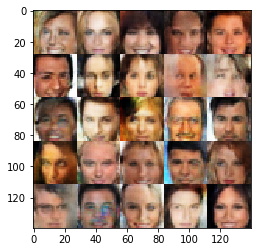

Epoch 7/10... Discriminator Loss: 1.4041... Generator Loss: 0.5559
Epoch 7/10... Discriminator Loss: 1.4762... Generator Loss: 3.0569
Epoch 7/10... Discriminator Loss: 0.9795... Generator Loss: 1.1109
Epoch 7/10... Discriminator Loss: 1.0718... Generator Loss: 2.7895
Epoch 7/10... Discriminator Loss: 1.0987... Generator Loss: 0.8248
Epoch 7/10... Discriminator Loss: 1.3660... Generator Loss: 0.5391
Epoch 7/10... Discriminator Loss: 0.7602... Generator Loss: 1.2775
Epoch 7/10... Discriminator Loss: 0.5666... Generator Loss: 2.0828
Epoch 7/10... Discriminator Loss: 0.9687... Generator Loss: 0.9102
Epoch 7/10... Discriminator Loss: 0.6371... Generator Loss: 1.7337


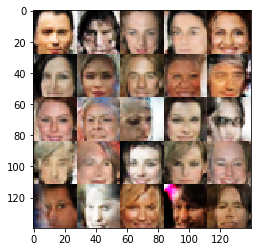

Epoch 7/10... Discriminator Loss: 0.7225... Generator Loss: 1.4830
Epoch 7/10... Discriminator Loss: 0.8171... Generator Loss: 1.2676
Epoch 7/10... Discriminator Loss: 1.2729... Generator Loss: 0.6934
Epoch 7/10... Discriminator Loss: 0.8304... Generator Loss: 1.2012
Epoch 7/10... Discriminator Loss: 1.1904... Generator Loss: 0.6865
Epoch 7/10... Discriminator Loss: 1.4301... Generator Loss: 0.4791
Epoch 7/10... Discriminator Loss: 0.8155... Generator Loss: 1.2100
Epoch 7/10... Discriminator Loss: 0.9429... Generator Loss: 0.9588
Epoch 7/10... Discriminator Loss: 1.2154... Generator Loss: 0.6296
Epoch 7/10... Discriminator Loss: 1.1573... Generator Loss: 0.6775


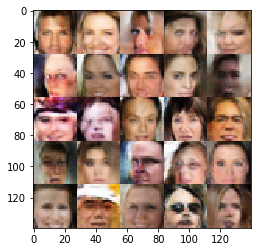

Epoch 7/10... Discriminator Loss: 2.3975... Generator Loss: 0.2941
Epoch 7/10... Discriminator Loss: 1.5299... Generator Loss: 0.4767
Epoch 7/10... Discriminator Loss: 1.7319... Generator Loss: 3.3651
Epoch 7/10... Discriminator Loss: 1.3160... Generator Loss: 0.6040
Epoch 7/10... Discriminator Loss: 1.0293... Generator Loss: 0.9862
Epoch 7/10... Discriminator Loss: 1.0131... Generator Loss: 0.8530
Epoch 7/10... Discriminator Loss: 0.7616... Generator Loss: 1.6034
Epoch 7/10... Discriminator Loss: 0.6188... Generator Loss: 1.7057
Epoch 7/10... Discriminator Loss: 0.8280... Generator Loss: 1.1838
Epoch 7/10... Discriminator Loss: 0.7801... Generator Loss: 1.5456


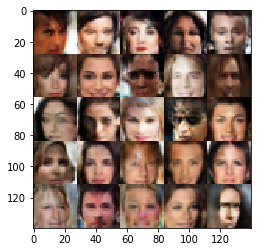

Epoch 7/10... Discriminator Loss: 0.9964... Generator Loss: 1.2856
Epoch 7/10... Discriminator Loss: 1.1144... Generator Loss: 0.7419
Epoch 7/10... Discriminator Loss: 1.4232... Generator Loss: 0.5034
Epoch 7/10... Discriminator Loss: 1.3356... Generator Loss: 0.5583
Epoch 7/10... Discriminator Loss: 0.9220... Generator Loss: 0.9798
Epoch 7/10... Discriminator Loss: 0.9999... Generator Loss: 1.1129
Epoch 7/10... Discriminator Loss: 1.3371... Generator Loss: 0.5741
Epoch 7/10... Discriminator Loss: 1.6729... Generator Loss: 0.3765
Epoch 7/10... Discriminator Loss: 0.8825... Generator Loss: 1.3143
Epoch 7/10... Discriminator Loss: 1.4360... Generator Loss: 0.4748


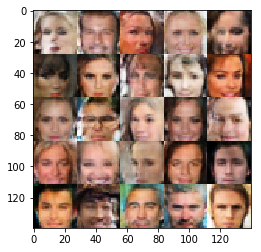

Epoch 7/10... Discriminator Loss: 1.0547... Generator Loss: 0.8119
Epoch 7/10... Discriminator Loss: 1.0181... Generator Loss: 1.0006
Epoch 7/10... Discriminator Loss: 0.7667... Generator Loss: 1.5091
Epoch 7/10... Discriminator Loss: 0.8906... Generator Loss: 1.0821
Epoch 7/10... Discriminator Loss: 1.1045... Generator Loss: 0.7324
Epoch 7/10... Discriminator Loss: 0.7862... Generator Loss: 1.5947
Epoch 7/10... Discriminator Loss: 1.3274... Generator Loss: 0.6238
Epoch 7/10... Discriminator Loss: 0.9016... Generator Loss: 1.0947
Epoch 7/10... Discriminator Loss: 0.7867... Generator Loss: 1.2590
Epoch 7/10... Discriminator Loss: 1.1222... Generator Loss: 0.7462


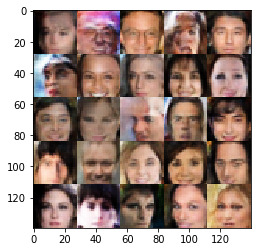

Epoch 7/10... Discriminator Loss: 1.0631... Generator Loss: 0.7966
Epoch 7/10... Discriminator Loss: 0.8228... Generator Loss: 1.1671
Epoch 7/10... Discriminator Loss: 1.1182... Generator Loss: 0.7531
Epoch 7/10... Discriminator Loss: 4.2631... Generator Loss: 5.9416
Epoch 7/10... Discriminator Loss: 0.9816... Generator Loss: 0.9879
Epoch 7/10... Discriminator Loss: 1.6428... Generator Loss: 0.3935
Epoch 7/10... Discriminator Loss: 1.3233... Generator Loss: 0.5952
Epoch 7/10... Discriminator Loss: 0.9624... Generator Loss: 0.9668
Epoch 7/10... Discriminator Loss: 1.1438... Generator Loss: 0.7264
Epoch 7/10... Discriminator Loss: 1.4463... Generator Loss: 0.4773


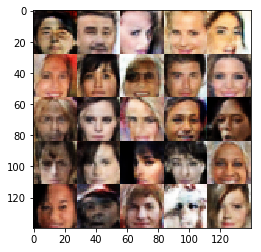

Epoch 7/10... Discriminator Loss: 1.1189... Generator Loss: 0.7570
Epoch 7/10... Discriminator Loss: 0.8456... Generator Loss: 1.1842
Epoch 7/10... Discriminator Loss: 0.9681... Generator Loss: 0.8698
Epoch 7/10... Discriminator Loss: 1.3229... Generator Loss: 0.5435
Epoch 7/10... Discriminator Loss: 1.2763... Generator Loss: 0.6385
Epoch 7/10... Discriminator Loss: 0.9024... Generator Loss: 1.0930
Epoch 7/10... Discriminator Loss: 0.8166... Generator Loss: 1.3652
Epoch 7/10... Discriminator Loss: 1.4637... Generator Loss: 0.4960
Epoch 7/10... Discriminator Loss: 1.3777... Generator Loss: 0.5441
Epoch 7/10... Discriminator Loss: 0.9034... Generator Loss: 1.1895


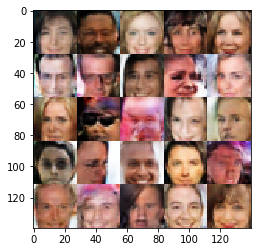

Epoch 7/10... Discriminator Loss: 1.1021... Generator Loss: 0.7812
Epoch 7/10... Discriminator Loss: 0.8638... Generator Loss: 1.0870
Epoch 7/10... Discriminator Loss: 0.9772... Generator Loss: 0.9071
Epoch 7/10... Discriminator Loss: 0.9234... Generator Loss: 1.0316
Epoch 7/10... Discriminator Loss: 1.2693... Generator Loss: 0.5846
Epoch 7/10... Discriminator Loss: 1.1359... Generator Loss: 0.7472
Epoch 7/10... Discriminator Loss: 0.9345... Generator Loss: 1.0409
Epoch 7/10... Discriminator Loss: 0.8285... Generator Loss: 1.1641
Epoch 7/10... Discriminator Loss: 0.8504... Generator Loss: 1.2166
Epoch 7/10... Discriminator Loss: 0.7798... Generator Loss: 1.3519


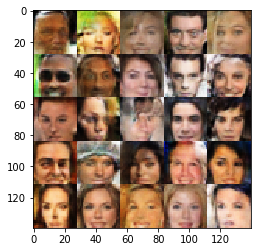

Epoch 7/10... Discriminator Loss: 1.0042... Generator Loss: 0.9380
Epoch 7/10... Discriminator Loss: 0.6825... Generator Loss: 1.7527
Epoch 7/10... Discriminator Loss: 1.1026... Generator Loss: 0.8006
Epoch 7/10... Discriminator Loss: 0.9962... Generator Loss: 0.8695
Epoch 7/10... Discriminator Loss: 1.1046... Generator Loss: 0.7543
Epoch 7/10... Discriminator Loss: 1.0942... Generator Loss: 0.7540
Epoch 7/10... Discriminator Loss: 0.9368... Generator Loss: 0.9637
Epoch 7/10... Discriminator Loss: 0.8267... Generator Loss: 1.2287
Epoch 7/10... Discriminator Loss: 0.8368... Generator Loss: 1.4966
Epoch 7/10... Discriminator Loss: 1.0447... Generator Loss: 0.8270


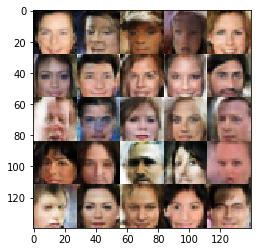

Epoch 7/10... Discriminator Loss: 0.9430... Generator Loss: 0.9240
Epoch 7/10... Discriminator Loss: 1.2397... Generator Loss: 0.6479
Epoch 7/10... Discriminator Loss: 0.9485... Generator Loss: 0.9169
Epoch 7/10... Discriminator Loss: 1.2172... Generator Loss: 0.6303
Epoch 7/10... Discriminator Loss: 0.8798... Generator Loss: 1.6355
Epoch 7/10... Discriminator Loss: 1.2035... Generator Loss: 0.6369
Epoch 7/10... Discriminator Loss: 1.4577... Generator Loss: 0.4594
Epoch 7/10... Discriminator Loss: 4.2837... Generator Loss: 0.0409
Epoch 7/10... Discriminator Loss: 1.3044... Generator Loss: 0.6319
Epoch 7/10... Discriminator Loss: 1.1173... Generator Loss: 2.4847


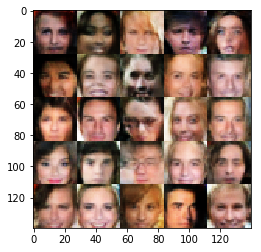

Epoch 7/10... Discriminator Loss: 0.8486... Generator Loss: 1.8637
Epoch 7/10... Discriminator Loss: 0.8718... Generator Loss: 1.1227
Epoch 7/10... Discriminator Loss: 1.1300... Generator Loss: 0.7150
Epoch 7/10... Discriminator Loss: 1.0357... Generator Loss: 0.8239
Epoch 7/10... Discriminator Loss: 0.7967... Generator Loss: 1.2851
Epoch 7/10... Discriminator Loss: 0.5863... Generator Loss: 1.8964
Epoch 7/10... Discriminator Loss: 0.5979... Generator Loss: 2.2208
Epoch 8/10... Discriminator Loss: 0.7509... Generator Loss: 1.3271
Epoch 8/10... Discriminator Loss: 2.1716... Generator Loss: 0.2585
Epoch 8/10... Discriminator Loss: 1.1024... Generator Loss: 0.7819


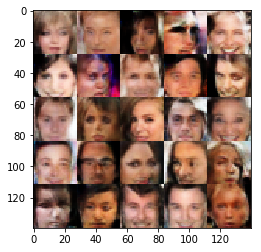

Epoch 8/10... Discriminator Loss: 0.8687... Generator Loss: 1.1706
Epoch 8/10... Discriminator Loss: 0.8242... Generator Loss: 1.2609
Epoch 8/10... Discriminator Loss: 0.8812... Generator Loss: 1.1353
Epoch 8/10... Discriminator Loss: 1.3022... Generator Loss: 0.5848
Epoch 8/10... Discriminator Loss: 0.7979... Generator Loss: 1.3308
Epoch 8/10... Discriminator Loss: 0.7819... Generator Loss: 1.6054
Epoch 8/10... Discriminator Loss: 0.7388... Generator Loss: 1.6497
Epoch 8/10... Discriminator Loss: 1.0434... Generator Loss: 0.8185
Epoch 8/10... Discriminator Loss: 0.8277... Generator Loss: 1.2512
Epoch 8/10... Discriminator Loss: 0.7877... Generator Loss: 1.6011


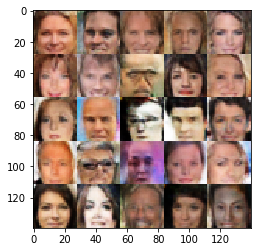

Epoch 8/10... Discriminator Loss: 1.5929... Generator Loss: 0.4074
Epoch 8/10... Discriminator Loss: 1.1127... Generator Loss: 0.7717
Epoch 8/10... Discriminator Loss: 1.2748... Generator Loss: 0.6221
Epoch 8/10... Discriminator Loss: 0.7935... Generator Loss: 1.2166
Epoch 8/10... Discriminator Loss: 1.7744... Generator Loss: 0.3763
Epoch 8/10... Discriminator Loss: 1.4994... Generator Loss: 3.6518
Epoch 8/10... Discriminator Loss: 1.3644... Generator Loss: 0.5540
Epoch 8/10... Discriminator Loss: 1.1738... Generator Loss: 0.6977
Epoch 8/10... Discriminator Loss: 0.7375... Generator Loss: 1.9322
Epoch 8/10... Discriminator Loss: 1.2172... Generator Loss: 0.6434


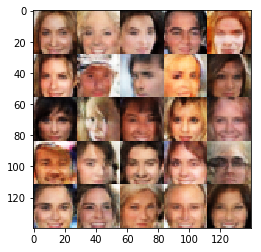

Epoch 8/10... Discriminator Loss: 1.7240... Generator Loss: 0.3917
Epoch 8/10... Discriminator Loss: 0.9981... Generator Loss: 0.8749
Epoch 8/10... Discriminator Loss: 1.0992... Generator Loss: 0.7509
Epoch 8/10... Discriminator Loss: 0.8699... Generator Loss: 1.1581
Epoch 8/10... Discriminator Loss: 0.8998... Generator Loss: 1.0329
Epoch 8/10... Discriminator Loss: 0.8442... Generator Loss: 1.2366
Epoch 8/10... Discriminator Loss: 1.7925... Generator Loss: 0.3427
Epoch 8/10... Discriminator Loss: 1.3217... Generator Loss: 0.5809
Epoch 8/10... Discriminator Loss: 1.1617... Generator Loss: 0.6959
Epoch 8/10... Discriminator Loss: 1.3098... Generator Loss: 0.5997


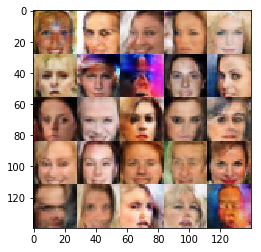

Epoch 8/10... Discriminator Loss: 0.8770... Generator Loss: 1.6330
Epoch 8/10... Discriminator Loss: 1.0275... Generator Loss: 0.8548
Epoch 8/10... Discriminator Loss: 3.8415... Generator Loss: 0.2157
Epoch 8/10... Discriminator Loss: 1.3976... Generator Loss: 1.2873
Epoch 8/10... Discriminator Loss: 1.1842... Generator Loss: 1.0180
Epoch 8/10... Discriminator Loss: 1.3858... Generator Loss: 0.6086
Epoch 8/10... Discriminator Loss: 1.9055... Generator Loss: 0.3183
Epoch 8/10... Discriminator Loss: 1.3018... Generator Loss: 0.6036
Epoch 8/10... Discriminator Loss: 0.7570... Generator Loss: 1.5838
Epoch 8/10... Discriminator Loss: 0.8546... Generator Loss: 1.1431


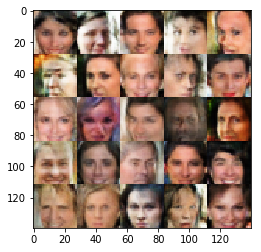

Epoch 8/10... Discriminator Loss: 0.7618... Generator Loss: 1.5573
Epoch 8/10... Discriminator Loss: 1.1721... Generator Loss: 0.6805
Epoch 8/10... Discriminator Loss: 1.0396... Generator Loss: 0.8565
Epoch 8/10... Discriminator Loss: 1.1120... Generator Loss: 0.7304
Epoch 8/10... Discriminator Loss: 0.8031... Generator Loss: 1.5939
Epoch 8/10... Discriminator Loss: 1.3582... Generator Loss: 0.5473
Epoch 8/10... Discriminator Loss: 0.9722... Generator Loss: 0.9095
Epoch 8/10... Discriminator Loss: 0.7915... Generator Loss: 1.4526
Epoch 8/10... Discriminator Loss: 0.8806... Generator Loss: 1.4599
Epoch 8/10... Discriminator Loss: 1.0701... Generator Loss: 0.7701


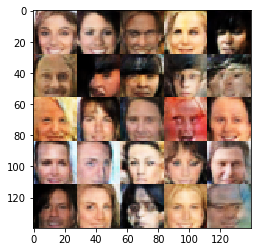

Epoch 8/10... Discriminator Loss: 0.7507... Generator Loss: 1.3240
Epoch 8/10... Discriminator Loss: 1.1258... Generator Loss: 0.7282
Epoch 8/10... Discriminator Loss: 1.2997... Generator Loss: 0.6210
Epoch 8/10... Discriminator Loss: 1.5162... Generator Loss: 0.4473
Epoch 8/10... Discriminator Loss: 1.2650... Generator Loss: 0.6342
Epoch 8/10... Discriminator Loss: 1.1098... Generator Loss: 0.7626
Epoch 8/10... Discriminator Loss: 0.9866... Generator Loss: 0.8583
Epoch 8/10... Discriminator Loss: 0.7924... Generator Loss: 1.5009
Epoch 8/10... Discriminator Loss: 1.4762... Generator Loss: 0.4535
Epoch 8/10... Discriminator Loss: 0.9346... Generator Loss: 0.9453


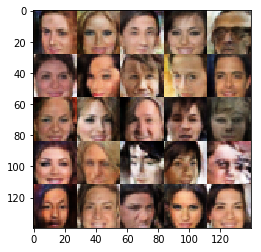

Epoch 8/10... Discriminator Loss: 0.6934... Generator Loss: 1.5130
Epoch 8/10... Discriminator Loss: 0.9766... Generator Loss: 0.9183
Epoch 8/10... Discriminator Loss: 0.7628... Generator Loss: 1.3852
Epoch 8/10... Discriminator Loss: 1.0941... Generator Loss: 0.7763
Epoch 8/10... Discriminator Loss: 0.9850... Generator Loss: 1.0071
Epoch 8/10... Discriminator Loss: 0.8187... Generator Loss: 1.2450
Epoch 8/10... Discriminator Loss: 0.8689... Generator Loss: 1.1534
Epoch 8/10... Discriminator Loss: 0.8732... Generator Loss: 1.1150
Epoch 8/10... Discriminator Loss: 1.1058... Generator Loss: 0.7413
Epoch 8/10... Discriminator Loss: 2.6645... Generator Loss: 4.2624


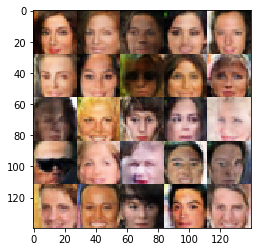

Epoch 8/10... Discriminator Loss: 0.9782... Generator Loss: 1.4378
Epoch 8/10... Discriminator Loss: 0.8172... Generator Loss: 1.5017
Epoch 8/10... Discriminator Loss: 1.1355... Generator Loss: 0.7161
Epoch 8/10... Discriminator Loss: 0.9780... Generator Loss: 0.9260
Epoch 8/10... Discriminator Loss: 0.8912... Generator Loss: 1.0899
Epoch 8/10... Discriminator Loss: 3.1729... Generator Loss: 0.0984
Epoch 8/10... Discriminator Loss: 0.9333... Generator Loss: 1.0512
Epoch 8/10... Discriminator Loss: 1.0592... Generator Loss: 0.8007
Epoch 8/10... Discriminator Loss: 2.0979... Generator Loss: 0.2739
Epoch 8/10... Discriminator Loss: 1.4741... Generator Loss: 0.4774


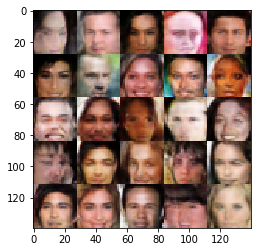

Epoch 8/10... Discriminator Loss: 0.8987... Generator Loss: 1.0705
Epoch 8/10... Discriminator Loss: 0.8441... Generator Loss: 1.1723
Epoch 8/10... Discriminator Loss: 0.8523... Generator Loss: 1.1124
Epoch 8/10... Discriminator Loss: 0.9350... Generator Loss: 0.9244
Epoch 8/10... Discriminator Loss: 0.9759... Generator Loss: 0.9169
Epoch 8/10... Discriminator Loss: 1.2117... Generator Loss: 0.6390
Epoch 8/10... Discriminator Loss: 1.0610... Generator Loss: 0.8131
Epoch 8/10... Discriminator Loss: 0.9463... Generator Loss: 0.9836
Epoch 8/10... Discriminator Loss: 1.0076... Generator Loss: 0.8661
Epoch 8/10... Discriminator Loss: 1.0796... Generator Loss: 0.7920


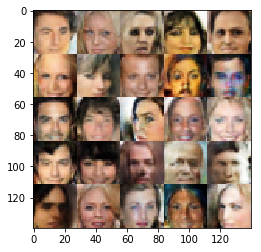

Epoch 8/10... Discriminator Loss: 0.9783... Generator Loss: 0.8869
Epoch 8/10... Discriminator Loss: 0.7901... Generator Loss: 1.4511
Epoch 8/10... Discriminator Loss: 1.5111... Generator Loss: 0.4566
Epoch 8/10... Discriminator Loss: 0.8050... Generator Loss: 2.1060
Epoch 8/10... Discriminator Loss: 1.1375... Generator Loss: 0.7270
Epoch 8/10... Discriminator Loss: 1.0555... Generator Loss: 0.8415
Epoch 8/10... Discriminator Loss: 1.0665... Generator Loss: 0.8042
Epoch 8/10... Discriminator Loss: 1.0962... Generator Loss: 0.7484
Epoch 8/10... Discriminator Loss: 1.0320... Generator Loss: 0.8017
Epoch 8/10... Discriminator Loss: 0.8229... Generator Loss: 1.2498


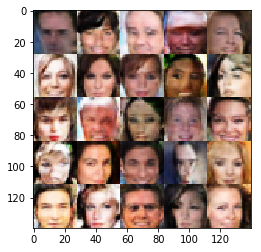

Epoch 8/10... Discriminator Loss: 0.7555... Generator Loss: 1.4058
Epoch 8/10... Discriminator Loss: 1.0238... Generator Loss: 0.8588
Epoch 8/10... Discriminator Loss: 0.8744... Generator Loss: 1.2425
Epoch 8/10... Discriminator Loss: 3.9090... Generator Loss: 0.1588
Epoch 8/10... Discriminator Loss: 1.4212... Generator Loss: 1.2209
Epoch 8/10... Discriminator Loss: 1.3133... Generator Loss: 0.6108
Epoch 8/10... Discriminator Loss: 1.7785... Generator Loss: 3.1522
Epoch 8/10... Discriminator Loss: 0.9793... Generator Loss: 1.0853
Epoch 8/10... Discriminator Loss: 1.5991... Generator Loss: 0.4251
Epoch 8/10... Discriminator Loss: 1.2870... Generator Loss: 0.5808


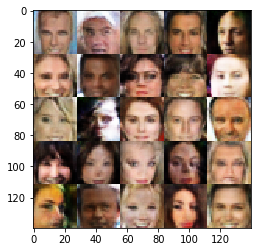

Epoch 8/10... Discriminator Loss: 0.9138... Generator Loss: 1.0882
Epoch 8/10... Discriminator Loss: 0.9717... Generator Loss: 0.8670
Epoch 8/10... Discriminator Loss: 0.8810... Generator Loss: 1.2057
Epoch 8/10... Discriminator Loss: 1.6399... Generator Loss: 0.4093
Epoch 8/10... Discriminator Loss: 0.8833... Generator Loss: 1.0843
Epoch 8/10... Discriminator Loss: 0.9188... Generator Loss: 1.0096
Epoch 8/10... Discriminator Loss: 1.1308... Generator Loss: 0.7347
Epoch 8/10... Discriminator Loss: 0.9939... Generator Loss: 0.8605
Epoch 8/10... Discriminator Loss: 0.8021... Generator Loss: 1.2622
Epoch 8/10... Discriminator Loss: 1.1801... Generator Loss: 0.6835


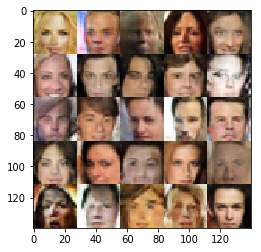

Epoch 8/10... Discriminator Loss: 0.8623... Generator Loss: 1.0720
Epoch 8/10... Discriminator Loss: 0.7235... Generator Loss: 1.8394
Epoch 8/10... Discriminator Loss: 1.3693... Generator Loss: 0.5215
Epoch 8/10... Discriminator Loss: 1.8855... Generator Loss: 0.3210
Epoch 8/10... Discriminator Loss: 1.4232... Generator Loss: 0.5117
Epoch 8/10... Discriminator Loss: 1.0954... Generator Loss: 0.8172
Epoch 8/10... Discriminator Loss: 1.1087... Generator Loss: 0.8810
Epoch 8/10... Discriminator Loss: 0.9944... Generator Loss: 0.9666
Epoch 8/10... Discriminator Loss: 0.8089... Generator Loss: 1.4516
Epoch 8/10... Discriminator Loss: 0.9650... Generator Loss: 0.9784


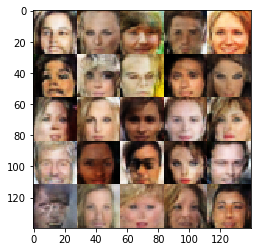

Epoch 8/10... Discriminator Loss: 1.0228... Generator Loss: 0.8520
Epoch 8/10... Discriminator Loss: 0.9294... Generator Loss: 1.2148
Epoch 8/10... Discriminator Loss: 1.1434... Generator Loss: 0.7322
Epoch 8/10... Discriminator Loss: 0.9287... Generator Loss: 1.0377
Epoch 8/10... Discriminator Loss: 0.9094... Generator Loss: 0.9902
Epoch 8/10... Discriminator Loss: 0.9844... Generator Loss: 1.0155
Epoch 8/10... Discriminator Loss: 1.3862... Generator Loss: 0.5543
Epoch 8/10... Discriminator Loss: 0.6520... Generator Loss: 1.6321
Epoch 8/10... Discriminator Loss: 0.9933... Generator Loss: 0.8922
Epoch 8/10... Discriminator Loss: 0.9553... Generator Loss: 0.9465


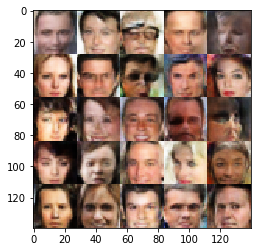

Epoch 8/10... Discriminator Loss: 1.0967... Generator Loss: 0.7646
Epoch 8/10... Discriminator Loss: 0.6887... Generator Loss: 1.7053
Epoch 8/10... Discriminator Loss: 1.1758... Generator Loss: 0.7110
Epoch 8/10... Discriminator Loss: 1.1328... Generator Loss: 0.7108
Epoch 8/10... Discriminator Loss: 0.8695... Generator Loss: 1.1329
Epoch 8/10... Discriminator Loss: 0.8045... Generator Loss: 1.5095
Epoch 8/10... Discriminator Loss: 1.8781... Generator Loss: 0.3205
Epoch 8/10... Discriminator Loss: 0.8298... Generator Loss: 1.8278
Epoch 8/10... Discriminator Loss: 0.7532... Generator Loss: 1.6048
Epoch 8/10... Discriminator Loss: 1.3056... Generator Loss: 0.5901


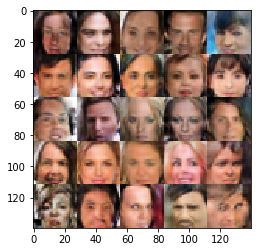

Epoch 8/10... Discriminator Loss: 0.9568... Generator Loss: 0.9703
Epoch 8/10... Discriminator Loss: 0.9213... Generator Loss: 1.6354
Epoch 8/10... Discriminator Loss: 1.0160... Generator Loss: 0.8720
Epoch 8/10... Discriminator Loss: 1.2133... Generator Loss: 0.6681
Epoch 8/10... Discriminator Loss: 0.9693... Generator Loss: 0.9673
Epoch 9/10... Discriminator Loss: 0.7527... Generator Loss: 1.5195
Epoch 9/10... Discriminator Loss: 0.8251... Generator Loss: 1.1954
Epoch 9/10... Discriminator Loss: 0.9132... Generator Loss: 0.9861
Epoch 9/10... Discriminator Loss: 0.7862... Generator Loss: 1.7749
Epoch 9/10... Discriminator Loss: 1.0130... Generator Loss: 0.8599


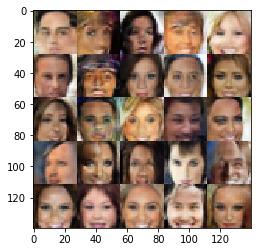

Epoch 9/10... Discriminator Loss: 0.8009... Generator Loss: 1.4236
Epoch 9/10... Discriminator Loss: 2.0212... Generator Loss: 0.3174
Epoch 9/10... Discriminator Loss: 1.1534... Generator Loss: 0.7053
Epoch 9/10... Discriminator Loss: 0.8575... Generator Loss: 1.2677
Epoch 9/10... Discriminator Loss: 0.8770... Generator Loss: 1.0817
Epoch 9/10... Discriminator Loss: 0.7751... Generator Loss: 1.4171
Epoch 9/10... Discriminator Loss: 0.7545... Generator Loss: 1.5137
Epoch 9/10... Discriminator Loss: 0.9859... Generator Loss: 0.8924
Epoch 9/10... Discriminator Loss: 0.9061... Generator Loss: 0.9918
Epoch 9/10... Discriminator Loss: 1.2496... Generator Loss: 0.6378


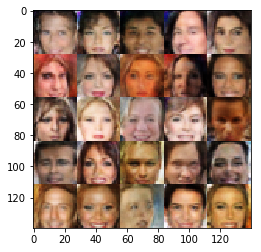

Epoch 9/10... Discriminator Loss: 1.4500... Generator Loss: 0.5418
Epoch 9/10... Discriminator Loss: 0.9926... Generator Loss: 0.8644
Epoch 9/10... Discriminator Loss: 1.2614... Generator Loss: 0.6485
Epoch 9/10... Discriminator Loss: 0.8486... Generator Loss: 1.2220
Epoch 9/10... Discriminator Loss: 0.9116... Generator Loss: 1.0405
Epoch 9/10... Discriminator Loss: 1.4259... Generator Loss: 0.5768
Epoch 9/10... Discriminator Loss: 0.8147... Generator Loss: 1.1709
Epoch 9/10... Discriminator Loss: 1.5353... Generator Loss: 0.4675
Epoch 9/10... Discriminator Loss: 1.0488... Generator Loss: 0.8281
Epoch 9/10... Discriminator Loss: 0.6843... Generator Loss: 1.5979


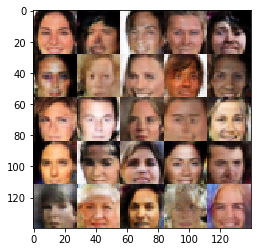

Epoch 9/10... Discriminator Loss: 1.3887... Generator Loss: 0.5412
Epoch 9/10... Discriminator Loss: 0.9324... Generator Loss: 0.9349
Epoch 9/10... Discriminator Loss: 1.0757... Generator Loss: 0.7670
Epoch 9/10... Discriminator Loss: 0.7923... Generator Loss: 1.1799
Epoch 9/10... Discriminator Loss: 1.3582... Generator Loss: 0.5950
Epoch 9/10... Discriminator Loss: 1.6094... Generator Loss: 0.4305
Epoch 9/10... Discriminator Loss: 0.9585... Generator Loss: 1.5491
Epoch 9/10... Discriminator Loss: 1.5468... Generator Loss: 0.4630
Epoch 9/10... Discriminator Loss: 0.9899... Generator Loss: 0.9241
Epoch 9/10... Discriminator Loss: 1.1565... Generator Loss: 0.7002


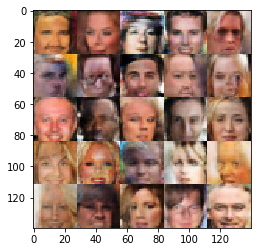

Epoch 9/10... Discriminator Loss: 0.7924... Generator Loss: 1.2658
Epoch 9/10... Discriminator Loss: 0.7799... Generator Loss: 1.4871
Epoch 9/10... Discriminator Loss: 0.9561... Generator Loss: 0.9488
Epoch 9/10... Discriminator Loss: 4.4004... Generator Loss: 6.2380
Epoch 9/10... Discriminator Loss: 1.1870... Generator Loss: 1.2350
Epoch 9/10... Discriminator Loss: 1.3597... Generator Loss: 0.5555
Epoch 9/10... Discriminator Loss: 1.2464... Generator Loss: 0.6937
Epoch 9/10... Discriminator Loss: 0.7175... Generator Loss: 1.7812
Epoch 9/10... Discriminator Loss: 2.2540... Generator Loss: 0.2375
Epoch 9/10... Discriminator Loss: 1.1043... Generator Loss: 0.7800


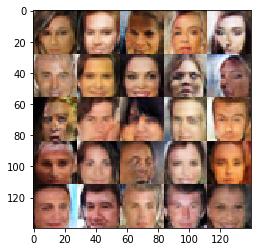

Epoch 9/10... Discriminator Loss: 1.0532... Generator Loss: 0.8805
Epoch 9/10... Discriminator Loss: 0.8202... Generator Loss: 1.2453
Epoch 9/10... Discriminator Loss: 0.7989... Generator Loss: 1.2215
Epoch 9/10... Discriminator Loss: 0.8131... Generator Loss: 1.4136
Epoch 9/10... Discriminator Loss: 0.8671... Generator Loss: 1.1703
Epoch 9/10... Discriminator Loss: 1.0667... Generator Loss: 0.8144
Epoch 9/10... Discriminator Loss: 1.1368... Generator Loss: 0.7621
Epoch 9/10... Discriminator Loss: 0.9273... Generator Loss: 0.9800
Epoch 9/10... Discriminator Loss: 0.8029... Generator Loss: 1.4355
Epoch 9/10... Discriminator Loss: 1.3994... Generator Loss: 0.5301


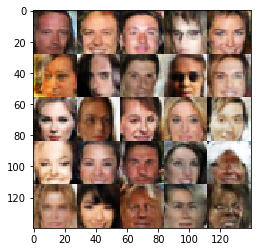

Epoch 9/10... Discriminator Loss: 1.2393... Generator Loss: 0.6528
Epoch 9/10... Discriminator Loss: 1.1122... Generator Loss: 0.7295
Epoch 9/10... Discriminator Loss: 1.9808... Generator Loss: 0.2927
Epoch 9/10... Discriminator Loss: 1.8190... Generator Loss: 0.3296
Epoch 9/10... Discriminator Loss: 1.8677... Generator Loss: 0.3489
Epoch 9/10... Discriminator Loss: 0.8389... Generator Loss: 1.1344
Epoch 9/10... Discriminator Loss: 0.9433... Generator Loss: 0.9978
Epoch 9/10... Discriminator Loss: 0.8664... Generator Loss: 1.6073
Epoch 9/10... Discriminator Loss: 1.1822... Generator Loss: 0.6944
Epoch 9/10... Discriminator Loss: 0.8228... Generator Loss: 1.2698


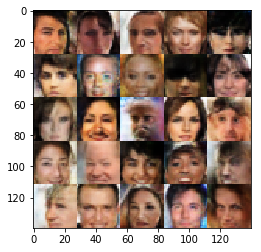

Epoch 9/10... Discriminator Loss: 1.1089... Generator Loss: 0.7482
Epoch 9/10... Discriminator Loss: 1.0312... Generator Loss: 2.7139
Epoch 9/10... Discriminator Loss: 0.9894... Generator Loss: 1.2581
Epoch 9/10... Discriminator Loss: 0.9248... Generator Loss: 1.0338
Epoch 9/10... Discriminator Loss: 0.9232... Generator Loss: 1.0180
Epoch 9/10... Discriminator Loss: 0.9558... Generator Loss: 0.9706
Epoch 9/10... Discriminator Loss: 0.7337... Generator Loss: 1.6242
Epoch 9/10... Discriminator Loss: 0.9584... Generator Loss: 1.0024
Epoch 9/10... Discriminator Loss: 1.0167... Generator Loss: 0.8193
Epoch 9/10... Discriminator Loss: 0.8150... Generator Loss: 1.2002


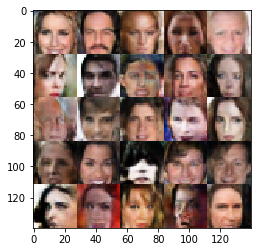

Epoch 9/10... Discriminator Loss: 1.4457... Generator Loss: 3.5219
Epoch 9/10... Discriminator Loss: 1.0966... Generator Loss: 0.7996
Epoch 9/10... Discriminator Loss: 1.3733... Generator Loss: 0.5579
Epoch 9/10... Discriminator Loss: 0.7728... Generator Loss: 1.5035
Epoch 9/10... Discriminator Loss: 1.0300... Generator Loss: 0.8342
Epoch 9/10... Discriminator Loss: 0.9324... Generator Loss: 0.9697
Epoch 9/10... Discriminator Loss: 0.8626... Generator Loss: 1.1186
Epoch 9/10... Discriminator Loss: 0.8165... Generator Loss: 1.1359
Epoch 9/10... Discriminator Loss: 0.8981... Generator Loss: 0.9949
Epoch 9/10... Discriminator Loss: 0.8764... Generator Loss: 1.0537


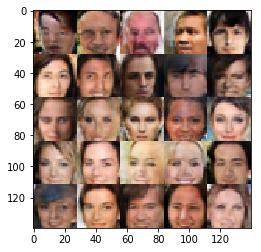

Epoch 9/10... Discriminator Loss: 1.0802... Generator Loss: 0.8140
Epoch 9/10... Discriminator Loss: 1.1025... Generator Loss: 0.8336
Epoch 9/10... Discriminator Loss: 1.2579... Generator Loss: 0.7224
Epoch 9/10... Discriminator Loss: 0.8083... Generator Loss: 2.3455
Epoch 9/10... Discriminator Loss: 0.9504... Generator Loss: 1.0246
Epoch 9/10... Discriminator Loss: 0.8283... Generator Loss: 1.1545
Epoch 9/10... Discriminator Loss: 0.7340... Generator Loss: 1.6238
Epoch 9/10... Discriminator Loss: 1.2535... Generator Loss: 0.6340
Epoch 9/10... Discriminator Loss: 0.7283... Generator Loss: 1.8335
Epoch 9/10... Discriminator Loss: 1.0413... Generator Loss: 0.8003


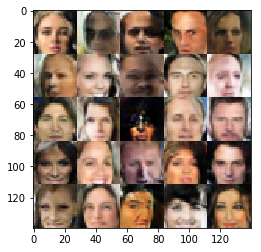

Epoch 9/10... Discriminator Loss: 0.7489... Generator Loss: 1.8309
Epoch 9/10... Discriminator Loss: 1.1858... Generator Loss: 0.6742
Epoch 9/10... Discriminator Loss: 0.8885... Generator Loss: 1.0577
Epoch 9/10... Discriminator Loss: 1.4744... Generator Loss: 0.5212
Epoch 9/10... Discriminator Loss: 0.7806... Generator Loss: 1.4369
Epoch 9/10... Discriminator Loss: 0.7912... Generator Loss: 1.3525
Epoch 9/10... Discriminator Loss: 0.9081... Generator Loss: 1.0444
Epoch 9/10... Discriminator Loss: 0.8367... Generator Loss: 1.1786
Epoch 9/10... Discriminator Loss: 0.7659... Generator Loss: 1.2372
Epoch 9/10... Discriminator Loss: 0.7782... Generator Loss: 1.4491


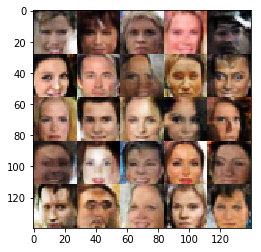

Epoch 9/10... Discriminator Loss: 1.1454... Generator Loss: 0.7680
Epoch 9/10... Discriminator Loss: 0.9467... Generator Loss: 0.9979
Epoch 9/10... Discriminator Loss: 4.1927... Generator Loss: 6.2906
Epoch 9/10... Discriminator Loss: 0.8916... Generator Loss: 1.1242
Epoch 9/10... Discriminator Loss: 0.8096... Generator Loss: 1.4037
Epoch 9/10... Discriminator Loss: 1.4869... Generator Loss: 0.4995
Epoch 9/10... Discriminator Loss: 0.7890... Generator Loss: 1.6850
Epoch 9/10... Discriminator Loss: 0.8744... Generator Loss: 1.0787
Epoch 9/10... Discriminator Loss: 0.8630... Generator Loss: 1.1711
Epoch 9/10... Discriminator Loss: 1.0525... Generator Loss: 0.8255


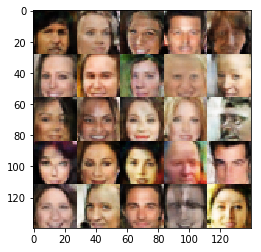

Epoch 9/10... Discriminator Loss: 0.8567... Generator Loss: 1.1768
Epoch 9/10... Discriminator Loss: 0.8635... Generator Loss: 1.9970
Epoch 9/10... Discriminator Loss: 1.3328... Generator Loss: 0.6147
Epoch 9/10... Discriminator Loss: 0.7729... Generator Loss: 1.2971
Epoch 9/10... Discriminator Loss: 1.5509... Generator Loss: 0.4733
Epoch 9/10... Discriminator Loss: 1.7841... Generator Loss: 0.3902
Epoch 9/10... Discriminator Loss: 1.0233... Generator Loss: 0.9151
Epoch 9/10... Discriminator Loss: 1.0090... Generator Loss: 0.8617
Epoch 9/10... Discriminator Loss: 0.8511... Generator Loss: 1.2042
Epoch 9/10... Discriminator Loss: 0.8349... Generator Loss: 1.1709


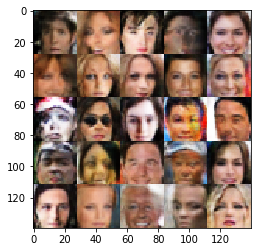

Epoch 9/10... Discriminator Loss: 0.7988... Generator Loss: 1.4654
Epoch 9/10... Discriminator Loss: 0.8310... Generator Loss: 1.1998
Epoch 9/10... Discriminator Loss: 0.9594... Generator Loss: 1.0469
Epoch 9/10... Discriminator Loss: 1.1320... Generator Loss: 1.1336
Epoch 9/10... Discriminator Loss: 0.9740... Generator Loss: 1.1139
Epoch 9/10... Discriminator Loss: 1.1684... Generator Loss: 0.6866
Epoch 9/10... Discriminator Loss: 1.2596... Generator Loss: 0.6388
Epoch 9/10... Discriminator Loss: 1.2581... Generator Loss: 0.6667
Epoch 9/10... Discriminator Loss: 0.8560... Generator Loss: 1.1219
Epoch 9/10... Discriminator Loss: 1.2674... Generator Loss: 0.6255


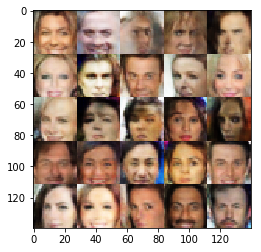

Epoch 9/10... Discriminator Loss: 0.9553... Generator Loss: 0.9286
Epoch 9/10... Discriminator Loss: 0.8388... Generator Loss: 1.1515
Epoch 9/10... Discriminator Loss: 1.1063... Generator Loss: 0.8330
Epoch 9/10... Discriminator Loss: 1.0075... Generator Loss: 0.8861
Epoch 9/10... Discriminator Loss: 1.0306... Generator Loss: 0.8547
Epoch 9/10... Discriminator Loss: 0.8627... Generator Loss: 1.0947
Epoch 9/10... Discriminator Loss: 0.9754... Generator Loss: 1.0190
Epoch 9/10... Discriminator Loss: 0.6897... Generator Loss: 1.8897
Epoch 9/10... Discriminator Loss: 0.8433... Generator Loss: 1.1097
Epoch 9/10... Discriminator Loss: 0.8743... Generator Loss: 0.9979


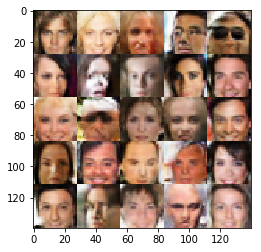

Epoch 9/10... Discriminator Loss: 0.8116... Generator Loss: 1.1669
Epoch 9/10... Discriminator Loss: 1.3283... Generator Loss: 0.5598
Epoch 9/10... Discriminator Loss: 1.6932... Generator Loss: 0.3968
Epoch 9/10... Discriminator Loss: 1.2425... Generator Loss: 0.6326
Epoch 9/10... Discriminator Loss: 1.5738... Generator Loss: 0.4615
Epoch 9/10... Discriminator Loss: 0.8086... Generator Loss: 1.2897
Epoch 9/10... Discriminator Loss: 0.8235... Generator Loss: 1.1800
Epoch 9/10... Discriminator Loss: 0.7580... Generator Loss: 1.3481
Epoch 9/10... Discriminator Loss: 0.8003... Generator Loss: 1.3220
Epoch 9/10... Discriminator Loss: 1.1092... Generator Loss: 0.7465


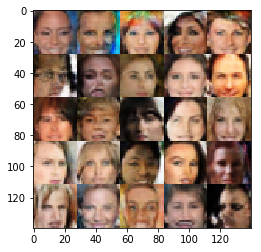

Epoch 9/10... Discriminator Loss: 1.1038... Generator Loss: 0.7553
Epoch 9/10... Discriminator Loss: 1.5978... Generator Loss: 0.4133
Epoch 9/10... Discriminator Loss: 0.6986... Generator Loss: 1.5575
Epoch 10/10... Discriminator Loss: 1.1697... Generator Loss: 0.7070
Epoch 10/10... Discriminator Loss: 1.1285... Generator Loss: 0.7079
Epoch 10/10... Discriminator Loss: 0.8592... Generator Loss: 1.1455
Epoch 10/10... Discriminator Loss: 0.8446... Generator Loss: 1.1077
Epoch 10/10... Discriminator Loss: 2.2490... Generator Loss: 3.8859
Epoch 10/10... Discriminator Loss: 1.1202... Generator Loss: 1.5939
Epoch 10/10... Discriminator Loss: 0.8616... Generator Loss: 1.1843


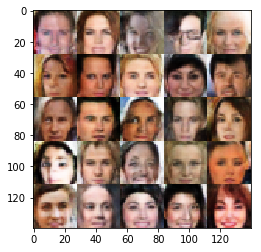

Epoch 10/10... Discriminator Loss: 0.9696... Generator Loss: 0.9659
Epoch 10/10... Discriminator Loss: 0.9518... Generator Loss: 0.9543
Epoch 10/10... Discriminator Loss: 0.8337... Generator Loss: 1.1745
Epoch 10/10... Discriminator Loss: 0.7560... Generator Loss: 1.3072
Epoch 10/10... Discriminator Loss: 1.0725... Generator Loss: 0.8275
Epoch 10/10... Discriminator Loss: 1.2400... Generator Loss: 0.6533
Epoch 10/10... Discriminator Loss: 0.7205... Generator Loss: 2.2194
Epoch 10/10... Discriminator Loss: 1.0737... Generator Loss: 0.7899
Epoch 10/10... Discriminator Loss: 1.1274... Generator Loss: 0.7659
Epoch 10/10... Discriminator Loss: 0.9608... Generator Loss: 0.9764


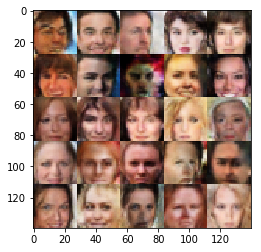

Epoch 10/10... Discriminator Loss: 0.8290... Generator Loss: 1.1165
Epoch 10/10... Discriminator Loss: 0.7713... Generator Loss: 1.6917
Epoch 10/10... Discriminator Loss: 0.6535... Generator Loss: 1.5948
Epoch 10/10... Discriminator Loss: 1.5573... Generator Loss: 0.4912
Epoch 10/10... Discriminator Loss: 0.9175... Generator Loss: 1.0160
Epoch 10/10... Discriminator Loss: 0.8477... Generator Loss: 1.1459
Epoch 10/10... Discriminator Loss: 0.9573... Generator Loss: 0.9305
Epoch 10/10... Discriminator Loss: 1.9070... Generator Loss: 3.8139
Epoch 10/10... Discriminator Loss: 0.9007... Generator Loss: 1.1320
Epoch 10/10... Discriminator Loss: 1.3591... Generator Loss: 0.5720


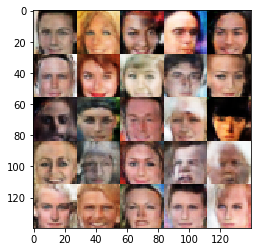

Epoch 10/10... Discriminator Loss: 1.9856... Generator Loss: 0.2962
Epoch 10/10... Discriminator Loss: 0.8045... Generator Loss: 1.4033
Epoch 10/10... Discriminator Loss: 1.4495... Generator Loss: 0.5156
Epoch 10/10... Discriminator Loss: 0.7182... Generator Loss: 1.6492
Epoch 10/10... Discriminator Loss: 1.3452... Generator Loss: 0.5846
Epoch 10/10... Discriminator Loss: 0.9730... Generator Loss: 0.8795
Epoch 10/10... Discriminator Loss: 0.8248... Generator Loss: 1.2175
Epoch 10/10... Discriminator Loss: 1.6995... Generator Loss: 0.3821
Epoch 10/10... Discriminator Loss: 1.1712... Generator Loss: 0.7507
Epoch 10/10... Discriminator Loss: 0.8605... Generator Loss: 1.0942


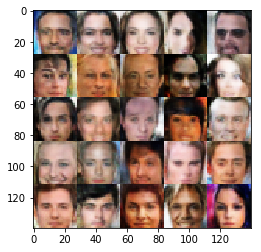

Epoch 10/10... Discriminator Loss: 0.6975... Generator Loss: 1.5776
Epoch 10/10... Discriminator Loss: 0.8284... Generator Loss: 2.3473
Epoch 10/10... Discriminator Loss: 1.2369... Generator Loss: 0.6879
Epoch 10/10... Discriminator Loss: 0.7330... Generator Loss: 2.0714
Epoch 10/10... Discriminator Loss: 1.4189... Generator Loss: 0.5344
Epoch 10/10... Discriminator Loss: 0.6442... Generator Loss: 1.8140
Epoch 10/10... Discriminator Loss: 1.0965... Generator Loss: 0.8032
Epoch 10/10... Discriminator Loss: 0.7684... Generator Loss: 1.3998
Epoch 10/10... Discriminator Loss: 0.7980... Generator Loss: 1.2373
Epoch 10/10... Discriminator Loss: 0.8335... Generator Loss: 1.2577


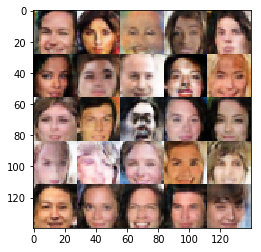

Epoch 10/10... Discriminator Loss: 1.1966... Generator Loss: 0.7101
Epoch 10/10... Discriminator Loss: 0.7281... Generator Loss: 1.6894
Epoch 10/10... Discriminator Loss: 1.1048... Generator Loss: 0.8115
Epoch 10/10... Discriminator Loss: 1.2833... Generator Loss: 0.6403
Epoch 10/10... Discriminator Loss: 0.9047... Generator Loss: 1.0520
Epoch 10/10... Discriminator Loss: 1.1599... Generator Loss: 0.7351
Epoch 10/10... Discriminator Loss: 1.1086... Generator Loss: 0.7492
Epoch 10/10... Discriminator Loss: 0.7265... Generator Loss: 1.6516
Epoch 10/10... Discriminator Loss: 0.8528... Generator Loss: 1.2376
Epoch 10/10... Discriminator Loss: 0.7221... Generator Loss: 1.5213


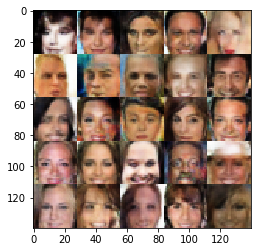

Epoch 10/10... Discriminator Loss: 1.0652... Generator Loss: 0.8061
Epoch 10/10... Discriminator Loss: 0.9257... Generator Loss: 1.0080
Epoch 10/10... Discriminator Loss: 1.4415... Generator Loss: 0.5220
Epoch 10/10... Discriminator Loss: 1.4977... Generator Loss: 0.5018
Epoch 10/10... Discriminator Loss: 2.2162... Generator Loss: 0.2663
Epoch 10/10... Discriminator Loss: 1.2606... Generator Loss: 0.6430
Epoch 10/10... Discriminator Loss: 1.7451... Generator Loss: 0.3949
Epoch 10/10... Discriminator Loss: 1.0258... Generator Loss: 0.8638
Epoch 10/10... Discriminator Loss: 1.0578... Generator Loss: 0.8362
Epoch 10/10... Discriminator Loss: 0.6343... Generator Loss: 1.8542


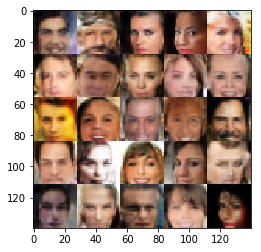

Epoch 10/10... Discriminator Loss: 0.8860... Generator Loss: 1.0491
Epoch 10/10... Discriminator Loss: 0.9845... Generator Loss: 0.9031
Epoch 10/10... Discriminator Loss: 0.8403... Generator Loss: 1.0956
Epoch 10/10... Discriminator Loss: 0.9838... Generator Loss: 2.9449
Epoch 10/10... Discriminator Loss: 1.0094... Generator Loss: 0.8333
Epoch 10/10... Discriminator Loss: 1.0944... Generator Loss: 0.7519
Epoch 10/10... Discriminator Loss: 0.9104... Generator Loss: 1.0310
Epoch 10/10... Discriminator Loss: 0.9498... Generator Loss: 0.9750
Epoch 10/10... Discriminator Loss: 0.7107... Generator Loss: 1.5395
Epoch 10/10... Discriminator Loss: 1.2141... Generator Loss: 0.6514


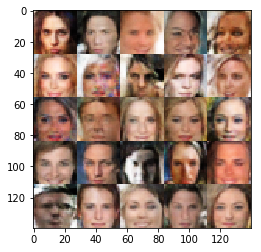

Epoch 10/10... Discriminator Loss: 1.2155... Generator Loss: 1.1653
Epoch 10/10... Discriminator Loss: 0.9832... Generator Loss: 1.0792
Epoch 10/10... Discriminator Loss: 0.8188... Generator Loss: 1.6269
Epoch 10/10... Discriminator Loss: 0.8162... Generator Loss: 1.3510
Epoch 10/10... Discriminator Loss: 0.7252... Generator Loss: 1.4437
Epoch 10/10... Discriminator Loss: 0.7799... Generator Loss: 1.3311
Epoch 10/10... Discriminator Loss: 0.7952... Generator Loss: 1.2530
Epoch 10/10... Discriminator Loss: 0.9809... Generator Loss: 0.9067
Epoch 10/10... Discriminator Loss: 0.8535... Generator Loss: 1.1162
Epoch 10/10... Discriminator Loss: 0.9192... Generator Loss: 0.9945


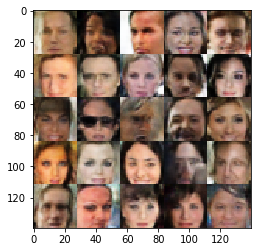

Epoch 10/10... Discriminator Loss: 1.2349... Generator Loss: 0.6271
Epoch 10/10... Discriminator Loss: 0.7559... Generator Loss: 1.3486
Epoch 10/10... Discriminator Loss: 0.7015... Generator Loss: 1.4271
Epoch 10/10... Discriminator Loss: 3.3444... Generator Loss: 4.5387
Epoch 10/10... Discriminator Loss: 0.9091... Generator Loss: 1.0467
Epoch 10/10... Discriminator Loss: 0.7528... Generator Loss: 1.7699
Epoch 10/10... Discriminator Loss: 1.0181... Generator Loss: 0.9075
Epoch 10/10... Discriminator Loss: 1.0433... Generator Loss: 0.8401
Epoch 10/10... Discriminator Loss: 0.8153... Generator Loss: 1.2992
Epoch 10/10... Discriminator Loss: 4.5759... Generator Loss: 6.5250


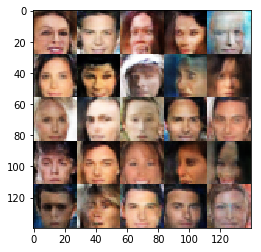

Epoch 10/10... Discriminator Loss: 1.2581... Generator Loss: 0.6896
Epoch 10/10... Discriminator Loss: 0.8291... Generator Loss: 1.5432
Epoch 10/10... Discriminator Loss: 2.6319... Generator Loss: 5.5202
Epoch 10/10... Discriminator Loss: 1.1457... Generator Loss: 1.4635
Epoch 10/10... Discriminator Loss: 0.9964... Generator Loss: 0.9388
Epoch 10/10... Discriminator Loss: 1.2854... Generator Loss: 0.6571
Epoch 10/10... Discriminator Loss: 1.3396... Generator Loss: 0.5853
Epoch 10/10... Discriminator Loss: 0.7231... Generator Loss: 1.5923
Epoch 10/10... Discriminator Loss: 0.8903... Generator Loss: 1.0765
Epoch 10/10... Discriminator Loss: 0.9351... Generator Loss: 0.9524


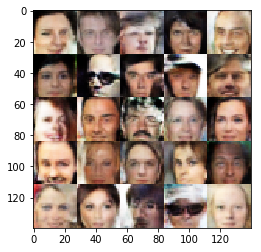

Epoch 10/10... Discriminator Loss: 1.0474... Generator Loss: 0.8066
Epoch 10/10... Discriminator Loss: 1.0392... Generator Loss: 0.8462
Epoch 10/10... Discriminator Loss: 1.7654... Generator Loss: 0.3553
Epoch 10/10... Discriminator Loss: 0.8110... Generator Loss: 1.3238
Epoch 10/10... Discriminator Loss: 1.0572... Generator Loss: 0.8052
Epoch 10/10... Discriminator Loss: 0.9883... Generator Loss: 0.9421
Epoch 10/10... Discriminator Loss: 0.6563... Generator Loss: 1.8608
Epoch 10/10... Discriminator Loss: 0.7983... Generator Loss: 1.2494
Epoch 10/10... Discriminator Loss: 0.7373... Generator Loss: 1.3416
Epoch 10/10... Discriminator Loss: 0.8863... Generator Loss: 1.1014


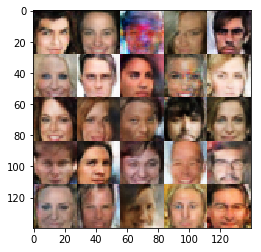

Epoch 10/10... Discriminator Loss: 1.1197... Generator Loss: 0.7543
Epoch 10/10... Discriminator Loss: 1.1048... Generator Loss: 0.7793
Epoch 10/10... Discriminator Loss: 0.8769... Generator Loss: 1.0566
Epoch 10/10... Discriminator Loss: 1.9731... Generator Loss: 0.2828
Epoch 10/10... Discriminator Loss: 1.0453... Generator Loss: 0.8302
Epoch 10/10... Discriminator Loss: 0.7547... Generator Loss: 1.3030
Epoch 10/10... Discriminator Loss: 0.9201... Generator Loss: 1.0140
Epoch 10/10... Discriminator Loss: 1.0206... Generator Loss: 0.8544
Epoch 10/10... Discriminator Loss: 0.7983... Generator Loss: 1.1882
Epoch 10/10... Discriminator Loss: 0.8027... Generator Loss: 1.6085


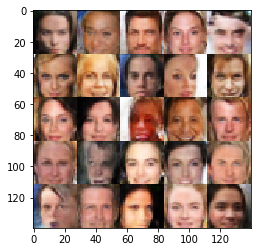

Epoch 10/10... Discriminator Loss: 0.8765... Generator Loss: 1.9315
Epoch 10/10... Discriminator Loss: 1.1103... Generator Loss: 0.7966
Epoch 10/10... Discriminator Loss: 0.8359... Generator Loss: 1.1889
Epoch 10/10... Discriminator Loss: 0.9033... Generator Loss: 0.9764
Epoch 10/10... Discriminator Loss: 1.3307... Generator Loss: 0.6050
Epoch 10/10... Discriminator Loss: 0.8403... Generator Loss: 1.1332
Epoch 10/10... Discriminator Loss: 0.8151... Generator Loss: 1.2675
Epoch 10/10... Discriminator Loss: 1.0464... Generator Loss: 0.8300
Epoch 10/10... Discriminator Loss: 1.7219... Generator Loss: 0.3890
Epoch 10/10... Discriminator Loss: 0.7685... Generator Loss: 1.2880


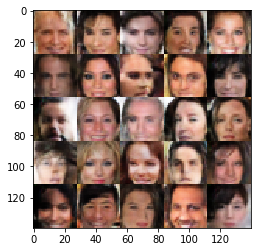

Epoch 10/10... Discriminator Loss: 1.3783... Generator Loss: 0.5463
Epoch 10/10... Discriminator Loss: 0.8758... Generator Loss: 1.0882
Epoch 10/10... Discriminator Loss: 0.7831... Generator Loss: 1.3192
Epoch 10/10... Discriminator Loss: 1.0669... Generator Loss: 0.7874
Epoch 10/10... Discriminator Loss: 0.7525... Generator Loss: 1.2804
Epoch 10/10... Discriminator Loss: 1.0424... Generator Loss: 0.8307
Epoch 10/10... Discriminator Loss: 1.0459... Generator Loss: 3.0483
Epoch 10/10... Discriminator Loss: 1.2211... Generator Loss: 0.6832
Epoch 10/10... Discriminator Loss: 0.9049... Generator Loss: 1.0009
Epoch 10/10... Discriminator Loss: 0.8008... Generator Loss: 1.2252


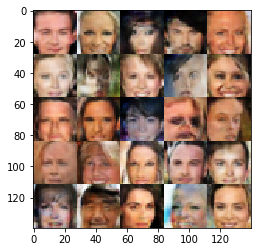

Epoch 10/10... Discriminator Loss: 0.8766... Generator Loss: 1.0374
Epoch 10/10... Discriminator Loss: 1.0017... Generator Loss: 0.8555
Epoch 10/10... Discriminator Loss: 1.1724... Generator Loss: 0.7107
Epoch 10/10... Discriminator Loss: 0.9284... Generator Loss: 0.9946
Epoch 10/10... Discriminator Loss: 0.8770... Generator Loss: 2.5840
Epoch 10/10... Discriminator Loss: 1.2203... Generator Loss: 0.6474
Epoch 10/10... Discriminator Loss: 0.8561... Generator Loss: 1.1312
Epoch 10/10... Discriminator Loss: 0.7553... Generator Loss: 1.2527
Epoch 10/10... Discriminator Loss: 1.1566... Generator Loss: 0.7775
Epoch 10/10... Discriminator Loss: 0.6974... Generator Loss: 1.7748


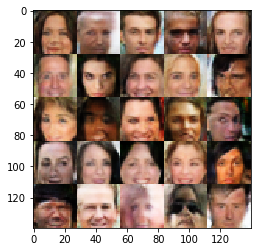

Epoch 10/10... Discriminator Loss: 0.8643... Generator Loss: 1.0948
Epoch 10/10... Discriminator Loss: 1.7110... Generator Loss: 0.3826


In [26]:
batch_size = 128
z_dim = 512
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.